**Processing the NTL data obtaned from GEE VIIRS:**

In [ ]:
from google.colab import drive
import pandas as pd
import os

drive.mount('/content/drive', force_remount=True)


# Base path in your Drive
base_path = '/content/drive/MyDrive/VIIRS'

# Columns to keep
columns_to_keep = [
    "average", "average_masked", "cf_cvg", "cvg", "maximum", "median",
    "median_masked", "minimum", "name", "continent", "status", "year"
]

# Loop over each year
for year in range(2013, 2025):
    file_name = f'Copy of VIIRS_Nighttime_Lights_Per_Country_{year}.csv'
    file_path = os.path.join(base_path, file_name)

    try:
        df = pd.read_csv(file_path)
        df = df[columns_to_keep]
        df = df[df['status'] == "Member State"]
        # Save the filtered file back to Drive
        output_path = os.path.join(base_path, f'Filtered_Nighttime_Lights_{year}.csv')
        df.to_csv(output_path, index=False)
        print(f"Processed and saved filtered data for {year}")
    except Exception as e:
        print(f"Failed to process {year}: {e}")


Mounted at /content/drive
Processed and saved filtered data for 2013
Processed and saved filtered data for 2014
Processed and saved filtered data for 2015
Processed and saved filtered data for 2016
Processed and saved filtered data for 2017
Processed and saved filtered data for 2018
Processed and saved filtered data for 2019
Processed and saved filtered data for 2020
Processed and saved filtered data for 2021
Processed and saved filtered data for 2022
Processed and saved filtered data for 2023
Processed and saved filtered data for 2024


In [ ]:
import pandas as pd
import os
base_path = '/content/drive/MyDrive/VIIRS'
years = list(range(2013, 2025))
band_columns = [
    "average", "average_masked", "cf_cvg", "cvg",
    "maximum", "median", "median_masked", "minimum"
]
band_data = {band: {} for band in band_columns}
for year in years:
    file_path = os.path.join(base_path, f'Filtered_Nighttime_Lights_{year}.csv')
    try:
        df = pd.read_csv(file_path)

        for band in band_columns:
            year_series = df.set_index("name")[band]
            band_data[band][year] = year_series
        print(f"[✓] Loaded data for {year}")
    except Exception as e:
        print(f"[✗] Could not process {year}: {e}")
for band, yearly_dict in band_data.items():
    df_band = pd.DataFrame(yearly_dict)
    df_band.index.name = "Country"
    df_band.columns.name = "Year"

    output_path = os.path.join(base_path, f'TimeSeries_{band}.csv')
    df_band.to_csv(output_path)
    print(f"[💾] Time series saved for '{band}' at '{output_path}'")


[✓] Loaded data for 2013
[✓] Loaded data for 2014
[✓] Loaded data for 2015
[✓] Loaded data for 2016
[✓] Loaded data for 2017
[✓] Loaded data for 2018
[✓] Loaded data for 2019
[✓] Loaded data for 2020
[✓] Loaded data for 2021
[✓] Loaded data for 2022
[✓] Loaded data for 2023
[✓] Loaded data for 2024
[💾] Time series saved for 'average' at '/content/drive/MyDrive/VIIRS/TimeSeries_average.csv'
[💾] Time series saved for 'average_masked' at '/content/drive/MyDrive/VIIRS/TimeSeries_average_masked.csv'
[💾] Time series saved for 'cf_cvg' at '/content/drive/MyDrive/VIIRS/TimeSeries_cf_cvg.csv'
[💾] Time series saved for 'cvg' at '/content/drive/MyDrive/VIIRS/TimeSeries_cvg.csv'
[💾] Time series saved for 'maximum' at '/content/drive/MyDrive/VIIRS/TimeSeries_maximum.csv'
[💾] Time series saved for 'median' at '/content/drive/MyDrive/VIIRS/TimeSeries_median.csv'
[💾] Time series saved for 'median_masked' at '/content/drive/MyDrive/VIIRS/TimeSeries_median_masked.csv'
[💾] Time series saved for 'minimum'

In [ ]:
band_long_format = {band: [] for band in band_columns}
for year in years:
    file_path = os.path.join(base_path, f'Filtered_Nighttime_Lights_{year}.csv')
    try:
        df = pd.read_csv(file_path)

        for band in band_columns:
            temp_df = df[['name', band]].copy()
            temp_df.columns = ['Country', 'Value']
            temp_df['Year'] = year
            band_long_format[band].append(temp_df)

        print(f"[✓] Processed long-format entries for {year}")
    except Exception as e:
        print(f"[✗] Error in {year}: {e}")
for band, df_list in band_long_format.items():
    final_df = pd.concat(df_list, ignore_index=True)
    final_df = final_df[['Country', 'Year', 'Value']]
    output_path = os.path.join(base_path, f'TimeSeries_Long_{band}.csv')
    final_df.to_csv(output_path, index=False)
    print(f"[💾] Saved long-format time series for '{band}' to {output_path}")


[✓] Processed long-format entries for 2013
[✓] Processed long-format entries for 2014
[✓] Processed long-format entries for 2015
[✓] Processed long-format entries for 2016
[✓] Processed long-format entries for 2017
[✓] Processed long-format entries for 2018
[✓] Processed long-format entries for 2019
[✓] Processed long-format entries for 2020
[✓] Processed long-format entries for 2021
[✓] Processed long-format entries for 2022
[✓] Processed long-format entries for 2023
[✓] Processed long-format entries for 2024
[💾] Saved long-format time series for 'average' to /content/drive/MyDrive/VIIRS/TimeSeries_Long_average.csv
[💾] Saved long-format time series for 'average_masked' to /content/drive/MyDrive/VIIRS/TimeSeries_Long_average_masked.csv
[💾] Saved long-format time series for 'cf_cvg' to /content/drive/MyDrive/VIIRS/TimeSeries_Long_cf_cvg.csv
[💾] Saved long-format time series for 'cvg' to /content/drive/MyDrive/VIIRS/TimeSeries_Long_cvg.csv
[💾] Saved long-format time series for 'maximum' 

In [ ]:
print("\n===== 📊 Wide Format CSVs =====\n")
for band in band_columns:
    try:
        file_path = os.path.join(base_path, f'TimeSeries_{band}.csv')
        df = pd.read_csv(file_path)
        print(f"--- Wide Format: {band} ---")
        print(df.head(), "\n")
    except Exception as e:
        print(f"[✗] Could not load wide-format for '{band}': {e}\n")



===== 📊 Wide Format CSVs =====

--- Wide Format: average ---
    Country           2013          2014           2015           2016  \
0    Uganda   80568.152423  38377.541219   94954.399294   80079.783385   
1   Eritrea   17334.094018  -5140.297431   23811.795628  -13843.861870   
2  Ethiopia  373411.504511  84068.147275  446147.510611  118694.440913   
3   Comoros     438.127140     65.815611     -20.684826     -29.814598   
4  Djibouti    6408.293718   1632.336007    8056.913127    1596.463159   

           2017          2018           2019          2020          2021  \
0  2.495805e+05  2.302750e+05  214230.306912  2.915260e+05  3.557552e+05   
1  1.013939e+05  9.344496e+04   68687.366697  1.250686e+05  1.253017e+05   
2  1.078811e+06  1.024449e+06  809540.110025  1.283139e+06  1.412177e+06   
3  1.611504e+03  1.591860e+03    1352.180408  2.025362e+03  2.212411e+03   
4  2.243422e+04  2.188551e+04   18448.865538  2.714751e+04  2.849589e+04   

           2022          2023       

In [ ]:
print("\n===== 📈 Long Format CSVs =====\n")
for band in band_columns:
    try:
        file_path = os.path.join(base_path, f'TimeSeries_Long_{band}.csv')
        df = pd.read_csv(file_path)
        print(f"--- Long Format: {band} ---")
        print(df.head(), "\n")
    except Exception as e:
        print(f"[✗] Could not load long-format for '{band}': {e}\n")


===== 📈 Long Format CSVs =====

--- Long Format: average ---
    Country  Year          Value
0    Uganda  2013   80568.152423
1   Eritrea  2013   17334.094018
2  Ethiopia  2013  373411.504511
3   Comoros  2013     438.127140
4  Djibouti  2013    6408.293718 

--- Long Format: average_masked ---
    Country  Year         Value
0    Uganda  2013  20976.358337
1   Eritrea  2013   2478.380874
2  Ethiopia  2013  47192.432397
3   Comoros  2013    319.710920
4  Djibouti  2013   3232.446825 

--- Long Format: cf_cvg ---
    Country  Year         Value
0    Uganda  2013  6.897851e+07
1   Eritrea  2013  6.857651e+07
2  Ethiopia  2013  4.883410e+08
3   Comoros  2013  8.925347e+05
4  Djibouti  2013  1.082808e+07 

--- Long Format: cvg ---
    Country  Year         Value
0    Uganda  2013  1.864250e+08
1   Eritrea  2013  9.777421e+07
2  Ethiopia  2013  8.787752e+08
3   Comoros  2013  1.353850e+06
4  Djibouti  2013  1.682572e+07 

--- Long Format: maximum ---
    Country  Year         Value
0    U

**GDP DATA FILTERING**

In [ ]:
drive.mount('/content/drive', force_remount=True)
base_path = '/content/drive/MyDrive/VIIRS'

Mounted at /content/drive


In [ ]:
file_path = os.path.join(base_path, f'GDP.csv')
df = pd.read_csv(file_path, skiprows=3)
print(df.head())

                  Country Name Country Code     Indicator Name  \
0                        Aruba          ABW  GDP (current US$)   
1  Africa Eastern and Southern          AFE  GDP (current US$)   
2                  Afghanistan          AFG  GDP (current US$)   
3   Africa Western and Central          AFW  GDP (current US$)   
4                       Angola          AGO  GDP (current US$)   

   Indicator Code          1960          1961          1962          1963  \
0  NY.GDP.MKTP.CD           NaN           NaN           NaN           NaN   
1  NY.GDP.MKTP.CD  2.421063e+10  2.496398e+10  2.707880e+10  3.177575e+10   
2  NY.GDP.MKTP.CD           NaN           NaN           NaN           NaN   
3  NY.GDP.MKTP.CD  1.190495e+10  1.270788e+10  1.363076e+10  1.446909e+10   
4  NY.GDP.MKTP.CD           NaN           NaN           NaN           NaN   

           1964          1965  ...          2015          2016          2017  \
0           NaN           NaN  ...  2.962907e+09  2.983635e+

In [ ]:
columns_needed = ['Country Name', 'Country Code', 'Indicator Name', 'Indicator Code'] + \
                 [str(year) for year in range(2013, 2024)]

gdp_filtered = df[columns_needed]
print(gdp_filtered.head())

                  Country Name Country Code     Indicator Name  \
0                        Aruba          ABW  GDP (current US$)   
1  Africa Eastern and Southern          AFE  GDP (current US$)   
2                  Afghanistan          AFG  GDP (current US$)   
3   Africa Western and Central          AFW  GDP (current US$)   
4                       Angola          AGO  GDP (current US$)   

   Indicator Code          2013          2014          2015          2016  \
0  NY.GDP.MKTP.CD  2.727850e+09  2.790850e+09  2.962907e+09  2.983635e+09   
1  NY.GDP.MKTP.CD  9.623949e+11  9.787083e+11  8.982778e+11  8.289428e+11   
2  NY.GDP.MKTP.CD  2.014642e+10  2.049713e+10  1.913422e+10  1.811657e+10   
3  NY.GDP.MKTP.CD  8.369374e+11  8.974157e+11  7.717669e+11  6.943610e+11   
4  NY.GDP.MKTP.CD  1.323391e+11  1.359668e+11  9.049642e+10  5.276162e+10   

           2017          2018          2019          2020          2021  \
0  3.092429e+09  3.276184e+09  3.395799e+09  2.481857e+09  2.9294

In [ ]:
years = [str(year) for year in range(2013, 2024)]
gdp_cleaned = df[['Country Name'] + years]
print(gdp_cleaned.head())

                  Country Name          2013          2014          2015  \
0                        Aruba  2.727850e+09  2.790850e+09  2.962907e+09   
1  Africa Eastern and Southern  9.623949e+11  9.787083e+11  8.982778e+11   
2                  Afghanistan  2.014642e+10  2.049713e+10  1.913422e+10   
3   Africa Western and Central  8.369374e+11  8.974157e+11  7.717669e+11   
4                       Angola  1.323391e+11  1.359668e+11  9.049642e+10   

           2016          2017          2018          2019          2020  \
0  2.983635e+09  3.092429e+09  3.276184e+09  3.395799e+09  2.481857e+09   
1  8.289428e+11  9.729989e+11  1.012306e+12  1.009721e+12  9.333918e+11   
2  1.811657e+10  1.875346e+10  1.805322e+10  1.879944e+10  1.995593e+10   
3  6.943610e+11  6.878492e+11  7.704950e+11  8.264838e+11  7.898017e+11   
4  5.276162e+10  7.369015e+10  7.945069e+10  7.089796e+10  4.850156e+10   

           2021          2022          2023  
0  2.929447e+09  3.279344e+09  3.648573e+09  


In [ ]:
print("Total rows (with possible NaNs):", len(gdp_cleaned))
gdp_with_nans = gdp_cleaned[gdp_cleaned[years].isna().any(axis=1)]
print(gdp_with_nans.head())
gdp_cleaned_no_nans = gdp_cleaned.dropna(subset=years, how='any')
print("Rows with complete GDP data (2013–2024):", len(gdp_cleaned_no_nans))


Total rows (with possible NaNs): 266
      Country Name          2013          2014          2015          2016  \
11  American Samoa  6.380000e+08  6.430000e+08  6.730000e+08  6.710000e+08   
32          Bhutan  1.943697e+09  2.089080e+09  2.187816e+09  2.357505e+09   
50            Cuba  7.714800e+10  8.065610e+10  8.713280e+10  9.137041e+10   
69         Eritrea           NaN           NaN           NaN           NaN   
84       Gibraltar           NaN           NaN           NaN           NaN   

            2017          2018          2019          2020          2021  \
11  6.120000e+08  6.390000e+08  6.470000e+08  7.210000e+08  7.500000e+08   
32  2.591358e+09  2.583336e+09  2.735684e+09  2.457604e+09  2.768803e+09   
50  9.685065e+10  1.000500e+11  1.034276e+11  1.073518e+11           NaN   
69           NaN           NaN           NaN           NaN           NaN   
84           NaN           NaN           NaN           NaN           NaN   

            2022  2023  
11  8.710000

In [ ]:
try:
    base_path = '/content/drive/MyDrive/VIIRS'
    file_path = os.path.join(base_path, f'TimeSeries_Long_{band}.csv')
    df = pd.read_csv(file_path)
    print(f"--- Long Format: {band} ---")

    # Extract unique country names
    countries_in_band = df['Country'].unique().tolist()
    print("Countries found:", countries_in_band, "\n")

except Exception as e:
    print(f"[✗] Could not load long-format for '{band}': {e}\n")


--- Long Format: minimum ---
Countries found: ['Uganda', 'Eritrea', 'Ethiopia', 'Comoros', 'Djibouti', 'Zambia', 'Rwanda', 'Mozambique', 'Somalia', 'Seychelles', 'Mauritius', 'Burundi', 'Madagascar', 'Malawi', 'Zimbabwe', 'United Republic of Tanzania', 'Kenya', 'Equatorial Guinea', 'Democratic Republic of the Congo', 'Cameroon', 'South Sudan', 'Sao Tome and Principe', 'Gabon', 'Chad', 'Congo', 'Central African Republic', 'Angola', 'Morocco', 'Tunisia', 'Egypt', 'Algeria', 'Libyan Arab Jamahiriya', 'Sudan', 'Botswana', 'Lesotho', 'Swaziland', 'South Africa', 'Namibia', 'Niger', 'Guinea-Bissau', 'Cape Verde', 'Benin', 'Nigeria', 'Gambia', 'Burkina Faso', 'Liberia', 'Senegal', 'Mauritania', "Côte d'Ivoire", 'Sierra Leone', 'Mali', 'Togo', 'Guinea', 'Ghana', 'Jamaica', 'Grenada', 'Dominican Republic', 'Barbados', 'Dominica', 'Trinidad and Tobago', 'Bahamas', 'Saint Kitts and Nevis', 'Saint Lucia', 'Antigua & Barbuda', 'Haiti', 'Cuba', 'Saint Vincent and the Grenadines', 'Belize', 'Guatemal

In [ ]:
countries_in_gdp = gdp_cleaned['Country Name'].unique().tolist()
print("Countries found in gdp:", countries_in_gdp, "\n")
print(len(countries_in_gdp))

Countries found in gdp: ['Aruba', 'Africa Eastern and Southern', 'Afghanistan', 'Africa Western and Central', 'Angola', 'Albania', 'Andorra', 'Arab World', 'United Arab Emirates', 'Argentina', 'Armenia', 'American Samoa', 'Antigua and Barbuda', 'Australia', 'Austria', 'Azerbaijan', 'Burundi', 'Belgium', 'Benin', 'Burkina Faso', 'Bangladesh', 'Bulgaria', 'Bahrain', 'Bahamas, The', 'Bosnia and Herzegovina', 'Belarus', 'Belize', 'Bermuda', 'Bolivia', 'Brazil', 'Barbados', 'Brunei Darussalam', 'Bhutan', 'Botswana', 'Central African Republic', 'Canada', 'Central Europe and the Baltics', 'Switzerland', 'Channel Islands', 'Chile', 'China', "Cote d'Ivoire", 'Cameroon', 'Congo, Dem. Rep.', 'Congo, Rep.', 'Colombia', 'Comoros', 'Cabo Verde', 'Costa Rica', 'Caribbean small states', 'Cuba', 'Curacao', 'Cayman Islands', 'Cyprus', 'Czechia', 'Germany', 'Djibouti', 'Dominica', 'Denmark', 'Dominican Republic', 'Algeria', 'East Asia & Pacific (excluding high income)', 'Early-demographic dividend', 'Eas

In [ ]:
long_to_gdp_mapping = {
    'United Republic of Tanzania': 'Tanzania',
    'Libyan Arab Jamahiriya': 'Libya',
    'Côte d\'Ivoire': "Cote d'Ivoire",
    'Swaziland': 'Eswatini',
    'Sao Tome and Principe': 'Sao Tome and Principe',
    'Congo': 'Congo, Rep.',
    'Democratic Republic of the Congo': 'Congo, Dem. Rep.',
    'The former Yugoslav Republic of Macedonia': 'North Macedonia',
    'U.K. of Great Britain and Northern Ireland': 'United Kingdom',
    'Lao People\'s Democratic Republic': 'Lao PDR',
    'Republic of Korea': 'Korea, Rep.',
    'Democratic People\'s Republic of Korea': "Korea, Dem. People's Rep.",
    'Iran (Islamic Republic of)': 'Iran, Islamic Rep.',
    'Egypt': 'Egypt, Arab Rep.',
    'Gambia': 'Gambia, The',
    'Bahamas': 'Bahamas, The',
    'Moldova, Republic of': 'Moldova',
    'Viet Nam': 'Vietnam',
    'Syria': 'Syrian Arab Republic',
    'Russia': 'Russian Federation',
    'Venezuela': 'Venezuela, RB',
    'Bolivia': 'Bolivia',
    'Brunei': 'Brunei Darussalam',
    'Kyrgyzstan': 'Kyrgyz Republic',
    'Slovakia': 'Slovak Republic',
    'Czech Republic': 'Czechia',
    'Serbia and Montenegro': 'Serbia',
    'Saint Kitts and Nevis': 'St. Kitts and Nevis',
    'Saint Lucia': 'St. Lucia',
    'Saint Vincent and the Grenadines': 'St. Vincent and the Grenadines',
}
gdp_cleaned['Country Name'] = gdp_cleaned['Country Name'].replace(long_to_gdp_mapping)



In [ ]:
gdp_countries = gdp_cleaned['Country Name'].unique().tolist()
matched_countries = list(set(countries_in_band) & set(gdp_countries))
print(f"Total countries in long-format (band): {len(countries_in_band)}")
print(f"Total countries in GDP data: {len(gdp_countries)}")
print(f"Matched countries: {len(matched_countries)}")



Total countries in long-format (band): 193
Total countries in GDP data: 266
Matched countries: 163


In [ ]:
long_to_gdp_mapping.update({
    'Turkey': 'Turkiye',
    'Moldova, Republic of': 'Moldova',
    'Republic of Korea': 'Korea, Rep.',
    "Democratic People's Republic of Korea": "Korea, Dem. People's Rep.",
    'United States of America': 'United States',
    'Micronesia (Federated States of)': 'Micronesia, Fed. Sts.',
    'Bosnia & Herzegovina': 'Bosnia and Herzegovina',
    'Kyrgyzstan': 'Kyrgyz Republic',
    'Cape Verde': 'Cabo Verde',
    'Yemen': 'Yemen, Rep.',
    'Antigua & Barbuda': 'Antigua and Barbuda',
})
df['Country'] = df['Country'].replace(long_to_gdp_mapping)
countries_in_band = df['Country'].unique().tolist()
countries_in_gdp = gdp_cleaned['Country Name'].unique().tolist()

not_in_gdp = [c for c in countries_in_band if c not in countries_in_gdp]
not_in_band = [c for c in countries_in_gdp if c not in countries_in_band]

print(f"Countries in band not in GDP: {len(not_in_gdp)}\n{not_in_gdp}")
print(f"Countries in GDP not in band: {len(not_in_band)}\n{not_in_band}")


Countries in band not in GDP: 0
[]
Countries in GDP not in band: 73
['Aruba', 'Africa Eastern and Southern', 'Africa Western and Central', 'Arab World', 'American Samoa', 'Bermuda', 'Central Europe and the Baltics', 'Channel Islands', 'Caribbean small states', 'Curacao', 'Cayman Islands', 'East Asia & Pacific (excluding high income)', 'Early-demographic dividend', 'East Asia & Pacific', 'Europe & Central Asia (excluding high income)', 'Europe & Central Asia', 'Euro area', 'European Union', 'Fragile and conflict affected situations', 'Faroe Islands', 'Gibraltar', 'Greenland', 'Guam', 'High income', 'Hong Kong SAR, China', 'Heavily indebted poor countries (HIPC)', 'IBRD only', 'IDA & IBRD total', 'IDA total', 'IDA blend', 'IDA only', 'Isle of Man', 'Not classified', 'Latin America & Caribbean (excluding high income)', 'Latin America & Caribbean', 'Least developed countries: UN classification', 'Low income', 'Lower middle income', 'Low & middle income', 'Late-demographic dividend', 'Macao

In [ ]:
df['Country'] = df['Country'].replace(long_to_gdp_mapping)
countries_in_band = df['Country'].unique().tolist()
gdp_matched = gdp_cleaned[gdp_cleaned['Country Name'].isin(countries_in_band)].reset_index(drop=True)
print(f"Final GDP table shape: {gdp_matched.shape}")
display(gdp_matched.head())



Final GDP table shape: (193, 12)


,Country Name,2013,2014,2015,2016,2017,2018,2019,2020,2021,2022,2023
0,Afghanistan,2.014642e+10,2.049713e+10,1.913422e+10,1.811657e+10,1.875346e+10,1.805322e+10,1.879944e+10,1.995593e+10,1.426000e+10,1.449724e+10,1.723305e+10
1,Angola,1.323391e+11,1.359668e+11,9.049642e+10,5.276162e+10,7.369015e+10,7.945069e+10,7.089796e+10,4.850156e+10,6.650513e+10,1.043997e+11,8.482465e+10
2,Albania,1.277622e+10,1.322815e+10,1.138685e+10,1.186120e+10,1.301973e+10,1.537951e+10,1.558511e+10,1.524146e+10,1.803201e+10,1.901724e+10,2.354718e+10
3,Andorra,3.193513e+09,3.271686e+09,2.789881e+09,2.896610e+09,3.000162e+09,3.218420e+09,3.155149e+09,2.891001e+09,3.324648e+09,3.380613e+09,3.785067e+09
4,United Arab Emirates,4.002185e+11,4.141054e+11,3.702755e+11,3.692553e+11,3.905168e+11,4.270494e+11,4.179897e+11,3.494730e+11,4.151788e+11,5.027319e+11,5.141304e+11


In [ ]:
output_path = '/content/drive/MyDrive/VIIRS/gdp_updated.csv'
gdp_matched.to_csv(output_path, index=False)
print(f"Saved updated GDP : {output_path}")


Saved updated GDP : /content/drive/MyDrive/VIIRS/gdp_updated.csv


In [ ]:
import pandas as pd
file_path = '/content/drive/MyDrive/VIIRS/gdp_updated.csv'
gdp_loaded = pd.read_csv(file_path)
print(gdp_loaded.head())


           Country Name          2013          2014          2015  \
0           Afghanistan  2.014642e+10  2.049713e+10  1.913422e+10   
1                Angola  1.323391e+11  1.359668e+11  9.049642e+10   
2               Albania  1.277622e+10  1.322815e+10  1.138685e+10   
3               Andorra  3.193513e+09  3.271686e+09  2.789881e+09   
4  United Arab Emirates  4.002185e+11  4.141054e+11  3.702755e+11   

           2016          2017          2018          2019          2020  \
0  1.811657e+10  1.875346e+10  1.805322e+10  1.879944e+10  1.995593e+10   
1  5.276162e+10  7.369015e+10  7.945069e+10  7.089796e+10  4.850156e+10   
2  1.186120e+10  1.301973e+10  1.537951e+10  1.558511e+10  1.524146e+10   
3  2.896610e+09  3.000162e+09  3.218420e+09  3.155149e+09  2.891001e+09   
4  3.692553e+11  3.905168e+11  4.270494e+11  4.179897e+11  3.494730e+11   

           2021          2022          2023  
0  1.426000e+10  1.449724e+10  1.723305e+10  
1  6.650513e+10  1.043997e+11  8.482465e+1

**APPLYING REGRESSION MODELS:**

In [ ]:
import pandas as pd
from functools import reduce

# File paths
base_path = '/content/drive/MyDrive/VIIRS/'
avg_path = base_path + 'TimeSeries_average_masked.csv'
max_path = base_path + 'TimeSeries_maximum.csv'
min_path = base_path + 'TimeSeries_minimum.csv'
med_path = base_path + 'TimeSeries_median_masked.csv'
gdp_path = base_path + 'gdp_updated.csv'

# Load band datasets
df_avg = pd.read_csv(avg_path)
df_max = pd.read_csv(max_path)
df_min = pd.read_csv(min_path)
df_med = pd.read_csv(med_path)

# Drop 2024 columns
for df in [df_avg, df_max, df_min, df_med]:
    df.drop(columns=[col for col in df.columns if '2024' in col], inplace=True)

In [ ]:
df_avg = df_avg.rename(columns={col: f'avg_{col}' for col in df_avg.columns if col != 'Country'})
df_max = df_max.rename(columns={col: f'max_{col}' for col in df_max.columns if col != 'Country'})
df_min = df_min.rename(columns={col: f'min_{col}' for col in df_min.columns if col != 'Country'})
df_med = df_med.rename(columns={col: f'med_{col}' for col in df_med.columns if col != 'Country'})

# Merge band datasets
dfs = [df_avg, df_max, df_min, df_med]
df_all = reduce(lambda left, right: pd.merge(left, right, on='Country', how='inner'), dfs)

# Load GDP data
df_gdp = pd.read_csv(gdp_path)
df_all.head()

,Country,avg_2013,avg_2014,avg_2015,avg_2016,avg_2017,avg_2018,avg_2019,avg_2020,avg_2021,...,med_2014,med_2015,med_2016,med_2017,med_2018,med_2019,med_2020,med_2021,med_2022,med_2023
0,Uganda,20976.358337,22211.426908,22513.650141,22211.660909,30445.537358,29975.470204,35272.394095,39377.693698,44589.546254,...,18757.903367,20024.038434,19082.041700,26129.910484,26940.158057,31644.310435,34425.150394,41372.993142,50459.599190,62678.119519
1,Eritrea,2478.380874,2243.282845,2219.636888,2108.204855,2972.413710,3069.138318,2655.805205,2726.167263,2292.720323,...,2166.414558,2058.772888,2008.606258,2832.027779,2949.558310,2540.962049,2604.918399,2232.589415,2129.226635,2346.268608
2,Ethiopia,47192.432397,50634.217961,56298.525798,56262.305191,71447.599983,64427.197211,62853.235593,71406.645998,74338.418609,...,47949.138117,52999.794212,50930.361191,66205.212636,60662.970175,58846.744368,66003.987742,69814.422502,75279.913999,89531.023385
3,Comoros,319.710920,244.156332,176.487744,190.476093,470.692322,549.058834,453.498598,470.675019,529.956466,...,230.496317,169.520843,175.700849,436.962549,524.849745,428.308761,453.856041,513.244298,586.547742,602.029931
4,Djibouti,3232.446825,3288.239867,3796.594874,4288.881910,5154.645642,5670.611415,5788.650445,5915.925574,6340.025161,...,3169.500234,3558.319800,4097.033018,5032.377911,5421.726712,5612.377902,5610.321348,6137.854732,6280.627179,6994.634953


In [ ]:
gdp_rename_map = {
    'Antigua and Barbuda': 'Antigua & Barbuda',
    'Bahamas, The': 'Bahamas',
    'Bosnia and Herzegovina': 'Bosnia & Herzegovina',
    'Cabo Verde': 'Cape Verde',
    'Congo, Rep.': 'Congo',
    'Congo, Dem. Rep.': 'Democratic Republic of the Congo',
    "Cote d'Ivoire": "Côte d'Ivoire",
    'Czechia': 'Czech Republic',
    'Egypt, Arab Rep.': 'Egypt',
    'Eswatini': 'Swaziland',
    'Gambia, The': 'Gambia',
    'Iran, Islamic Rep.': 'Iran (Islamic Republic of)',
    "Korea, Dem. People's Rep.": "Democratic People's Republic of Korea",
    'Korea, Rep.': 'Republic of Korea',
    'Kyrgyz Republic': 'Kyrgyzstan',
    'Lao PDR': "Lao People's Democratic Republic",
    'Libya': 'Libyan Arab Jamahiriya',
    'Micronesia, Fed. Sts.': 'Micronesia (Federated States of)',
    'Moldova': 'Moldova, Republic of',
    'North Macedonia': 'The former Yugoslav Republic of Macedonia',
    'Slovak Republic': 'Slovakia',
    'St. Kitts and Nevis': 'Saint Kitts and Nevis',
    'St. Lucia': 'Saint Lucia',
    'St. Vincent and the Grenadines': 'Saint Vincent and the Grenadines',
    'Tanzania': 'United Republic of Tanzania',
    'Turkiye': 'Turkey',
    'United Kingdom': 'U.K. of Great Britain and Northern Ireland',
    'United States': 'United States of America',
    'Venezuela, RB': 'Venezuela',
    'Yemen, Rep.': 'Yemen',
}
df_gdp['Country Name'] = df_gdp['Country Name'].replace(gdp_rename_map)

In [ ]:
df_gdp_2023 = df_gdp[['Country Name', '2023']].rename(columns={'Country Name': 'Country', '2023': 'GDP_2023'})
df_merged = pd.merge(df_all, df_gdp_2023, on='Country', how='left')
df_final = df_merged.dropna(subset=['GDP_2023'])
print("Final merged dataset shape:", df_final.shape)
df_final.head()

Final merged dataset shape: (181, 46)


,Country,avg_2013,avg_2014,avg_2015,avg_2016,avg_2017,avg_2018,avg_2019,avg_2020,avg_2021,...,med_2015,med_2016,med_2017,med_2018,med_2019,med_2020,med_2021,med_2022,med_2023,GDP_2023
0,Uganda,20976.358337,22211.426908,22513.650141,22211.660909,30445.537358,29975.470204,35272.394095,39377.693698,44589.546254,...,20024.038434,19082.041700,26129.910484,26940.158057,31644.310435,34425.150394,41372.993142,50459.599190,62678.119519,4.876896e+10
2,Ethiopia,47192.432397,50634.217961,56298.525798,56262.305191,71447.599983,64427.197211,62853.235593,71406.645998,74338.418609,...,52999.794212,50930.361191,66205.212636,60662.970175,58846.744368,66003.987742,69814.422502,75279.913999,89531.023385,1.636979e+11
3,Comoros,319.710920,244.156332,176.487744,190.476093,470.692322,549.058834,453.498598,470.675019,529.956466,...,169.520843,175.700849,436.962549,524.849745,428.308761,453.856041,513.244298,586.547742,602.029931,1.352381e+09
4,Djibouti,3232.446825,3288.239867,3796.594874,4288.881910,5154.645642,5670.611415,5788.650445,5915.925574,6340.025161,...,3558.319800,4097.033018,5032.377911,5421.726712,5612.377902,5610.321348,6137.854732,6280.627179,6994.634953,4.098531e+09
5,Zambia,101678.808862,101603.569576,101734.795185,107197.733369,125162.678486,118495.345321,107142.338988,106191.343659,112944.410038,...,98770.405172,101618.244941,121536.002098,115148.695390,103159.206974,102752.549556,110947.575856,105252.697784,129238.240717,2.757796e+10


In [ ]:
df_final.columns

Index(['Country', 'avg_2013', 'avg_2014', 'avg_2015', 'avg_2016', 'avg_2017',
       'avg_2018', 'avg_2019', 'avg_2020', 'avg_2021', 'avg_2022', 'avg_2023',
       'max_2013', 'max_2014', 'max_2015', 'max_2016', 'max_2017', 'max_2018',
       'max_2019', 'max_2020', 'max_2021', 'max_2022', 'max_2023', 'min_2013',
       'min_2014', 'min_2015', 'min_2016', 'min_2017', 'min_2018', 'min_2019',
       'min_2020', 'min_2021', 'min_2022', 'min_2023', 'med_2013', 'med_2014',
       'med_2015', 'med_2016', 'med_2017', 'med_2018', 'med_2019', 'med_2020',
       'med_2021', 'med_2022', 'med_2023', 'GDP_2023'],
      dtype='object')

In [ ]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LinearRegression, Ridge, Lasso
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_absolute_error, r2_score
from sklearn.neural_network import MLPRegressor
from xgboost import XGBRegressor

df = df_final.copy()
df = pd.get_dummies(df, columns=['Country'])
X = df.drop(columns=['GDP_2023'])
y = df['GDP_2023']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

results = {}

def evaluate_model(name, model, X_tr, X_te):
    model.fit(X_tr, y_train)
    preds = model.predict(X_te)
    r2 = r2_score(y_test, preds)
    mae = mean_absolute_error(y_test, preds)
    print(f"\n{name}:")
    print(f"  R² Score: {r2:.4f}")
    print(f"  Mean Absolute Error: {mae:.2f}")
    results[name] = {'R2': r2, 'MAE': mae}

# Linear Regression
evaluate_model("Linear Regression", LinearRegression(), X_train, X_test)

# Ridge Regression
evaluate_model("Ridge Regression", Ridge(alpha=1.0), X_train_scaled, X_test_scaled)

# Lasso Regression
evaluate_model("Lasso Regression", Lasso(alpha=0.1), X_train_scaled, X_test_scaled)

# Random Forest
evaluate_model("Random Forest", RandomForestRegressor(n_estimators=100, random_state=42), X_train, X_test)

# XGBoost
evaluate_model("XGBoost", XGBRegressor(n_estimators=1000, learning_rate=0.1, random_state=42), X_train, X_test)

# MLP
evaluate_model("MLP Regressor", MLPRegressor(hidden_layer_sizes=(100, 50), max_iter=1000, random_state=42), X_train_scaled, X_test_scaled)
print("\n=== Model Comparison ===")
results_df = pd.DataFrame(results).T.sort_values(by='R2', ascending=False)
print(results_df)



Linear Regression:
  R² Score: 0.1335
  Mean Absolute Error: 747212525044.79

Ridge Regression:
  R² Score: 0.7180
  Mean Absolute Error: 393358077033.29

Lasso Regression:
  R² Score: 0.5984
  Mean Absolute Error: 434389758785.78

Random Forest:
  R² Score: 0.2397
  Mean Absolute Error: 508218323765.63

XGBoost:
  R² Score: 0.2262
  Mean Absolute Error: 520390473084.46

MLP Regressor:
  R² Score: -0.0571
  Mean Absolute Error: 695937912128.87

=== Model Comparison ===
                         R2           MAE
Ridge Regression   0.718041  3.933581e+11
Lasso Regression   0.598407  4.343898e+11
Random Forest      0.239724  5.082183e+11
XGBoost            0.226175  5.203905e+11
Linear Regression  0.133543  7.472125e+11
MLP Regressor     -0.057127  6.959379e+11


/usr/local/lib/python3.11/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning:

Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.



**Applying LOG transform**

In [ ]:
# 1. Import Libraries
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LinearRegression, Ridge, Lasso
from sklearn.ensemble import RandomForestRegressor
from sklearn.neural_network import MLPRegressor
from sklearn.svm import SVR
from sklearn.metrics import mean_absolute_error, r2_score
from xgboost import XGBRegressor

df = df_final.copy()

df = pd.get_dummies(df, columns=['Country'])

df.replace([np.inf, -np.inf], np.nan, inplace=True)
df.dropna(inplace=True)

df['log_GDP_2023'] = np.log1p(df['GDP_2023'])
X = df.drop(columns=['GDP_2023', 'log_GDP_2023'])
y_log = df['log_GDP_2023']
y_actual = df['GDP_2023']
X_train, X_test, y_train_log, y_test_actual = train_test_split(X, y_actual, test_size=0.2, random_state=42)
y_train_log = np.log1p(y_train_log)
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)
results = {}

def evaluate_model(name, model, X_tr, X_te):
    model.fit(X_tr, y_train_log)
    log_preds = model.predict(X_te)
    preds = np.expm1(log_preds)  # reverse log1p to get actual GDP
    r2 = r2_score(y_test_actual, preds)
    mae = mean_absolute_error(y_test_actual, preds)
    print(f"\n{name}:")
    print(f"  R² Score: {r2:.4f}")
    print(f"  Mean absolute Error: {mae:.2f}")
    results[name] = {'R2': r2, 'MSE': mae}

evaluate_model("Ridge Regression", Ridge(alpha=1.0), X_train_scaled, X_test_scaled)
evaluate_model("Lasso Regression", Lasso(alpha=0.1), X_train_scaled, X_test_scaled)
evaluate_model("Random Forest", RandomForestRegressor(n_estimators=200, max_depth=10, random_state=42), X_train, X_test)
evaluate_model("XGBoost", XGBRegressor(
    objective='reg:squarederror',
    n_estimators=1000,
    learning_rate=0.01,
    max_depth=5,
    subsample=0.8,
    colsample_bytree=0.8,
    reg_alpha=0.1,
    reg_lambda=1.0,
    random_state=42
), X_train, X_test)
evaluate_model("Support Vector Regressor", SVR(kernel='rbf', C=100), X_train_scaled, X_test_scaled)
evaluate_model("MLP Regressor", MLPRegressor(hidden_layer_sizes=(200, 100), max_iter=2000, random_state=42), X_train_scaled, X_test_scaled)
print("\n=== Model Comparison (Evaluated on Actual GDP) ===")
results_df = pd.DataFrame(results).T.sort_values(by='R2', ascending=False)
print(results_df)



Ridge Regression:
  R² Score: 0.5275
  Mean absolute Error: 508679296261.12

Lasso Regression:
  R² Score: 0.1849
  Mean absolute Error: 615532987917.81

Random Forest:
  R² Score: 0.2110
  Mean absolute Error: 533789351664.40

XGBoost:
  R² Score: 0.3146
  Mean absolute Error: 460119679459.55

Support Vector Regressor:
  R² Score: 0.1093
  Mean absolute Error: 646404286012.32

MLP Regressor:
  R² Score: -0.0571
  Mean absolute Error: 695928685181.74

=== Model Comparison (Evaluated on Actual GDP) ===
                                R2           MSE
Ridge Regression          0.527464  5.086793e+11
XGBoost                   0.314635  4.601197e+11
Random Forest             0.210973  5.337894e+11
Lasso Regression          0.184874  6.155330e+11
Support Vector Regressor  0.109328  6.464043e+11
MLP Regressor            -0.057088  6.959287e+11


**SARIMAX**

In [ ]:
import pandas as pd

base_path = '/content/drive/MyDrive/VIIRS/'
gdp_path = base_path + 'gdp_updated.csv'
import pandas as pd
df_gdp = pd.read_csv(gdp_path)
gdp_rename_map = {
    'Antigua and Barbuda': 'Antigua & Barbuda',
    'Bahamas, The': 'Bahamas',
    'Bosnia and Herzegovina': 'Bosnia & Herzegovina',
    'Cabo Verde': 'Cape Verde',
    'Congo, Rep.': 'Congo',
    'Congo, Dem. Rep.': 'Democratic Republic of the Congo',
    "Cote d'Ivoire": "Côte d'Ivoire",
    'Czechia': 'Czech Republic',
    'Egypt, Arab Rep.': 'Egypt',
    'Eswatini': 'Swaziland',
    'Gambia, The': 'Gambia',
    'Iran, Islamic Rep.': 'Iran (Islamic Republic of)',
    "Korea, Dem. People's Rep.": "Democratic People's Republic of Korea",
    'Korea, Rep.': 'Republic of Korea',
    'Kyrgyz Republic': 'Kyrgyzstan',
    'Lao PDR': "Lao People's Democratic Republic",
    'Libya': 'Libyan Arab Jamahiriya',
    'Micronesia, Fed. Sts.': 'Micronesia (Federated States of)',
    'Moldova': 'Moldova, Republic of',
    'North Macedonia': 'The former Yugoslav Republic of Macedonia',
    'Slovak Republic': 'Slovakia',
    'St. Kitts and Nevis': 'Saint Kitts and Nevis',
    'St. Lucia': 'Saint Lucia',
    'St. Vincent and the Grenadines': 'Saint Vincent and the Grenadines',
    'Tanzania': 'United Republic of Tanzania',
    'Turkiye': 'Turkey',
    'United Kingdom': 'U.K. of Great Britain and Northern Ireland',
    'United States': 'United States of America',
    'Venezuela, RB': 'Venezuela',
    'Yemen, Rep.': 'Yemen',
}
df_gdp['Country Name'] = df_gdp['Country Name'].replace(gdp_rename_map)

output_path = '/content/drive/MyDrive/VIIRS/updated_gdp.csv'
df_gdp.to_csv(output_path, index=False)
print(f" Updated GDP file saved to: {output_path}")


📁 Updated GDP file saved to: /content/drive/MyDrive/VIIRS/updated_gdp.csv


In [ ]:

columns_to_check = ['Country Name', '2013', '2014', '2015', '2016', '2017',
                    '2018', '2019', '2020', '2021', '2022', '2023']
df_gdp_cleaned = df_gdp.dropna(subset=columns_to_check)

output_path = '/content/drive/MyDrive/VIIRS/updated_gdp.csv'
df_gdp_cleaned.to_csv(output_path, index=False)

print(f"Cleaned GDP data saved to: {output_path}")


Cleaned GDP data saved to: /content/drive/MyDrive/VIIRS/updated_gdp.csv


In [ ]:
import pandas as pd
import numpy as np
from statsmodels.tsa.statespace.sarimax import SARIMAX
from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error

# Load all files
median_masked = pd.read_csv('/content/drive/MyDrive/VIIRS/TimeSeries_median_masked.csv')
maximum = pd.read_csv('/content/drive/MyDrive/VIIRS/TimeSeries_maximum.csv')
minimum = pd.read_csv('/content/drive/MyDrive/VIIRS/TimeSeries_minimum.csv')
median = pd.read_csv('/content/drive/MyDrive/VIIRS/TimeSeries_median.csv')
gdp = pd.read_csv('/content/drive/MyDrive/VIIRS/updated_gdp.csv')

for df in [median_masked, maximum, minimum, median, gdp]:
    df.columns = df.columns.str.strip()
gdp.rename(columns={'Country Name': 'Country'}, inplace=True)
countries = median_masked['Country'].unique()
forecast_results = []
years_all = [str(y) for y in range(2013, 2024)]
years_train = [str(y) for y in range(2013, 2023)]
forecast_year = '2023'
for country_name in countries:
    try:
        masked_row = median_masked[median_masked['Country'] == country_name]
        max_row = maximum[maximum['Country'] == country_name]
        min_row = minimum[minimum['Country'] == country_name]
        med_row = median[median['Country'] == country_name]
        gdp_row = gdp[gdp['Country'] == country_name]

        if masked_row.empty or max_row.empty or min_row.empty or med_row.empty or gdp_row.empty:
            print(f"Skipping {country_name} due to missing data.")
            continue

        masked_row = masked_row.reset_index(drop=True)
        max_row = max_row.reset_index(drop=True)
        min_row = min_row.reset_index(drop=True)
        med_row = med_row.reset_index(drop=True)
        gdp_row = gdp_row.reset_index(drop=True)

        exog = pd.DataFrame({
            'masked': masked_row[years_train].values.flatten(),
            'max': max_row[years_train].values.flatten(),
            'min': min_row[years_train].values.flatten(),
            'median': med_row[years_train].values.flatten(),
        }, index=pd.Index(years_train, name='Year'))

        y = pd.Series(gdp_row[years_train].values.flatten(), index=years_train)
        print(f"Data for {country_name}")
        print("Target GDP (y):")
        print(y)
        print("\nExogenous Features (exog):")
        print(exog)
        # Fit SARIMAX model
        model = SARIMAX(y, exog=exog, order=(1, 1, 1))
        model_fit = model.fit(disp=False)

        # Forecast for 2023
        last_exog = exog.iloc[-1].values.reshape(1, -1)
        future_exog = pd.DataFrame(last_exog, columns=exog.columns, index=[forecast_year])
        forecast_2023 = model_fit.forecast(steps=1, exog=future_exog)

        forecast_results.append({
            'Country': country_name,
            'Forecast_2023_GDP': forecast_2023[0]
        })

    except Exception as e:
        print(f"Model failed for {country_name}: {e}")
        continue

forecast_df = pd.DataFrame(forecast_results)

forecast_df.to_csv('/content/drive/MyDrive/VIIRS/gdp_forecast_2023_all_countries.csv', index=False)

print("\nForecasted GDP for 2023 (First 10 rows):")
print(forecast_df.head(10))

gdp.columns = gdp.columns.str.strip()
forecast_df.columns = forecast_df.columns.str.strip()
gdp.rename(columns={'Country Name': 'Country'}, inplace=True)

# Merge with actual 2023 GDP
merged = forecast_df.merge(gdp[['Country', '2023']], on='Country', how='inner')
merged.rename(columns={'2023': 'GroundTruth_2023', 'Forecast_2023_GDP': 'Forecast_2023'}, inplace=True)
merged.dropna(subset=['Forecast_2023', 'GroundTruth_2023'], inplace=True)

# Evaluation metrics
y_true = merged['GroundTruth_2023']
y_pred = merged['Forecast_2023']

r2 = r2_score(y_true, y_pred)
mae = mean_absolute_error(y_true, y_pred)
rmse = np.sqrt(mean_squared_error(y_true, y_pred))

# Print metrics
print("\Evaluation Metrics for 2023 GDP Forecast:")
print(f"R² Score: {r2:.4f}")
print(f"MAE: {mae:,.2f}")
print(f"RMSE: {rmse:,.2f}")

# Save merged results with ground truth
merged.to_csv('/content/drive/MyDrive/VIIRS/gdp_forecast_with_ground_truth_2023.csv', index=False)


Data for Uganda
Target GDP (y):
2013    2.891579e+10
2014    3.261240e+10
2015    3.238718e+10
2016    2.920399e+10
2017    3.074447e+10
2018    3.292703e+10
2019    3.534816e+10
2020    3.760037e+10
2021    4.052979e+10
2022    4.556533e+10
dtype: float64

Exogenous Features (exog):
            masked            max            min         median
Year                                                           
2013  18567.234269  379349.647232  -75169.248639   50484.287132
2014  18757.903367  387230.605511 -127951.344198   25297.908405
2015  20024.038434  510638.213819  -40466.045496   76211.692466
2016  19082.041700  480853.608583  -86022.095063   28147.918161
2017  26129.910484  694772.074761   82554.508537  215380.154920
2018  26940.158057  531803.461672  109531.741701  212228.855152
2019  31644.310435  497517.278635   43439.410540  195446.839433
2020  34425.150394  501607.108631   72699.197019  268537.922969
2021  41372.993142  706165.561204  159108.098524  312432.150368
2022  50459

/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency YS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency YS-JAN will be used.
  self._init_dates(dates, freq)
<ipython-input-75-7aae74ce2d80>:76: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'Forecast_2023_GDP': forecast_2023[0]
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency YS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.

Skipping Eritrea due to missing data.
Data for Ethiopia
Target GDP (y):
2013    4.764828e+10
2014    5.561223e+10
2015    6.458933e+10
2016    7.429675e+10
2017    8.177089e+10
2018    8.426920e+10
2019    9.591261e+10
2020    1.076577e+11
2021    1.112619e+11
2022    1.267727e+11
dtype: float64

Exogenous Features (exog):
            masked           max            min        median
Year                                                         
2013  43817.541456  1.851353e+06 -535710.656926  2.391667e+05
2014  47949.138117  1.784455e+06 -890794.136822  1.090252e+04
2015  52999.794212  1.939824e+06 -216494.737333  2.902036e+05
2016  50930.361191  1.711775e+06 -712082.512855 -4.921788e+04
2017  66205.212636  2.522485e+06  193699.190009  9.254987e+05
2018  60662.970175  2.141660e+06  358371.828076  9.751228e+05
2019  58846.744368  1.791373e+06   62740.114211  7.306528e+05
2020  66003.987742  2.217396e+06   72666.891918  1.179530e+06
2021  69814.422502  2.910224e+06  532934.299806  1.2528

<ipython-input-75-7aae74ce2d80>:76: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'Forecast_2023_GDP': forecast_2023[0]
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency YS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency YS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Data for Comoros
Target GDP (y):
2013    1.116224e+09
2014    1.149588e+09
2015    9.660296e+08
2016    1.012835e+09
2017    1.077440e+09
2018    1.188797e+09
2019    1.195020e+09
2020    1.225039e+09
2021    1.296089e+09
2022    1.242519e+09
dtype: float64

Exogenous Features (exog):
          masked          max          min       median
Year                                                   
2013  302.185035  2038.408913  -682.602949   345.946076
2014  230.496317  1604.677328  -793.295901   151.776971
2015  169.520843  2350.133004  -974.899547   -50.221461
2016  175.700849  1502.691025  -901.050660   -67.491315
2017  436.962549  2878.342878   435.603631  1519.711670
2018  524.849745  2815.417705   737.321607  1527.745243
2019  428.308761  2790.577231   232.306706  1225.186589
2020  453.856041  3063.934521  1048.098458  1946.074934
2021  513.244298  3399.900732  1272.597233  2238.851218
2022  586.547742  3471.830039  1003.051744  2141.277811


<ipython-input-75-7aae74ce2d80>:76: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'Forecast_2023_GDP': forecast_2023[0]
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency YS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency YS-JAN will be used.
  self._init_dates(dates, freq)


Data for Djibouti
Target GDP (y):
2013    2.042817e+09
2014    2.214679e+09
2015    2.424392e+09
2016    2.604955e+09
2017    2.762581e+09
2018    2.913467e+09
2019    3.088854e+09
2020    3.185151e+09
2021    3.385825e+09
2022    3.674298e+09
dtype: float64

Exogenous Features (exog):
           masked           max           min        median
Year                                                       
2013  2988.842974  18796.275162  -8683.996654   6027.618779
2014  3169.500234  17291.962222 -14902.712741   3294.254116
2015  3558.319800  19034.417646  -1836.914447   7145.981271
2016  4097.033018  14047.827345 -12509.663612   1553.450898
2017  5032.377911  37053.604461   5112.846467  22120.145361
2018  5421.726712  37544.344709   9823.716705  22613.449387
2019  5612.377902  28340.769138   5092.257521  18037.583223
2020  5610.321348  38869.192350   5368.337947  26683.160204
2021  6137.854732  45612.237793  13483.109732  27311.425019
2022  6280.627179  43057.664010  17939.636305  29970.

<ipython-input-75-7aae74ce2d80>:76: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'Forecast_2023_GDP': forecast_2023[0]
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency YS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency YS-JAN will be used.
  self._init_dates(dates, freq)
<ipython-input-75-7aae74ce2d80>:76: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'Forecas

Data for Zambia
Target GDP (y):
2013    2.803724e+10
2014    2.714102e+10
2015    2.125122e+10
2016    2.095841e+10
2017    2.587360e+10
2018    2.631151e+10
2019    2.330867e+10
2020    1.813776e+10
2021    2.209642e+10
2022    2.916378e+10
dtype: float64

Exogenous Features (exog):
             masked           max            min         median
Year                                                           
2013   97816.928442  1.375891e+06 -314026.920756  172746.825384
2014   96786.708565  1.216896e+06 -359627.179358   58278.882876
2015   98770.405172  1.622469e+06 -355985.375377   76340.860799
2016  101618.244941  1.338113e+06 -320845.306222   38125.467399
2017  121536.002098  1.773812e+06  247634.114208  723471.884788
2018  115148.695390  1.782612e+06  248823.120834  672058.233995
2019  103159.206974  1.462712e+06  173083.657278  521052.443871
2020  102752.549556  1.768220e+06  313041.803271  733866.435484
2021  110947.575856  1.941360e+06  489235.545807  905009.479229
2022  10525

<ipython-input-75-7aae74ce2d80>:76: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'Forecast_2023_GDP': forecast_2023[0]
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency YS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency YS-JAN will be used.
  self._init_dates(dates, freq)
<ipython-input-75-7aae74ce2d80>:76: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'Forecas

Data for Mozambique
Target GDP (y):
2013    1.719807e+10
2014    1.797825e+10
2015    1.620899e+10
2016    1.206905e+10
2017    1.326464e+10
2018    1.501736e+10
2019    1.551276e+10
2020    1.423542e+10
2021    1.616806e+10
2022    1.888353e+10
dtype: float64

Exogenous Features (exog):
             masked           max            min         median
Year                                                           
2013   72381.705427  1.480256e+06 -284347.570201  201616.937317
2014   78424.407122  1.413529e+06 -373300.366310  147482.317722
2015   81121.009563  1.500807e+06 -388354.240671   72361.728858
2016   80877.244101  1.010362e+06 -327286.041159   27098.436017
2017   91053.195518  1.834395e+06  240741.395272  766720.980010
2018   93370.560398  1.730328e+06  278016.894250  686622.396476
2019   94754.345078  1.479847e+06  117992.932708  541814.538834
2020   99942.460364  1.821658e+06  332158.440794  831468.710156
2021  111125.165484  1.933533e+06  506967.393743  939459.021590
2022  1

<ipython-input-75-7aae74ce2d80>:76: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'Forecast_2023_GDP': forecast_2023[0]
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency YS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency YS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Data for Seychelles
Target GDP (y):
2013    1.333160e+09
2014    1.387578e+09
2015    1.432403e+09
2016    1.568513e+09
2017    1.675371e+09
2018    1.784314e+09
2019    1.868690e+09
2020    1.382552e+09
2021    1.487174e+09
2022    2.057969e+09
dtype: float64

Exogenous Features (exog):
           masked          max          min       median
Year                                                    
2013  1258.131384  2201.040708   619.041485  1309.332299
2014  1251.075430  2208.528445   642.692864  1270.115385
2015  1366.756430  2488.405580   736.307059  1395.144906
2016  1277.965860  2187.576456   695.485340  1297.972598
2017  1427.537608  2463.439321   944.535830  1592.166585
2018  1498.405461  2618.477481   914.024202  1658.948196
2019  1413.456271  2380.373026   837.056348  1530.011682
2020  1405.250300  2531.414332   927.012069  1592.231901
2021  1531.051635  2671.700701  1049.764381  1737.002189
2022  1567.757219  2871.592907   935.940669  1769.374344


<ipython-input-75-7aae74ce2d80>:76: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'Forecast_2023_GDP': forecast_2023[0]
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency YS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency YS-JAN will be used.
  self._init_dates(dates, freq)


Data for Mauritius
Target GDP (y):
2013    1.229297e+10
2014    1.307413e+10
2015    1.200729e+10
2016    1.259416e+10
2017    1.371351e+10
2018    1.473570e+10
2019    1.443635e+10
2020    1.140811e+10
2021    1.148435e+10
2022    1.292798e+10
dtype: float64

Exogenous Features (exog):
            masked           max           min        median
Year                                                        
2013  14498.203855  24904.853777   9338.738521  15035.540655
2014  14281.247708  22545.893368   9701.467862  14778.230112
2015  13863.068586  21194.585478   9873.997049  14287.400123
2016  14312.151425  21993.869574  10236.714281  14769.860491
2017  16334.361293  24488.506648  12356.710090  17254.314217
2018  16806.233932  25080.441539  12648.032789  17653.889426
2019  17189.702863  25506.385868  12919.646711  17998.543280
2020  17259.228825  25910.889501  12972.094712  18316.489847
2021  18232.940153  27535.082434  14220.778951  19329.060030
2022  20599.835671  32549.113851  14509.0

<ipython-input-75-7aae74ce2d80>:76: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'Forecast_2023_GDP': forecast_2023[0]
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency YS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency YS-JAN will be used.
  self._init_dates(dates, freq)
<ipython-input-75-7aae74ce2d80>:76: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'Forecas

Data for Burundi
Target GDP (y):
2013    2.451607e+09
2014    2.705783e+09
2015    3.104004e+09
2016    2.644488e+09
2017    2.723587e+09
2018    2.667182e+09
2019    2.576519e+09
2020    2.649680e+09
2021    2.775799e+09
2022    3.338723e+09
dtype: float64

Exogenous Features (exog):
           masked           max           min        median
Year                                                       
2013  2066.658538  64658.582836  -7683.221139   7480.285519
2014  1691.371567  50150.371935  -9801.528458   6017.485092
2015  1771.045148  94468.343322  -7535.759597   6011.256257
2016  1716.350552  45027.486009 -13931.426074   1332.034968
2017  1601.440121  64854.468056   9154.419247  22299.730908
2018  3003.364621  46565.566346  11009.479270  22999.297873
2019  3036.590949  40794.873926   5104.424849  19213.239342
2020  3737.821641  69042.357592  16299.219526  29239.365644
2021  5330.183704  67479.257066  21172.344612  36762.838525
2022  4811.752384  80325.507576  -1566.715287  36657.2

<ipython-input-75-7aae74ce2d80>:76: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'Forecast_2023_GDP': forecast_2023[0]
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency YS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency YS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/usr/local/lib/python3.11/dist

Data for Malawi
Target GDP (y):
2013    8.031572e+09
2014    8.801326e+09
2015    9.219474e+09
2016    7.909869e+09
2017    8.943544e+09
2018    9.879232e+09
2019    1.105187e+10
2020    1.176931e+10
2021    1.237813e+10
2022    1.242906e+10
dtype: float64

Exogenous Features (exog):
            masked            max           min         median
Year                                                          
2013  24645.998861  192207.145494 -38636.983145   39612.339237
2014  23388.123000  153372.087355 -49078.429855   28213.408619
2015  23186.367343  177080.041115 -45207.855125   16675.460319
2016  20005.055869  156297.050135 -44439.831555   13852.983583
2017  22880.109712  250790.014451  39354.423260  123791.475718
2018  23948.127141  248316.303009  50346.277741  112161.160484
2019  23293.773787  204282.093785  29601.627916   89948.692580
2020  25374.958498  244634.897889  47523.126258  131306.594357
2021  28509.258332  284191.879728  87680.799892  153848.892055
2022  25507.462775  27

<ipython-input-75-7aae74ce2d80>:76: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'Forecast_2023_GDP': forecast_2023[0]
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency YS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency YS-JAN will be used.
  self._init_dates(dates, freq)
<ipython-input-75-7aae74ce2d80>:76: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'Forecas

Data for Kenya
Target GDP (y):
2013    6.167144e+10
2014    6.828580e+10
2015    7.012045e+10
2016    7.481514e+10
2017    8.203651e+10
2018    9.220298e+10
2019    1.003784e+11
2020    1.006575e+11
2021    1.097037e+11
2022    1.144490e+11
dtype: float64

Exogenous Features (exog):
             masked           max            min         median
Year                                                           
2013   57914.612173  7.453685e+05 -177080.129516  174654.727424
2014   67362.720485  7.696408e+05 -268339.593916  102208.418007
2015   83389.808608  8.292727e+05  -67430.847962  253967.031169
2016   89322.493286  6.347078e+05 -196963.898395  125237.143634
2017  122622.744740  1.335632e+06  230605.471713  596679.708609
2018  134311.435010  1.093369e+06  319553.468722  626377.769705
2019  148405.650733  9.404710e+05  147116.605985  535453.721710
2020  142965.344474  1.168390e+06  144710.494010  732011.013014
2021  157846.700976  1.460127e+06  414787.979993  867198.447299
2022  186848

<ipython-input-75-7aae74ce2d80>:76: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'Forecast_2023_GDP': forecast_2023[0]
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency YS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency YS-JAN will be used.
  self._init_dates(dates, freq)
<ipython-input-75-7aae74ce2d80>:76: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'Forecas

Data for Democratic Republic of the Congo
Target GDP (y):
2013    3.267975e+10
2014    3.590904e+10
2015    3.791771e+10
2016    3.713480e+10
2017    3.801926e+10
2018    4.756821e+10
2019    5.177583e+10
2020    4.871696e+10
2021    5.532848e+10
2022    6.580155e+10
dtype: float64

Exogenous Features (exog):
            masked           max           min        median
Year                                                        
2013  71895.379655  3.608297e+06 -7.786086e+05  2.792142e+05
2014  75109.735631  3.072033e+06 -1.032867e+06  8.898262e+04
2015  79298.066595  4.058870e+06 -6.993639e+05  2.955561e+05
2016  75970.884242  4.138772e+06 -1.040382e+06  7.217524e+03
2017  83168.270141  5.377142e+06  5.968198e+05  1.787058e+06
2018  90989.764954  5.108480e+06  8.070061e+05  1.867570e+06
2019  90422.816074  3.750404e+06  2.049630e+05  1.380530e+06
2020  90361.410564  4.705503e+06  8.972309e+05  2.176223e+06
2021  88637.194577  5.699562e+06  1.273771e+06  2.375336e+06
2022  90061.130697

<ipython-input-75-7aae74ce2d80>:76: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'Forecast_2023_GDP': forecast_2023[0]
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency YS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency YS-JAN will be used.
  self._init_dates(dates, freq)
<ipython-input-75-7aae74ce2d80>:76: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'Forecas

Skipping South Sudan due to missing data.
Data for Sao Tome and Principe
Target GDP (y):
2013    2.670417e+08
2014    2.931191e+08
2015    2.599996e+08
2016    2.922673e+08
2017    3.220028e+08
2018    3.837173e+08
2019    4.129761e+08
2020    4.712295e+08
2021    5.244025e+08
2022    5.408095e+08
dtype: float64

Exogenous Features (exog):
           masked          max          min       median
Year                                                    
2013   810.254364  2560.851321   140.726324  1219.481156
2014   929.722533  2473.278055   251.197744  1096.871749
2015  1178.031539  3625.291647   382.606528  1569.694078
2016  1213.321192  2669.726696   396.555891  1352.663825
2017  1418.964893  4332.677849  1282.305806  2368.781632
2018  1437.373087  3813.145505  1106.365781  2373.206796
2019  1353.927382  3532.413973   931.016434  2083.053566
2020  1373.582686  3767.287556   938.084064  2446.131951
2021  1431.440813  3947.700403  1397.049800  2507.799369
2022  1416.773081  4299.293570 

/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency YS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
<ipython-input-75-7aae74ce2d80>:76: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'Forecast_2023_GDP': forecast_2023[0]
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency YS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmo

Data for Congo
Target GDP (y):
2013    1.795872e+10
2014    1.791932e+10
2015    1.243479e+10
2016    1.093133e+10
2017    1.183447e+10
2018    1.477390e+10
2019    1.397664e+10
2020    1.146869e+10
2021    1.482569e+10
2022    1.581703e+10
dtype: float64

Exogenous Features (exog):
             masked           max            min         median
Year                                                           
2013   92075.195669  7.047486e+05  -47231.441682  171670.983543
2014   47046.181788  4.789347e+05 -121259.824435   80111.961102
2015   44768.096450  6.190456e+05  -83918.122831  125122.164695
2016   41562.528764  5.873641e+05 -148617.360250   44242.720897
2017   45516.759278  9.945854e+05  106322.659139  313206.213093
2018   64097.953783  8.794003e+05  145083.737650  367084.986006
2019   95306.042148  7.943060e+05   65700.385193  312157.200158
2020  133749.883384  8.086557e+05  234088.234262  447559.276146
2021  128392.947113  1.010186e+06  239499.587716  464315.574182
2022  116516

<ipython-input-75-7aae74ce2d80>:76: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'Forecast_2023_GDP': forecast_2023[0]
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency YS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency YS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
<ipython-input-75-7aae74ce2d80>:76: FutureWarning: Serie

Data for Angola
Target GDP (y):
2013    1.323391e+11
2014    1.359668e+11
2015    9.049642e+10
2016    5.276162e+10
2017    7.369015e+10
2018    7.945069e+10
2019    7.089796e+10
2020    4.850156e+10
2021    6.650513e+10
2022    1.043997e+11
dtype: float64

Exogenous Features (exog):
             masked           max            min        median
Year                                                          
2013  171078.761968  2.471318e+06 -422387.222148  2.864696e+05
2014  179196.055158  2.220042e+06 -628616.953223  2.029127e+05
2015  165254.110795  2.404281e+06 -579804.257240  9.418661e+04
2016  239761.081793  2.423565e+06 -514820.424626  1.579889e+05
2017  199745.354947  3.025578e+06  371841.067006  1.198673e+06
2018  213690.148578  2.731294e+06  403698.668289  1.107829e+06
2019  235159.166166  2.518041e+06  265585.543499  8.307652e+05
2020  221499.071748  3.167482e+06  588849.209694  1.252607e+06
2021  232253.782277  3.266720e+06  793181.013366  1.446131e+06
2022  239249.018080  3

<ipython-input-75-7aae74ce2d80>:76: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'Forecast_2023_GDP': forecast_2023[0]
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency YS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency YS-JAN will be used.
  self._init_dates(dates, freq)
<ipython-input-75-7aae74ce2d80>:76: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'Forecas

Data for Egypt
Target GDP (y):
2013    2.884341e+11
2014    3.055954e+11
2015    3.293666e+11
2016    3.324417e+11
2017    2.483628e+11
2018    2.625886e+11
2019    3.186788e+11
2020    3.838178e+11
2021    4.246718e+11
2022    4.767477e+11
dtype: float64

Exogenous Features (exog):
            masked           max           min        median
Year                                                        
2013  2.865037e+06  5.112726e+06  2.121051e+06  3.328081e+06
2014  2.742635e+06  5.097070e+06  1.615628e+06  3.160759e+06
2015  2.726075e+06  4.929331e+06  1.927837e+06  3.186596e+06
2016  2.892477e+06  4.890074e+06  1.960650e+06  3.106161e+06
2017  2.927602e+06  5.932821e+06  2.754358e+06  4.084223e+06
2018  2.889531e+06  5.433137e+06  2.748955e+06  3.875480e+06
2019  2.966754e+06  5.650606e+06  2.704967e+06  3.868441e+06
2020  2.837943e+06  5.653198e+06  2.511680e+06  4.060656e+06
2021  3.121691e+06  6.084216e+06  3.191603e+06  4.444227e+06
2022  3.032663e+06  6.483367e+06  2.669588e+0

<ipython-input-75-7aae74ce2d80>:76: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'Forecast_2023_GDP': forecast_2023[0]
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency YS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency YS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
<ipython-input-75-7aae74ce2d80

Data for Libyan Arab Jamahiriya
Target GDP (y):
2013    7.535111e+10
2014    5.737236e+10
2015    4.871750e+10
2016    4.991207e+10
2017    6.715745e+10
2018    7.668603e+10
2019    6.925450e+10
2020    4.685429e+10
2021    3.521800e+10
2022    4.324630e+10
dtype: float64

Exogenous Features (exog):
            masked           max           min        median
Year                                                        
2013  1.106877e+06  4.052589e+06  6.383168e+05  1.871821e+06
2014  9.458570e+05  3.518175e+06  8.737291e+04  1.666319e+06
2015  8.610810e+05  3.529484e+06  3.720859e+05  1.627700e+06
2016  8.473375e+05  2.737184e+06  3.105653e+05  1.269205e+06
2017  1.018644e+06  5.049924e+06  1.730373e+06  2.976874e+06
2018  1.133217e+06  4.464267e+06  1.689147e+06  2.842170e+06
2019  1.163599e+06  4.595792e+06  1.316957e+06  2.672774e+06
2020  7.181673e+05  4.754551e+06  1.068170e+06  2.773822e+06
2021  1.335010e+06  5.352357e+06  2.366362e+06  3.583270e+06
2022  1.287084e+06  5.822624

/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency YS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency YS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
<ipython-input-75-7aae74ce2d80>:76: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'Forecast_2023_GDP': forecast_2023[0]
/usr/local/lib/python3.11/dist-packages/statsmo

Data for Lesotho
Target GDP (y):
2013    2.367113e+09
2014    2.441063e+09
2015    2.359687e+09
2016    2.114426e+09
2017    2.306742e+09
2018    2.556247e+09
2019    2.390702e+09
2020    2.053700e+09
2021    2.412130e+09
2022    2.354683e+09
dtype: float64

Exogenous Features (exog):
            masked           max           min        median
Year                                                        
2013   9648.161883  48697.611496   4713.361803  19811.604663
2014   8404.327735  53389.658024 -10127.786370  17731.577297
2015   7617.939615  47821.792046 -11366.613497   9881.357777
2016   7343.329862  26462.444715  -5933.491630   8604.694410
2017   8737.449766  60021.252208  19329.263076  36875.301333
2018   8596.792367  57669.982384  15777.907894  34383.026150
2019  10620.203408  59086.629589  15080.250467  32278.582674
2020  10321.671820  78064.697342  20826.066040  43039.485594
2021  10366.106767  73841.073885  26665.105522  44345.110355
2022   9271.971959  73039.287934  22724.687

<ipython-input-75-7aae74ce2d80>:76: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'Forecast_2023_GDP': forecast_2023[0]
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency YS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency YS-JAN will be used.
  self._init_dates(dates, freq)
<ipython-input-75-7aae74ce2d80>:76: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'Forecas

Data for South Africa
Target GDP (y):
2013    4.008860e+11
2014    3.811989e+11
2015    3.467098e+11
2016    3.235855e+11
2017    3.814488e+11
2018    4.052607e+11
2019    3.893300e+11
2020    3.379747e+11
2021    4.208869e+11
2022    4.069200e+11
dtype: float64

Exogenous Features (exog):
            masked           max           min        median
Year                                                        
2013  1.536409e+06  4.385784e+06  9.923346e+05  1.991735e+06
2014  1.545236e+06  4.446159e+06  4.299088e+05  1.996726e+06
2015  1.497757e+06  4.266333e+06  5.569443e+05  1.664521e+06
2016  1.512279e+06  3.614886e+06  7.050275e+05  1.637904e+06
2017  1.625065e+06  4.697542e+06  1.671255e+06  2.831198e+06
2018  1.617893e+06  4.423581e+06  1.564323e+06  2.670360e+06
2019  1.639810e+06  4.189804e+06  1.555645e+06  2.541960e+06
2020  1.619232e+06  5.097488e+06  1.555137e+06  2.948078e+06
2021  1.596463e+06  5.348059e+06  1.931660e+06  2.962289e+06
2022  1.524225e+06  5.254076e+06  8.63

<ipython-input-75-7aae74ce2d80>:76: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'Forecast_2023_GDP': forecast_2023[0]
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency YS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency YS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
<ipython-input-75-7aae74ce2d80>:76: FutureWarning: Serie

Data for Guinea-Bissau
Target GDP (y):
2013    1.109683e+09
2014    1.135251e+09
2015    1.152384e+09
2016    1.245074e+09
2017    1.469979e+09
2018    1.554134e+09
2019    1.588639e+09
2020    1.646400e+09
2021    1.853796e+09
2022    1.796609e+09
dtype: float64

Exogenous Features (exog):
           masked            max           min        median
Year                                                        
2013   489.739713   50373.204410 -14250.820612  11664.229882
2014   434.188398   65875.260904 -16271.446843   4874.747874
2015   893.403253   80011.421761  -4708.692060  12126.446211
2016  1006.100604   44702.171769 -17504.881677   3224.478599
2017  1057.032149   77646.518008   6593.501165  32160.403812
2018  1044.427523   74374.789410   8717.257229  34780.086467
2019  1134.201801   66341.775229   3498.121821  25815.820830
2020  1127.178321   67077.732600    450.857486  39477.681726
2021  1368.068970   76473.447819  21058.571340  42690.752876
2022  2168.229291  104376.958417  203

/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency YS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency YS-JAN will be used.
  self._init_dates(dates, freq)
<ipython-input-75-7aae74ce2d80>:76: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'Forecast_2023_GDP': forecast_2023[0]
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency YS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.

Data for Benin
Target GDP (y):
2013    1.251785e+10
2014    1.328453e+10
2015    1.138816e+10
2016    1.182107e+10
2017    1.270166e+10
2018    1.426241e+10
2019    1.439169e+10
2020    1.565155e+10
2021    1.769008e+10
2022    1.740175e+10
dtype: float64

Exogenous Features (exog):
            masked            max            min         median
Year                                                           
2013  13435.864262  219331.193910  -33353.593093   46548.263103
2014  13309.477610  223069.169607  -45202.292761   26238.151769
2015  14609.508333  211050.576015   -6847.100358   41718.527052
2016  14577.356082  206772.494448  -41946.118011   19360.235753
2017  17996.387397  356252.098268   27335.325570  121539.851070
2018  22136.813059  295164.319982   51863.843870  131822.525071
2019  22476.109993  311030.124769   17158.159033   94391.589609
2020  26740.914464  309363.225487   28726.181140  155737.920676
2021  32039.749267  450342.076301   95256.487948  155760.215941
2022  34227.

<ipython-input-75-7aae74ce2d80>:76: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'Forecast_2023_GDP': forecast_2023[0]
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency YS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency YS-JAN will be used.
  self._init_dates(dates, freq)
<ipython-input-75-7aae74ce2d80>:76: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'Forecas

Data for Burkina Faso
Target GDP (y):
2013    1.344430e+10
2014    1.394302e+10
2015    1.183216e+10
2016    1.283336e+10
2017    1.410696e+10
2018    1.589007e+10
2019    1.603281e+10
2020    1.772501e+10
2021    1.969752e+10
2022    1.882022e+10
dtype: float64

Exogenous Features (exog):
            masked            max            min         median
Year                                                           
2013  23394.156406  514744.111756  -88755.698857   97670.529292
2014  23442.708367  411379.576206 -100573.838754   61202.363876
2015  24081.909332  493463.990014  -23040.751517   94104.164998
2016  25226.475072  447801.050833 -106737.712992   42384.736510
2017  29138.068494  706708.807068   46836.967667  274909.578712
2018  31098.336749  589429.345555  121642.700244  287162.316730
2019  33052.039572  517093.442427   21328.911324  209508.021090
2020  38059.991773  623598.979625   50774.993456  333564.174959
2021  43417.574581  711659.699050  199315.661978  368785.690509
2022 

<ipython-input-75-7aae74ce2d80>:76: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'Forecast_2023_GDP': forecast_2023[0]
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency YS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency YS-JAN will be used.
  self._init_dates(dates, freq)
<ipython-input-75-7aae74ce2d80>:76: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'Forecas

Data for Mauritania
Target GDP (y):
2013    7.223071e+09
2014    6.592538e+09
2015    6.166864e+09
2016    6.398748e+09
2017    6.800136e+09
2018    7.473551e+09
2019    7.894765e+09
2020    8.260752e+09
2021    9.222536e+09
2022    9.557967e+09
dtype: float64

Exogenous Features (exog):
            masked           max            min        median
Year                                                         
2013  12761.385397  1.098698e+06 -109761.895604  5.153961e+05
2014  13961.964630  9.191723e+05 -206339.955467  4.214338e+05
2015  14944.166090  1.341027e+06   12527.196864  4.609093e+05
2016  17894.332523  7.659273e+05 -231565.766627  2.909324e+05
2017  22204.129880  1.919198e+06  425829.836300  1.137382e+06
2018  26475.117396  1.563316e+06  560489.745992  1.115119e+06
2019  28411.072982  1.439727e+06  239053.371937  8.935066e+05
2020  27115.969425  1.928564e+06  160789.206168  1.363062e+06
2021  30359.620352  1.929754e+06  828885.606905  1.489555e+06
2022  33421.777576  2.136609e

<ipython-input-75-7aae74ce2d80>:76: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'Forecast_2023_GDP': forecast_2023[0]
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency YS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency YS-JAN will be used.
  self._init_dates(dates, freq)
<ipython-input-75-7aae74ce2d80>:76: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'Forecas

Data for Mali
Target GDP (y):
2013    1.324269e+10
2014    1.436494e+10
2015    1.310476e+10
2016    1.402605e+10
2017    1.536571e+10
2018    1.707087e+10
2019    1.728025e+10
2020    1.746539e+10
2021    1.930946e+10
2022    1.878032e+10
dtype: float64

Exogenous Features (exog):
            masked           max            min        median
Year                                                         
2013  20339.582335  2.049683e+06 -279269.077044  5.097869e+05
2014  21841.986720  1.530508e+06 -413331.576482  3.873136e+05
2015  24191.919063  2.101428e+06  -58827.953410  4.794180e+05
2016  27491.084839  1.664448e+06 -433256.021520  2.421905e+05
2017  34882.949986  2.792532e+06  323144.022064  1.294145e+06
2018  37467.612331  2.338612e+06  589576.562465  1.279416e+06
2019  39393.830244  2.215286e+06  181501.127492  9.689047e+05
2020  43766.217119  2.770455e+06  233660.794745  1.531249e+06
2021  49538.511776  2.796583e+06  920253.756115  1.671375e+06
2022  54961.900676  3.171250e+06  7

/usr/local/lib/python3.11/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
<ipython-input-75-7aae74ce2d80>:76: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'Forecast_2023_GDP': forecast_2023[0]
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency YS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency YS-JAN will be used.
  self._init_dates(dates, freq)
<ipython-input-75-7aae74ce2d80>:76: FutureWarning: Serie

Data for Guinea
Target GDP (y):
2013    8.376614e+09
2014    8.778473e+09
2015    8.794202e+09
2016    8.595955e+09
2017    1.032467e+10
2018    1.185703e+10
2019    1.344286e+10
2020    1.408869e+10
2021    1.706912e+10
2022    1.991045e+10
dtype: float64

Exogenous Features (exog):
            masked           max            min         median
Year                                                          
2013   7616.833903  8.474080e+05  -73668.644770  108306.267455
2014   7157.256355  8.317395e+05 -102787.445414   60175.330901
2015   8021.269870  6.718362e+05  -36824.005380   94690.581645
2016  12382.781916  7.751997e+05  -94292.069882   49900.243214
2017  15159.072287  1.011092e+06   82693.338236  265474.819460
2018  18443.950196  8.172979e+05  101481.580376  270034.301083
2019  18318.873587  7.736508e+05   51172.941074  198932.933067
2020  20871.651408  8.238046e+05   60209.299630  307244.867147
2021  23566.980975  8.442934e+05  190207.873084  326508.525639
2022  24228.834938  9.

/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency YS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency YS-JAN will be used.
  self._init_dates(dates, freq)
<ipython-input-75-7aae74ce2d80>:76: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'Forecast_2023_GDP': forecast_2023[0]
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency YS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.

Data for Grenada
Target GDP (y):
2013    8.426185e+08
2014    9.114963e+08
2015    9.970074e+08
2016    1.061641e+09
2017    1.125685e+09
2018    1.166515e+09
2019    1.213485e+09
2020    1.043411e+09
2021    1.122800e+09
2022    1.224578e+09
dtype: float64

Exogenous Features (exog):
           masked          max          min       median
Year                                                    
2013  1819.125510  2617.322116  1242.902275  1876.374248
2014  1654.627638  2299.660083  1047.975008  1710.905070
2015  1624.031231  2466.748167  1158.433821  1694.484158
2016  1543.058128  2255.165893  1087.213502  1579.966243
2017  1680.695273  2371.418364  1308.096049  1784.126891
2018  1684.759928  2451.914957  1267.084472  1801.620199
2019  1622.601041  2272.603126  1256.153709  1721.431281
2020  1594.245937  2270.587310  1201.711133  1729.447326
2021  1581.934800  2303.238941  1311.061896  1739.138727
2022  1633.840383  2551.108726  1245.074620  1793.838241
Data for Dominican Republic
Ta

<ipython-input-75-7aae74ce2d80>:76: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'Forecast_2023_GDP': forecast_2023[0]
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency YS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency YS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
<ipython-input-75-7aae74ce2d80>:76: FutureWarni

Data for Barbados
Target GDP (y):
2013    5.361158e+09
2014    5.365977e+09
2015    5.288058e+09
2016    5.330762e+09
2017    5.517340e+09
2018    5.629916e+09
2019    5.788288e+09
2020    5.168344e+09
2021    5.275242e+09
2022    6.257304e+09
dtype: float64

Exogenous Features (exog):
           masked           max          min       median
Year                                                     
2013  7716.416055  10160.897309  5551.208383  7719.183165
2014  7604.130592  10389.098114  5815.416035  7609.882534
2015  7453.367330   9747.673592  5789.262313  7458.907853
2016  7418.761712   9723.034674  5732.824119  7423.170495
2017  7899.834808  10312.531462  6225.327680  7915.762521
2018  8000.137837  10353.897837  6262.790645  8014.826886
2019  8296.367482  10797.862930  6463.042187  8310.358840
2020  7674.341344   9927.842882  5942.238616  7698.437141
2021  7758.909181  10198.093294  6245.180864  7791.195026
2022  7882.049165  10728.961129  5559.730555  7907.783524
Data for Dominica

<ipython-input-75-7aae74ce2d80>:76: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'Forecast_2023_GDP': forecast_2023[0]
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency YS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency YS-JAN will be used.
  self._init_dates(dates, freq)
<ipython-input-75-7aae74ce2d80>:76: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'Forecas

Data for Trinidad and Tobago
Target GDP (y):
2013    2.870986e+10
2014    2.969767e+10
2015    2.702675e+10
2016    2.372268e+10
2017    2.404021e+10
2018    2.456926e+10
2019    2.377566e+10
2020    2.080772e+10
2021    2.449640e+10
2022    3.005345e+10
dtype: float64

Exogenous Features (exog):
             masked            max           min         median
Year                                                           
2013  111264.818388  163519.992486  80866.321874  112924.008009
2014  109490.682255  155964.687076  82617.528836  111021.225298
2015  111057.843242  151090.637674  82506.634880  112728.934142
2016  103761.147536  143891.586617  78417.697324  105159.425057
2017  106640.918725  149024.524968  82808.326000  109223.359697
2018  112315.528517  154898.337152  87043.570111  115058.708193
2019  114731.559931  152079.088315  92229.849977  117220.432095
2020  114114.900726  147857.241833  90655.819311  117045.099262
2021  110244.859005  145606.608746  86294.658285  113363.41315

/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency YS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency YS-JAN will be used.
  self._init_dates(dates, freq)
<ipython-input-75-7aae74ce2d80>:76: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'Forecast_2023_GDP': forecast_2023[0]
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency YS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.

Data for Saint Lucia
Target GDP (y):
2013    1.660222e+09
2014    1.749185e+09
2015    1.807630e+09
2016    1.868556e+09
2017    1.998519e+09
2018    2.060963e+09
2019    2.095370e+09
2020    1.499296e+09
2021    1.867185e+09
2022    2.342704e+09
dtype: float64

Exogenous Features (exog):
           masked          max          min       median
Year                                                    
2013  4917.590518  7005.881780  3455.493797  5050.515270
2014  4783.228027  6747.883523  3212.835899  4887.335580
2015  4830.197510  6734.261876  3491.190800  4951.487633
2016  4579.805642  6479.204140  3183.572900  4657.011342
2017  5066.954447  7158.675287  3710.544981  5291.037230
2018  4863.676647  6730.017738  3633.661517  5079.434926
2019  5008.680912  6913.906044  3789.120644  5207.096823
2020  5043.968151  6948.752128  3662.350612  5304.353401
2021  4959.671701  6792.517369  3922.466739  5233.587138
2022  4882.059150  7375.872547  3157.808896  5171.082195
Data for Antigua & Barbuda

<ipython-input-75-7aae74ce2d80>:76: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'Forecast_2023_GDP': forecast_2023[0]
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency YS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency YS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/usr/local/lib/python3.11/dist

Data for Haiti
Target GDP (y):
2013    1.490249e+10
2014    1.514688e+10
2015    1.484963e+10
2016    1.406928e+10
2017    1.509336e+10
2018    1.640386e+10
2019    1.501609e+10
2020    1.450822e+10
2021    2.087741e+10
2022    2.025355e+10
dtype: float64

Exogenous Features (exog):
            masked           max           min        median
Year                                                        
2013  10158.226582  42407.824407  -2560.782889  16828.736596
2014  10420.243659  42920.759420 -10974.460295  13570.829785
2015  10057.007262  36754.192830    915.679508  14756.204176
2016   9402.339743  33967.831631  -9189.474985  10474.351072
2017  11198.354347  61162.063109  11462.239314  33137.124061
2018  11351.106425  57399.246858  17284.358516  32551.822636
2019   8923.101673  50209.289808   8289.297531  26316.788323
2020   7433.007881  56716.416686   5993.570956  34415.675571
2021   8209.813366  56988.212135  19420.119727  37564.749033
2022   6736.710033  59765.823579  11821.85114

<ipython-input-75-7aae74ce2d80>:76: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'Forecast_2023_GDP': forecast_2023[0]
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency YS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency YS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/usr/local/lib/python3.11/dist

Data for Belize
Target GDP (y):
2013    2.032750e+09
2014    2.138250e+09
2015    2.193050e+09
2016    2.240200e+09
2017    2.266300e+09
2018    2.293250e+09
2019    2.388300e+09
2020    2.042850e+09
2021    2.420550e+09
2022    2.846700e+09
dtype: float64

Exogenous Features (exog):
            masked           max           min        median
Year                                                        
2013  10886.892480  42152.051286   1587.493649  17060.378758
2014  10852.706795  41610.945097    696.503798  15609.021360
2015  10979.522359  42776.678955   3696.415977  19001.959630
2016  10591.910661  39799.998287  -2830.327155  13771.864185
2017  12392.163565  57258.678536  12509.509035  30364.245963
2018  12600.279627  53697.917102  16614.821513  31313.813956
2019  13241.603328  55181.330916  13211.230606  29306.720172
2020  13598.040819  57722.251904   7196.560199  37595.681727
2021  13963.380264  58047.078186  21545.759779  38217.936842
2022  14796.865175  65864.896153  22787.1226

<ipython-input-75-7aae74ce2d80>:76: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'Forecast_2023_GDP': forecast_2023[0]
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency YS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency YS-JAN will be used.
  self._init_dates(dates, freq)
<ipython-input-75-7aae74ce2d80>:76: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'Forecas

Data for Nicaragua
Target GDP (y):
2013    1.098295e+10
2014    1.188043e+10
2015    1.275669e+10
2016    1.328610e+10
2017    1.378592e+10
2018    1.302523e+10
2019    1.269903e+10
2020    1.268157e+10
2021    1.414406e+10
2022    1.564990e+10
dtype: float64

Exogenous Features (exog):
            masked            max            min         median
Year                                                           
2013  41937.504626  186595.221422  -11841.938145   80423.304807
2014  45074.144478  190924.956220  -26638.940118   61746.635654
2015  46517.269692  183062.158981   -7218.991982   81651.034069
2016  47923.503741  185780.095859  -33894.031742   59709.384969
2017  58097.644835  276482.582498   61985.771934  151680.740416
2018  62182.695404  278696.220420   80203.620721  157287.274293
2019  58376.331705  248274.629329   54003.685995  139684.086129
2020  59411.035227  298616.519525   34508.640635  190353.282333
2021  57471.362871  285529.730330  106452.869436  193495.254668
2022  56

/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency YS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency YS-JAN will be used.
  self._init_dates(dates, freq)
<ipython-input-75-7aae74ce2d80>:76: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'Forecast_2023_GDP': forecast_2023[0]
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency YS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.

Data for El Salvador
Target GDP (y):
2013    2.199096e+10
2014    2.259347e+10
2015    2.343824e+10
2016    2.419143e+10
2017    2.497919e+10
2018    2.602085e+10
2019    2.688114e+10
2020    2.492119e+10
2021    2.904314e+10
2022    3.198892e+10
dtype: float64

Exogenous Features (exog):
            masked            max           min        median
Year                                                         
2013  41853.925270   88173.100558  24629.892823  50101.812572
2014  42303.292831   84964.523071  21804.462405  48434.366352
2015  46281.511042  100521.473593  32256.718914  55522.550421
2016  42879.344323   85705.594342  23350.053849  48043.546318
2017  51922.081930  105661.434662  42795.896594  67414.943695
2018  53563.770354  104694.339130  45917.424008  67731.434028
2019  51122.753725   98077.779960  42265.875991  65306.816617
2020  51477.490412  104573.487555  41098.033328  71678.976439
2021  56593.607311  104904.770082  51674.262563  76913.160144
2022  56252.264226  118591.0

<ipython-input-75-7aae74ce2d80>:76: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'Forecast_2023_GDP': forecast_2023[0]
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency YS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency YS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/usr/local/lib/python3.11/dist

Data for United States of America
Target GDP (y):
2013    1.688068e+13
2014    1.760814e+13
2015    1.829502e+13
2016    1.880491e+13
2017    1.961210e+13
2018    2.065652e+13
2019    2.153998e+13
2020    2.135410e+13
2021    2.368117e+13
2022    2.600689e+13
dtype: float64

Exogenous Features (exog):
            masked           max           min        median
Year                                                        
2013  3.956839e+07  1.026229e+08  3.631136e+07  5.596624e+07
2014  3.820808e+07  1.165275e+08  3.550460e+07  5.906983e+07
2015  3.669401e+07  1.187263e+08  3.516600e+07  5.985847e+07
2016  3.591710e+07  1.001754e+08  3.137808e+07  5.554906e+07
2017  3.802124e+07  1.128777e+08  4.387316e+07  6.494873e+07
2018  3.837597e+07  1.127858e+08  4.005420e+07  6.270176e+07
2019  3.869914e+07  1.111652e+08  4.155233e+07  6.327703e+07
2020  3.782185e+07  1.070223e+08  3.991578e+07  6.233748e+07
2021  3.888309e+07  1.256577e+08  4.393597e+07  6.712955e+07
2022  4.061165e+07  1.3917

<ipython-input-75-7aae74ce2d80>:76: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'Forecast_2023_GDP': forecast_2023[0]
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency YS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency YS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
<ipython-input-75-7aae74ce2d80>:76: FutureWarning: Serie

Data for Peru
Target GDP (y):
2013    2.011755e+11
2014    2.007863e+11
2015    1.898030e+11
2016    1.918981e+11
2017    2.110080e+11
2018    2.225970e+11
2019    2.283460e+11
2020    2.014097e+11
2021    2.263543e+11
2022    2.464888e+11
dtype: float64

Exogenous Features (exog):
             masked           max            min        median
Year                                                          
2013  424107.013262  1.619824e+06 -289097.747861  5.403451e+05
2014  418828.868137  1.751346e+06 -571899.985714  3.802794e+05
2015  419236.690149  1.846976e+06 -406736.140624  3.344643e+05
2016  501116.939262  1.590128e+06 -381073.326059  4.848566e+05
2017  488492.289450  2.600162e+06  506094.243084  1.338751e+06
2018  510674.067529  2.697471e+06  660936.516756  1.401930e+06
2019  561726.100450  2.402623e+06  415346.014062  1.193575e+06
2020  534079.607816  3.003568e+06  676241.427881  1.644419e+06
2021  578730.283146  2.999577e+06  967037.500450  1.805930e+06
2022  644464.269016  3.5

<ipython-input-75-7aae74ce2d80>:76: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'Forecast_2023_GDP': forecast_2023[0]
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency YS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency YS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
<ipython-input-75-7aae74ce2d80>:76: FutureWarni

Data for Colombia
Target GDP (y):
2013    3.820937e+11
2014    3.812409e+11
2015    2.934924e+11
2016    2.827201e+11
2017    3.118669e+11
2018    3.341982e+11
2019    3.230317e+11
2020    2.703483e+11
2021    3.185246e+11
2022    3.453299e+11
dtype: float64

Exogenous Features (exog):
             masked           max           min        median
Year                                                         
2013  718082.905961  2.704536e+06  5.377395e+04  9.850242e+05
2014  738667.685725  2.497644e+06 -3.165875e+05  8.626034e+05
2015  771200.723866  2.437485e+06  1.344090e+05  1.026096e+06
2016  725589.940321  2.383689e+06 -1.129955e+05  7.947097e+05
2017  807690.519471  3.098341e+06  7.461389e+05  1.602482e+06
2018  811681.265116  3.121968e+06  9.088520e+05  1.723060e+06
2019  796507.458409  2.805102e+06  6.410319e+05  1.521660e+06
2020  778703.042196  3.208561e+06  7.254561e+05  1.895241e+06
2021  795725.864172  2.890873e+06  1.129730e+06  1.880216e+06
2022  781105.985257  4.088543e+

<ipython-input-75-7aae74ce2d80>:76: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'Forecast_2023_GDP': forecast_2023[0]
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency YS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency YS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/usr/local/lib/python3.11/dist

Skipping Venezuela due to missing data.
Data for Uruguay
Target GDP (y):
2013    6.133762e+10
2014    6.149619e+10
2015    5.768033e+10
2016    5.748079e+10
2017    6.500604e+10
2018    6.534458e+10
2019    6.222233e+10
2020    5.366864e+10
2021    6.076080e+10
2022    7.016468e+10
dtype: float64

Exogenous Features (exog):
             masked            max            min         median
Year                                                            
2013  190419.235539  457369.072931  128809.950709  270064.699335
2014  191212.609988  411948.015119  104371.959524  258679.442118
2015  204312.851584  482390.361141   90528.554612  269235.599735
2016  198594.465613  431404.947920   70187.189906  247421.472995
2017  212908.218668  574139.276418  248843.915273  399777.950615
2018  216605.673914  558640.899492  221849.549468  384961.634297
2019  222242.079183  542017.836503  239557.617859  371655.558118
2020  226692.887071  630344.830667  237728.038946  432859.762480
2021  225736.244326  646

<ipython-input-75-7aae74ce2d80>:76: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'Forecast_2023_GDP': forecast_2023[0]
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency YS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency YS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
<ipython-input-75-7aae74ce2d80>:76: FutureWarni

Data for Chile
Target GDP (y):
2013    2.773950e+11
2014    2.595610e+11
2015    2.424504e+11
2016    2.493449e+11
2017    2.761543e+11
2018    2.958576e+11
2019    2.782851e+11
2020    2.540422e+11
2021    3.155150e+11
2022    3.021165e+11
dtype: float64

Exogenous Features (exog):
             masked           max           min        median
Year                                                         
2013  662493.335720  1.702746e+06  3.379667e+05  9.304984e+05
2014  656229.753930  2.519911e+06  1.878430e+05  9.524685e+05
2015  659847.811421  2.392685e+06  8.682566e+04  8.081035e+05
2016  674418.241778  2.385716e+06  8.784961e+04  8.666611e+05
2017  713689.491329  3.339767e+06  8.336740e+05  1.504946e+06
2018  743639.630542  2.813252e+06  8.520332e+05  1.552552e+06
2019  762027.983476  2.729516e+06  7.789337e+05  1.451637e+06
2020  786550.972214  2.815637e+06  8.621763e+05  1.720748e+06
2021  815451.192013  3.061940e+06  1.078265e+06  1.816700e+06
2022  869705.597831  3.997098e+06 

<ipython-input-75-7aae74ce2d80>:76: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'Forecast_2023_GDP': forecast_2023[0]
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency YS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency YS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/usr/local/lib/python3.11/dist

Data for Ecuador
Target GDP (y):
2013    9.657033e+10
2014    1.027178e+11
2015    9.720956e+10
2016    9.767143e+10
2017    1.044675e+11
2018    1.074790e+11
2019    1.075958e+11
2020    9.586547e+10
2021    1.074351e+11
2022    1.165861e+11
dtype: float64

Exogenous Features (exog):
             masked           max            min         median
Year                                                           
2013  353179.129110  9.519434e+05  165981.199017  478681.025246
2014  412847.601937  1.071012e+06  143421.299271  512620.915378
2015  430357.817354  1.238099e+06  231068.089855  533346.449890
2016  460336.111252  1.130640e+06  195672.422848  554351.506397
2017  489506.464901  1.311657e+06  399412.416852  732241.993822
2018  525891.726539  1.617810e+06  449601.365093  797789.539376
2019  543498.749440  1.303583e+06  413420.639717  766890.926255
2020  527853.972232  1.378483e+06  410744.797345  836823.545152
2021  581516.048762  1.299643e+06  567697.074311  880874.298396
2022  5768

<ipython-input-75-7aae74ce2d80>:76: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'Forecast_2023_GDP': forecast_2023[0]
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency YS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency YS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/usr/local/lib/python3.11/dist

Data for Kazakhstan
Target GDP (y):
2013    2.366346e+11
2014    2.214156e+11
2015    1.843884e+11
2016    1.372783e+11
2017    1.668058e+11
2018    1.793400e+11
2019    1.816672e+11
2020    1.710824e+11
2021    1.971123e+11
2022    2.254963e+11
dtype: float64

Exogenous Features (exog):
            masked           max           min        median
Year                                                        
2013  1.950218e+06  1.002610e+07  2.414906e+06  5.478111e+06
2014  1.991249e+06  1.706803e+07 -2.295495e+05  5.426660e+06
2015  1.661998e+06  1.432500e+07 -7.455403e+04  4.106490e+06
2016  1.270547e+06  1.155578e+07 -3.413198e+05  3.594317e+06
2017  1.251932e+06  1.512761e+07  3.900575e+06  7.013242e+06
2018  1.171011e+06  1.282868e+07  3.533866e+06  6.057685e+06
2019  1.141961e+06  1.353616e+07  3.756899e+06  6.416270e+06
2020  1.127817e+06  1.782008e+07  2.484699e+06  6.955808e+06
2021  1.317584e+06  1.913616e+07  4.078751e+06  8.021742e+06
2022  1.281190e+06  2.001479e+07  4.0813

<ipython-input-75-7aae74ce2d80>:76: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'Forecast_2023_GDP': forecast_2023[0]
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency YS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency YS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/usr/local/lib/python3.11/dist

Data for Tajikistan
Target GDP (y):
2013    8.448411e+09
2014    9.112605e+09
2015    8.271431e+09
2016    6.992416e+09
2017    7.536403e+09
2018    7.765000e+09
2019    8.300814e+09
2020    8.133964e+09
2021    8.937805e+09
2022    1.071353e+10
dtype: float64

Exogenous Features (exog):
             masked            max            min         median
Year                                                            
2013   65481.104313  367655.999676   77009.065856  212491.747003
2014   51154.594285  461217.221104   38017.837135  184448.248185
2015   66616.223470  369847.957996    8763.634168  158884.284758
2016   67895.959052  317313.114131    4681.923421  152051.295194
2017   78610.827267  447895.394127  166383.754753  317310.005046
2018   77238.828039  424409.908028  164230.428782  278011.438036
2019   87698.401262  437935.726644  167246.972791  299951.439905
2020   96861.759394  483717.751096  211175.838586  334099.462962
2021   91768.081927  491824.252265  226700.810939  373341.750

<ipython-input-75-7aae74ce2d80>:76: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'Forecast_2023_GDP': forecast_2023[0]
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency YS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency YS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
<ipython-input-75-7aae74ce2d80>:76: FutureWarni

Data for Republic of Korea
Target GDP (y):
2013    1.370633e+12
2014    1.484489e+12
2015    1.466039e+12
2016    1.499680e+12
2017    1.623074e+12
2018    1.725373e+12
2019    1.651423e+12
2020    1.644313e+12
2021    1.818432e+12
2022    1.673917e+12
dtype: float64

Exogenous Features (exog):
            masked           max           min        median
Year                                                        
2013  1.576220e+06  2.512733e+06  1.160359e+06  1.611377e+06
2014  1.456228e+06  2.295303e+06  1.021954e+06  1.489594e+06
2015  1.495229e+06  2.188353e+06  1.023284e+06  1.531126e+06
2016  1.536230e+06  2.253824e+06  1.061019e+06  1.569016e+06
2017  1.711276e+06  2.640309e+06  1.221587e+06  1.766561e+06
2018  1.770500e+06  2.634156e+06  1.355255e+06  1.824600e+06
2019  1.803460e+06  2.477898e+06  1.384280e+06  1.861471e+06
2020  1.843428e+06  2.662297e+06  1.276915e+06  1.906780e+06
2021  1.917880e+06  2.998298e+06  1.398851e+06  1.983265e+06
2022  2.005176e+06  3.440243e+06 

<ipython-input-75-7aae74ce2d80>:76: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'Forecast_2023_GDP': forecast_2023[0]
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency YS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency YS-JAN will be used.
  self._init_dates(dates, freq)
<ipython-input-75-7aae74ce2d80>:76: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'Forecas

Data for China
Target GDP (y):
2013    9.570471e+12
2014    1.047562e+13
2015    1.106157e+13
2016    1.123331e+13
2017    1.231049e+13
2018    1.389491e+13
2019    1.427997e+13
2020    1.468774e+13
2021    1.782046e+13
2022    1.788178e+13
dtype: float64

Exogenous Features (exog):
            masked           max           min        median
Year                                                        
2013  1.307827e+07  3.759101e+07  9.942433e+06  1.984026e+07
2014  1.277851e+07  3.934948e+07  6.088405e+06  1.920259e+07
2015  1.286708e+07  3.839706e+07  7.643679e+06  1.854577e+07
2016  1.327635e+07  3.517409e+07  6.409500e+06  1.718927e+07
2017  1.567797e+07  4.551807e+07  1.671430e+07  2.797639e+07
2018  1.678257e+07  4.618083e+07  1.737887e+07  2.838062e+07
2019  1.831188e+07  4.833576e+07  1.803115e+07  3.000811e+07
2020  1.946371e+07  5.523573e+07  1.791125e+07  3.321384e+07
2021  2.178918e+07  5.919482e+07  2.382227e+07  3.718028e+07
2022  2.243323e+07  6.324663e+07  2.318720e+0

<ipython-input-75-7aae74ce2d80>:76: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'Forecast_2023_GDP': forecast_2023[0]
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency YS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency YS-JAN will be used.
  self._init_dates(dates, freq)
<ipython-input-75-7aae74ce2d80>:76: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'Forecas

Data for Timor-Leste
Target GDP (y):
2013    1.395727e+09
2014    1.447535e+09
2015    1.590282e+09
2016    1.640465e+09
2017    1.584878e+09
2018    1.555989e+09
2019    2.032550e+09
2020    2.162619e+09
2021    3.624890e+09
2022    3.208594e+09
dtype: float64

Exogenous Features (exog):
           masked           max           min        median
Year                                                       
2013  4448.479387  18190.494494  -1798.798023   7282.440679
2014  4159.458199  25928.497228  -7731.013431   4268.738442
2015  4427.910124  19935.182416  -2034.304415   5213.942173
2016  3932.622434  15239.908781  -3672.302312   3702.493255
2017  5261.779140  30843.831801   5879.378338  16145.431741
2018  5737.626711  30458.608385   9015.914423  16259.767964
2019  5519.346251  26795.927002   5112.690971  13788.431637
2020  6731.559315  33989.005384   7419.788012  18405.892307
2021  5550.710002  29748.234264  12132.830047  19975.261981
2022  4142.288831  33112.053273   -780.969902  188

<ipython-input-75-7aae74ce2d80>:76: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'Forecast_2023_GDP': forecast_2023[0]
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency YS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency YS-JAN will be used.
  self._init_dates(dates, freq)
<ipython-input-75-7aae74ce2d80>:76: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'Forecas

Data for Lao People's Democratic Republic
Target GDP (y):
2013    1.198325e+10
2014    1.327925e+10
2015    1.442638e+10
2016    1.591250e+10
2017    1.707116e+10
2018    1.814164e+10
2019    1.874056e+10
2020    1.898181e+10
2021    1.882715e+10
2022    1.546879e+10
dtype: float64

Exogenous Features (exog):
            masked            max            min         median
Year                                                           
2013  29819.062189  312334.265685  -86671.667468   80828.502371
2014  30977.403140  374720.755160 -164028.194400   61496.120158
2015  35392.438979  369177.688301   -5880.297757  108200.341242
2016  34202.672799  401471.726274 -126520.954147   27333.203571
2017  45541.470522  465829.518743   61046.323653  257778.473755
2018  46656.938558  439172.701130   62268.266837  227731.718626
2019  45026.780572  459043.012420    6795.560715  196681.693076
2020  48249.035730  619394.299746   20281.806222  293394.866678
2021  54141.804711  507329.514510  168118.183516 

<ipython-input-75-7aae74ce2d80>:76: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'Forecast_2023_GDP': forecast_2023[0]
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency YS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency YS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Data for Indonesia
Target GDP (y):
2013    9.125241e+11
2014    8.908148e+11
2015    8.608542e+11
2016    9.318774e+11
2017    1.015619e+12
2018    1.042272e+12
2019    1.119100e+12
2020    1.059055e+12
2021    1.186510e+12
2022    1.319076e+12
dtype: float64

Exogenous Features (exog):
            masked           max           min        median
Year                                                        
2013  1.058029e+06  2.001056e+06  2.635796e+05  1.009309e+06
2014  1.108386e+06  3.208128e+06 -2.569676e+04  1.325503e+06
2015  1.251165e+06  4.147479e+06  7.589890e+05  1.988580e+06
2016  1.267043e+06  3.543746e+06  3.640052e+05  1.624237e+06
2017  1.446217e+06  4.477563e+06  1.767244e+06  2.861289e+06
2018  1.635696e+06  5.037753e+06  2.082285e+06  3.241879e+06
2019  1.711613e+06  4.973523e+06  1.571021e+06  3.030467e+06
2020  1.731800e+06  5.385890e+06  1.809487e+06  3.507813e+06
2021  1.930135e+06  5.038600e+06  2.480499e+06  3.558256e+06
2022  1.881485e+06  7.019309e+06  1.84478

<ipython-input-75-7aae74ce2d80>:76: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'Forecast_2023_GDP': forecast_2023[0]
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency YS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency YS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/usr/local/lib/python3.11/dist

Data for Singapore
Target GDP (y):
2013    3.075764e+11
2014    3.148636e+11
2015    3.079985e+11
2016    3.190539e+11
2017    3.432572e+11
2018    3.768927e+11
2019    3.769016e+11
2020    3.494884e+11
2021    4.341116e+11
2022    4.984745e+11
dtype: float64

Exogenous Features (exog):
             masked            max           min         median
Year                                                           
2013  106301.687295  114340.282861  98664.546004  106301.687295
2014  114365.996899  139535.322951  92340.894468  114371.870205
2015  112739.732321  148176.264476  76265.879383  112765.701587
2016  114706.398082  140016.478940  93679.194463  114713.469630
2017  114444.923821  141075.257745  92669.050463  114444.923821
2018  119335.918981  144603.926906  99435.919859  119370.192804
2019  119779.522352  149276.587507  96415.767238  119798.267794
2020  119597.106737  141473.564026  96733.846129  119616.921551
2021  113255.035981  132759.421776  95469.501131  113255.035981
2022  10

<ipython-input-75-7aae74ce2d80>:76: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'Forecast_2023_GDP': forecast_2023[0]
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency YS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency YS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/usr/local/lib/python3.11/dist

Data for Vietnam
Target GDP (y):
2013    2.137088e+11
2014    2.334515e+11
2015    2.392583e+11
2016    2.570960e+11
2017    2.813536e+11
2018    3.101065e+11
2019    3.343653e+11
2020    3.466157e+11
2021    3.664748e+11
2022    4.103240e+11
dtype: float64

Exogenous Features (exog):
            masked           max            min        median
Year                                                         
2013  1.020747e+06  1.823572e+06  549140.099950  1.158086e+06
2014  1.102216e+06  2.447647e+06   85417.153224  1.211969e+06
2015  1.321548e+06  2.661081e+06  333849.853230  1.480823e+06
2016  1.245592e+06  2.773236e+06  196817.158837  1.322629e+06
2017  1.510934e+06  3.509577e+06  542691.776297  1.849099e+06
2018  1.992226e+06  3.960071e+06  834472.083535  2.304833e+06
2019  2.121573e+06  3.991767e+06  582810.274872  2.392888e+06
2020  1.730289e+06  3.915548e+06  737860.437569  2.098752e+06
2021  1.972914e+06  3.614122e+06  877696.944497  2.343103e+06
2022  1.280285e+06  3.582410e+06

/usr/local/lib/python3.11/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
<ipython-input-75-7aae74ce2d80>:76: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'Forecast_2023_GDP': forecast_2023[0]
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency YS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency YS-JAN will be used.
  self._init_dates(dates, freq)


Data for Malaysia
Target GDP (y):
2013    3.232762e+11
2014    3.380661e+11
2015    3.013553e+11
2016    3.012560e+11
2017    3.191091e+11
2018    3.587888e+11
2019    3.651777e+11
2020    3.374562e+11
2021    3.737848e+11
2022    4.076058e+11
dtype: float64

Exogenous Features (exog):
            masked           max           min        median
Year                                                        
2013  8.380829e+05  9.642220e+05  4.229007e+05  6.842276e+05
2014  9.280572e+05  1.570932e+06  5.597451e+05  1.011892e+06
2015  9.488795e+05  1.676233e+06  6.376222e+05  1.094785e+06
2016  1.011875e+06  1.647602e+06  6.459260e+05  1.088950e+06
2017  1.088438e+06  2.024234e+06  9.268590e+05  1.350411e+06
2018  1.190468e+06  2.056918e+06  1.090224e+06  1.473358e+06
2019  1.173601e+06  2.402610e+06  9.046957e+05  1.410791e+06
2020  1.202117e+06  2.212142e+06  1.007427e+06  1.544688e+06
2021  1.241000e+06  1.869548e+06  1.094458e+06  1.448049e+06
2022  1.190640e+06  2.744424e+06  8.526270

<ipython-input-75-7aae74ce2d80>:76: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'Forecast_2023_GDP': forecast_2023[0]
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency YS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency YS-JAN will be used.
  self._init_dates(dates, freq)


Data for Thailand
Target GDP (y):
2013    4.203337e+11
2014    4.073390e+11
2015    4.012962e+11
2016    4.133663e+11
2017    4.563568e+11
2018    5.067542e+11
2019    5.439767e+11
2020    5.004619e+11
2021    5.062565e+11
2022    4.956452e+11
dtype: float64

Exogenous Features (exog):
            masked           max           min        median
Year                                                        
2013  1.055167e+06  2.344359e+06  6.741113e+05  1.244645e+06
2014  1.122511e+06  2.497714e+06  5.660782e+05  1.260237e+06
2015  1.222979e+06  2.636553e+06  8.855314e+05  1.463786e+06
2016  1.263583e+06  2.767336e+06  7.646651e+05  1.363250e+06
2017  1.475971e+06  3.067569e+06  1.242534e+06  1.915927e+06
2018  1.559558e+06  3.083485e+06  1.287439e+06  1.973811e+06
2019  1.627357e+06  3.330617e+06  1.301449e+06  1.981532e+06
2020  1.725549e+06  3.547310e+06  1.383155e+06  2.244273e+06
2021  1.954640e+06  3.624239e+06  1.752169e+06  2.429172e+06
2022  2.061041e+06  4.282978e+06  1.517247

<ipython-input-75-7aae74ce2d80>:76: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'Forecast_2023_GDP': forecast_2023[0]
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency YS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency YS-JAN will be used.
  self._init_dates(dates, freq)


Data for Iran (Islamic Republic of)
Target GDP (y):
2013    5.003998e+11
2014    4.622848e+11
2015    4.091917e+11
2016    4.590427e+11
2017    4.891687e+11
2018    3.988802e+11
2019    3.335191e+11
2020    2.621862e+11
2021    3.834362e+11
2022    3.943626e+11
dtype: float64

Exogenous Features (exog):
            masked           max           min        median
Year                                                        
2013  4.500627e+06  1.069907e+07  3.036997e+06  5.541435e+06
2014  4.895049e+06  1.208872e+07  2.740516e+06  5.981389e+06
2015  5.087138e+06  1.145096e+07  3.228949e+06  6.015613e+06
2016  6.040463e+06  1.365671e+07  3.217750e+06  6.643259e+06
2017  7.034936e+06  1.644852e+07  5.633666e+06  9.197694e+06
2018  6.780014e+06  1.467814e+07  4.830688e+06  8.733573e+06
2019  6.063891e+06  1.335696e+07  4.828895e+06  7.908337e+06
2020  5.987709e+06  1.372435e+07  4.663563e+06  8.222811e+06
2021  6.761323e+06  1.512730e+07  5.984024e+06  9.271965e+06
2022  7.423025e+06  1.67

<ipython-input-75-7aae74ce2d80>:76: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'Forecast_2023_GDP': forecast_2023[0]
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency YS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency YS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Data for Sri Lanka
Target GDP (y):
2013    7.700058e+10
2014    8.252854e+10
2015    8.514096e+10
2016    8.801228e+10
2017    9.437624e+10
2018    9.449387e+10
2019    8.901498e+10
2020    8.430430e+10
2021    8.860932e+10
2022    7.414487e+10
dtype: float64

Exogenous Features (exog):
            masked            max            min         median
Year                                                           
2013  44660.248246  146252.258566   14347.170545   84087.634993
2014  48232.895736  163440.357408   21650.401115   82445.811926
2015  54557.521070  184583.716448   43487.101035   99743.218585
2016  56423.142299  179151.174401   18840.717770   89849.409543
2017  68325.234109  225545.963496   65255.999893  135449.398751
2018  72398.259397  219673.133340   79784.209670  140418.369209
2019  80814.094208  214231.378240   71579.384317  140520.772574
2020  85634.767025  230173.888981   79522.449151  168728.883422
2021  91123.522695  250514.839162  102368.578967  171771.423336
2022  83

<ipython-input-75-7aae74ce2d80>:76: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'Forecast_2023_GDP': forecast_2023[0]
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency YS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency YS-JAN will be used.
  self._init_dates(dates, freq)
<ipython-input-75-7aae74ce2d80>:76: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'Forecas

Data for Afghanistan
Target GDP (y):
2013    2.014642e+10
2014    2.049713e+10
2015    1.913422e+10
2016    1.811657e+10
2017    1.875346e+10
2018    1.805322e+10
2019    1.879944e+10
2020    1.995593e+10
2021    1.426000e+10
2022    1.449724e+10
dtype: float64

Exogenous Features (exog):
            masked           max            min        median
Year                                                         
2013  88539.246767  1.091875e+06  190723.040993  5.570191e+05
2014  80624.773952  1.090830e+06   23251.571958  5.604143e+05
2015  70962.230817  1.054926e+06   45458.317460  4.444421e+05
2016  68843.099611  8.178813e+05   -1799.889819  3.096172e+05
2017  78654.057851  1.560382e+06  660310.840753  1.041428e+06
2018  76735.729132  1.300210e+06  540716.704374  8.997276e+05
2019  77318.625011  1.286777e+06  515204.364931  8.800933e+05
2020  83072.226320  1.472470e+06  494106.979184  1.059026e+06
2021  74474.440586  1.607987e+06  793066.214143  1.175124e+06
2022  58452.215108  1.595537

/usr/local/lib/python3.11/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
<ipython-input-75-7aae74ce2d80>:76: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'Forecast_2023_GDP': forecast_2023[0]
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency YS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency YS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/

Data for Pakistan
Target GDP (y):
2013    2.586572e+11
2014    2.713905e+11
2015    2.999636e+11
2016    3.136300e+11
2017    3.392055e+11
2018    3.561282e+11
2019    3.209095e+11
2020    3.004256e+11
2021    3.485166e+11
2022    3.748903e+11
dtype: float64

Exogenous Features (exog):
            masked           max           min        median
Year                                                        
2013  7.797582e+05  2.516479e+06  4.908160e+05  1.253912e+06
2014  7.287398e+05  2.288906e+06  3.243948e+05  1.195715e+06
2015  7.107087e+05  2.342904e+06  5.177549e+05  1.165208e+06
2016  7.406523e+05  2.264325e+06  3.679791e+05  1.028301e+06
2017  9.665525e+05  3.186534e+06  1.157030e+06  1.971653e+06
2018  1.019430e+06  2.910732e+06  1.140026e+06  1.948092e+06
2019  1.005483e+06  2.819343e+06  1.057055e+06  1.843390e+06
2020  1.014075e+06  2.949373e+06  1.012411e+06  2.076959e+06
2021  1.098310e+06  3.277580e+06  1.460214e+06  2.276230e+06
2022  1.129925e+06  3.378022e+06  1.497134

<ipython-input-75-7aae74ce2d80>:76: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'Forecast_2023_GDP': forecast_2023[0]
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency YS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency YS-JAN will be used.
  self._init_dates(dates, freq)
<ipython-input-75-7aae74ce2d80>:76: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'Forecas

Data for Nepal
Target GDP (y):
2013    2.216220e+10
2014    2.273161e+10
2015    2.436080e+10
2016    2.452411e+10
2017    2.897159e+10
2018    3.311153e+10
2019    3.418618e+10
2020    3.343366e+10
2021    3.692484e+10
2022    4.118294e+10
dtype: float64

Exogenous Features (exog):
            masked            max            min         median
Year                                                           
2013  23390.606524  377167.764368   12863.770438  121063.142639
2014  26376.456455  335774.132634  -21158.971975  115988.266983
2015  29082.339151  279880.289144   48370.659337  137561.383585
2016  25777.311739  415298.726336  -13816.878347   77584.548131
2017  36229.963047  405929.807412  113245.196209  220010.380822
2018  38735.562179  400835.812885  108876.758390  216175.680977
2019  45527.076566  393861.951511  101996.623658  207996.952841
2020  53719.036316  410840.149366   73368.207189  266022.497657
2021  65526.160663  571717.082772  176559.599899  295208.583873
2022  82729.

<ipython-input-75-7aae74ce2d80>:76: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'Forecast_2023_GDP': forecast_2023[0]
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency YS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency YS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/usr/local/lib/python3.11/dist

Data for Kuwait
Target GDP (y):
2013    1.741681e+11
2014    1.626505e+11
2015    1.145856e+11
2016    1.094067e+11
2017    1.206875e+11
2018    1.386463e+11
2019    1.408564e+11
2020    1.110455e+11
2021    1.484593e+11
2022    1.839402e+11
dtype: float64

Exogenous Features (exog):
             masked           max            min         median
Year                                                           
2013  569395.647363  1.274195e+06  373629.694287  592288.940877
2014  628369.314127  1.385859e+06  397801.064764  651805.082375
2015  575939.385580  1.335712e+06  376683.794772  596875.657820
2016  622456.835520  1.508480e+06  421035.935392  642077.934192
2017  593716.273011  1.344937e+06  438710.115473  620821.034692
2018  640367.918733  1.506077e+06  420223.062530  667711.985844
2019  626305.563522  1.392001e+06  464770.550403  653151.669310
2020  643385.464354  1.288759e+06  476346.155555  671166.673301
2021  664307.285370  1.191243e+06  509659.147816  693881.594559
2022  65902

<ipython-input-75-7aae74ce2d80>:76: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'Forecast_2023_GDP': forecast_2023[0]
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency YS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency YS-JAN will be used.
  self._init_dates(dates, freq)
<ipython-input-75-7aae74ce2d80>:76: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'Forecas

Data for Bahrain
Target GDP (y):
2013    3.382332e+10
2014    3.477253e+10
2015    3.252330e+10
2016    3.388468e+10
2017    3.720481e+10
2018    3.956798e+10
2019    4.044681e+10
2020    3.583763e+10
2021    4.084021e+10
2022    4.668040e+10
dtype: float64

Exogenous Features (exog):
             masked            max            min         median
Year                                                            
2013  131156.255337  251338.839501  106298.710464  131206.728991
2014  136167.209322  194003.504555  111269.184901  136222.517144
2015  141583.913685  190283.395405  118760.760700  141628.345219
2016  151597.866022  198674.592311  124653.860600  151632.267870
2017  152367.843496  200483.060241  126184.134696  152424.375385
2018  155363.183802  214857.416061  125987.558384  155404.926053
2019  169755.680897  262639.034871  134918.521584  169796.865532
2020  181202.727561  283001.133560  139717.170825  181235.632513
2021  173744.121542  246492.147558  144494.512623  173780.041877

<ipython-input-75-7aae74ce2d80>:76: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'Forecast_2023_GDP': forecast_2023[0]
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency YS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency YS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
<ipython-input-75-7aae74ce2d80>:76: FutureWarni

Data for Armenia
Target GDP (y):
2013    1.112146e+10
2014    1.160951e+10
2015    1.055334e+10
2016    1.054614e+10
2017    1.152746e+10
2018    1.245794e+10
2019    1.361929e+10
2020    1.264170e+10
2021    1.387891e+10
2022    1.951351e+10
dtype: float64

Exogenous Features (exog):
            masked            max           min         median
Year                                                          
2013  30217.931849  111269.546232  31307.878601   55620.786106
2014  28012.429603  136028.039544  17621.778771   49525.531941
2015  23464.520799  102207.923582   2971.778228   37043.246431
2016  24658.633576  118169.470762   -276.604175   40210.063602
2017  28482.661690  151417.649718  32946.016733   73335.624672
2018  27332.570886  115863.635254  36602.112874   64046.475120
2019  36015.508408  151507.676344  39726.063717   76080.612451
2020  39850.199802  144728.514593  51985.993005   85659.262405
2021  49347.283737  196817.664092  68348.705134  101351.453912
2022  54973.240287  2

<ipython-input-75-7aae74ce2d80>:76: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'Forecast_2023_GDP': forecast_2023[0]
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency YS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency YS-JAN will be used.
  self._init_dates(dates, freq)
<ipython-input-75-7aae74ce2d80>:76: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'Forecas

Data for Israel
Target GDP (y):
2013    2.976341e+11
2014    3.140903e+11
2015    3.027227e+11
2016    3.209589e+11
2017    3.572271e+11
2018    3.751496e+11
2019    3.996511e+11
2020    4.117286e+11
2021    4.897083e+11
2022    5.250004e+11
dtype: float64

Exogenous Features (exog):
             masked           max            min         median
Year                                                           
2013  600000.073947  7.881104e+05  472627.454354  614205.831946
2014  634573.702099  8.127587e+05  503740.642417  647988.123480
2015  623056.959098  8.220518e+05  486936.631102  636111.700894
2016  648141.376452  8.270269e+05  519131.377265  659275.924271
2017  675761.365806  8.857606e+05  547746.726263  698132.135160
2018  695568.861833  9.046464e+05  563618.911541  714760.724937
2019  712967.334718  9.072808e+05  581453.199631  732503.191204
2020  709738.228985  9.083502e+05  564151.311687  731849.233992
2021  768232.747143  9.981045e+05  609050.296553  791751.865196
2022  76492

/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency YS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency YS-JAN will be used.
  self._init_dates(dates, freq)
<ipython-input-75-7aae74ce2d80>:76: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'Forecast_2023_GDP': forecast_2023[0]
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency YS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.

Skipping Lebanon due to missing data.
Data for Jordan
Target GDP (y):
2013    3.445444e+10
2014    3.684764e+10
2015    3.858702e+10
2016    3.989255e+10
2017    4.160844e+10
2018    4.337086e+10
2019    4.450301e+10
2020    4.370038e+10
2021    4.629610e+10
2022    4.876496e+10
dtype: float64

Exogenous Features (exog):
             masked            max            min         median
Year                                                            
2013  250344.088078  459878.720429  177961.603023  302460.528864
2014  281989.436849  498811.366341  188234.613971  330757.102931
2015  296375.358583  497462.464593  214882.632480  341354.499644
2016  335170.820586  516627.791403  237887.662859  365407.602168
2017  383667.937092  687107.828821  353278.736865  496704.585150
2018  436789.921651  708874.262194  352639.302658  532623.655795
2019  469284.376847  736387.023701  401383.869301  563954.063237
2020  454715.791725  725788.423896  349209.256522  572947.785707
2021  497942.125056  793083

<ipython-input-75-7aae74ce2d80>:76: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'Forecast_2023_GDP': forecast_2023[0]
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency YS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency YS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/usr/local/lib/python3.11/dist

Data for Poland
Target GDP (y):
2013    5.181798e+11
2014    5.421342e+11
2015    4.800541e+11
2016    4.732596e+11
2017    5.283567e+11
2018    5.946167e+11
2019    6.026838e+11
2020    6.059142e+11
2021    6.891702e+11
2022    6.956075e+11
dtype: float64

Exogenous Features (exog):
            masked           max           min        median
Year                                                        
2013  2.448726e+06  5.529281e+06  1.654929e+06  2.818155e+06
2014  2.251130e+06  5.220008e+06  1.373615e+06  2.609215e+06
2015  2.133081e+06  4.916821e+06  1.281576e+06  2.421370e+06
2016  2.206723e+06  5.616514e+06  1.445693e+06  2.487656e+06
2017  2.362574e+06  6.197179e+06  1.788979e+06  2.859046e+06
2018  2.534061e+06  5.882909e+06  1.925294e+06  3.012953e+06
2019  2.477918e+06  6.023034e+06  1.973900e+06  2.979158e+06
2020  2.381337e+06  5.750153e+06  1.711382e+06  2.884060e+06
2021  2.874547e+06  9.840350e+06  2.251013e+06  3.433913e+06
2022  2.590841e+06  6.901045e+06  1.862375e+

<ipython-input-75-7aae74ce2d80>:76: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'Forecast_2023_GDP': forecast_2023[0]
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency YS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency YS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/usr/local/lib/python3.11/dist

Data for Bulgaria
Target GDP (y):
2013    5.585212e+10
2014    5.715778e+10
2015    5.081200e+10
2016    5.396425e+10
2017    5.930975e+10
2018    6.628927e+10
2019    6.863173e+10
2020    7.071682e+10
2021    8.441795e+10
2022    9.064285e+10
dtype: float64

Exogenous Features (exog):
             masked            max            min         median
Year                                                            
2013  239544.033991  548062.074754  190808.336129  321436.298284
2014  238443.462340  674035.344061  145495.252428  316136.405009
2015  237231.811371  553141.286312   96374.572364  291561.288388
2016  240875.110860  538124.934828  139536.236762  295138.702050
2017  295932.915998  798577.442778  278151.515502  439460.690200
2018  277717.083949  641977.277205  249375.593025  407637.868234
2019  290184.460647  686414.490741  275563.030398  426010.044181
2020  304660.841480  679747.881136  251830.147955  458668.605178
2021  330295.226776  835357.915315  336539.970742  502645.81517

<ipython-input-75-7aae74ce2d80>:76: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'Forecast_2023_GDP': forecast_2023[0]
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency YS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency YS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
<ipython-input-75-7aae74ce2d80>:76: FutureWarni

Data for Slovakia
Target GDP (y):
2013    9.913428e+10
2014    1.017131e+11
2015    8.917855e+10
2016    9.034717e+10
2017    9.597813e+10
2018    1.066117e+11
2019    1.058435e+11
2020    1.077326e+11
2021    1.205922e+11
2022    1.159286e+11
dtype: float64

Exogenous Features (exog):
             masked            max            min         median
Year                                                            
2013  198955.060468  510359.204891  151090.328685  251524.384772
2014  184445.298455  480516.837671   95787.373437  238560.288748
2015  182315.758556  487788.254586   98680.909931  221375.164745
2016  188845.512862  476616.656245  114051.696476  227704.552839
2017  210989.189024  561519.180405  197844.646980  288168.918938
2018  212243.336929  482648.123158  190947.849765  284189.708591
2019  214000.925367  593751.352203  182531.850149  285904.084756
2020  213478.261380  528624.700851  162209.622462  291182.786226
2021  245166.362359  694671.145594  229032.435730  331809.17031

<ipython-input-75-7aae74ce2d80>:76: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'Forecast_2023_GDP': forecast_2023[0]
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency YS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency YS-JAN will be used.
  self._init_dates(dates, freq)
<ipython-input-75-7aae74ce2d80>:76: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'Forecas

Data for Romania
Target GDP (y):
2013    1.897986e+11
2014    1.997223e+11
2015    1.778851e+11
2016    1.852908e+11
2017    2.101474e+11
2018    2.434687e+11
2019    2.516771e+11
2020    2.520338e+11
2021    2.865782e+11
2022    2.963544e+11
dtype: float64

Exogenous Features (exog):
             masked           max            min        median
Year                                                          
2013  614010.606525  1.521718e+06  467726.450580  8.364805e+05
2014  615538.107101  1.793390e+06  384691.438408  8.461751e+05
2015  575932.046505  1.459188e+06  329405.359556  7.321001e+05
2016  601284.046538  1.498776e+06  386587.674838  7.543796e+05
2017  689141.349516  1.709297e+06  641977.667624  1.024071e+06
2018  718432.034396  1.795840e+06  648460.678837  1.034325e+06
2019  735727.842806  2.020088e+06  687135.859805  1.052162e+06
2020  788479.091996  1.886488e+06  596093.386005  1.138962e+06
2021  903006.755172  2.421425e+06  844879.558470  1.283778e+06
2022  867337.423256  

<ipython-input-75-7aae74ce2d80>:76: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'Forecast_2023_GDP': forecast_2023[0]
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency YS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency YS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
<ipython-input-75-7aae74ce2d80>:76: FutureWarni

Data for Ireland
Target GDP (y):
2013    2.433016e+11
2014    2.667872e+11
2015    3.023914e+11
2016    3.057331e+11
2017    3.485324e+11
2018    3.954612e+11
2019    4.071248e+11
2020    4.365555e+11
2021    5.313065e+11
2022    5.485703e+11
dtype: float64

Exogenous Features (exog):
             masked           max            min         median
Year                                                           
2013  254367.494790  4.769442e+05  223507.804383  353022.266479
2014  286058.203432  7.943274e+05  186699.257791  406796.518887
2015  288007.173438  7.515688e+05  228758.808598  395327.579249
2016  281292.525415  8.185812e+05  202737.249964  380044.215353
2017  285447.272707  7.394977e+05  260392.138802  433410.402760
2018  295588.234686  8.797856e+05  316815.846457  453047.888455
2019  282331.801016  8.795502e+05  301194.847181  442068.164298
2020  286207.695895  9.008300e+05  252472.766378  440447.470246
2021  280636.865221  9.939809e+05  282214.034159  451452.885872
2022  2982

<ipython-input-75-7aae74ce2d80>:76: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'Forecast_2023_GDP': forecast_2023[0]
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency YS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency YS-JAN will be used.
  self._init_dates(dates, freq)
<ipython-input-75-7aae74ce2d80>:76: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'Forecas

Data for Latvia
Target GDP (y):
2013    2.915213e+10
2014    3.027720e+10
2015    2.634457e+10
2016    2.711711e+10
2017    2.939106e+10
2018    3.324794e+10
2019    3.309950e+10
2020    3.337993e+10
2021    3.818513e+10
2022    3.801891e+10
dtype: float64

Exogenous Features (exog):
             masked           max            min         median
Year                                                           
2013  130085.796036  4.711243e+05   92144.401477  232509.366925
2014  108180.508118  7.061955e+05   -6551.105420  223074.201457
2015  102637.539610  6.814461e+05   58310.160260  183516.095667
2016  116791.421176  5.589533e+05   54469.636623  190219.567504
2017  127759.659780  8.571843e+05  139241.437763  275525.146735
2018  134685.852930  8.957067e+05  143884.218171  282914.683984
2019  147376.173428  6.888067e+05  181529.736782  305750.677145
2020  118113.044693  7.652469e+05  106897.968274  271136.618916
2021  171468.600990  1.118693e+06  151883.300263  351720.896485
2022  15020

<ipython-input-75-7aae74ce2d80>:76: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'Forecast_2023_GDP': forecast_2023[0]
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency YS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency YS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/usr/local/lib/python3.11/dist

Data for Lithuania
Target GDP (y):
2013    4.630366e+10
2014    4.830655e+10
2015    4.154095e+10
2016    4.297075e+10
2017    4.775676e+10
2018    5.426180e+10
2019    5.512207e+10
2020    5.741204e+10
2021    6.703732e+10
2022    7.103388e+10
dtype: float64

Exogenous Features (exog):
             masked           max            min         median
Year                                                           
2013  137619.196527  4.470429e+05   97884.281492  243175.606608
2014  125000.667056  6.249854e+05   30626.487502  230558.072198
2015  116816.463588  6.408400e+05   73483.463210  193206.547811
2016  129442.980855  7.433451e+05   65534.234879  203743.254248
2017  152676.264451  6.972085e+05  160851.781339  300537.484235
2018  169516.086389  9.685659e+05  169994.756823  316555.845337
2019  170532.031806  8.233667e+05  177994.160116  319134.722542
2020  156210.951426  9.182676e+05  125882.856390  311901.472263
2021  222903.101693  1.476030e+06  179880.558072  402937.893776
2022  19

<ipython-input-75-7aae74ce2d80>:76: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'Forecast_2023_GDP': forecast_2023[0]
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency YS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency YS-JAN will be used.
  self._init_dates(dates, freq)
<ipython-input-75-7aae74ce2d80>:76: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'Forecas

Data for Sweden
Target GDP (y):
2013    5.841281e+11
2014    5.777302e+11
2015    5.016983e+11
2016    5.142182e+11
2017    5.360839e+11
2018    5.513125e+11
2019    5.321693e+11
2020    5.451476e+11
2021    6.371869e+11
2022    5.798957e+11
dtype: float64

Exogenous Features (exog):
            masked           max           min        median
Year                                                        
2013  1.752206e+06  5.761418e+06  1.700064e+06  3.281031e+06
2014  1.171738e+06  7.431152e+06  9.308173e+05  2.835056e+06
2015  1.282328e+06  8.110689e+06  1.668824e+06  3.255117e+06
2016  1.501148e+06  7.861079e+06  1.649614e+06  3.302672e+06
2017  1.488415e+06  7.235263e+06  2.183467e+06  3.606722e+06
2018  1.652976e+06  7.999643e+06  1.814278e+06  3.431465e+06
2019  1.623262e+06  6.247370e+06  1.825486e+06  3.441610e+06
2020  1.317985e+06  6.486905e+06  1.750747e+06  3.155707e+06
2021  1.786530e+06  9.701163e+06  2.068830e+06  3.855634e+06
2022  1.617756e+06  8.899071e+06  2.467903e+

/usr/local/lib/python3.11/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
<ipython-input-75-7aae74ce2d80>:76: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'Forecast_2023_GDP': forecast_2023[0]
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency YS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency YS-JAN will be used.
  self._init_dates(dates, freq)
<ipython-input-75-7aae74ce2d80>:76: FutureWarning: Serie

Data for Portugal
Target GDP (y):
2013    2.266774e+11
2014    2.300786e+11
2015    1.990385e+11
2016    2.063054e+11
2017    2.208630e+11
2018    2.420929e+11
2019    2.401160e+11
2020    2.296188e+11
2021    2.560559e+11
2022    2.568987e+11
dtype: float64

Exogenous Features (exog):
            masked           max            min        median
Year                                                         
2013  9.788958e+05  1.496744e+06  694195.185007  1.024455e+06
2014  1.000873e+06  1.432080e+06  606794.652606  1.050316e+06
2015  9.993677e+05  1.445367e+06  714181.329989  1.039299e+06
2016  1.000922e+06  1.610942e+06  699465.111602  1.038167e+06
2017  1.051943e+06  1.488514e+06  799483.417094  1.125856e+06
2018  1.008591e+06  1.430224e+06  755456.867073  1.079442e+06
2019  1.022916e+06  1.414783e+06  672865.468198  1.089681e+06
2020  9.110642e+05  1.363886e+06  704200.912327  9.953880e+05
2021  9.165552e+05  1.351740e+06  725011.763788  1.009878e+06
2022  8.935095e+05  1.391608e+0

<ipython-input-75-7aae74ce2d80>:76: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'Forecast_2023_GDP': forecast_2023[0]
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency YS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency YS-JAN will be used.
  self._init_dates(dates, freq)
<ipython-input-75-7aae74ce2d80>:76: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'Forecas

Skipping San Marino due to missing data.
Data for Andorra
Target GDP (y):
2013    3.193513e+09
2014    3.271686e+09
2015    2.789881e+09
2016    2.896610e+09
2017    3.000162e+09
2018    3.218420e+09
2019    3.155149e+09
2020    2.891001e+09
2021    3.324648e+09
2022    3.380613e+09
dtype: float64

Exogenous Features (exog):
           masked           max          min       median
Year                                                     
2013  7238.766181  14048.787189  4423.720762  7687.676517
2014  5811.693606  11317.356630  3651.661890  6215.363971
2015  5517.434322  10918.955014  3372.976305  5808.627080
2016  5610.864327  10002.713883  3256.641505  6006.175927
2017  6129.825238  10944.730828  4219.188607  6755.498847
2018  5712.706379  11035.703239  3650.461795  6331.173073
2019  6106.966941  11200.181223  4264.845647  6691.265195
2020  5660.776302  10793.543569  3749.643177  6323.834730
2021  6279.402571  12611.727956  4359.355763  6990.833587
2022  5461.808054  11407.218939  33

<ipython-input-75-7aae74ce2d80>:76: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'Forecast_2023_GDP': forecast_2023[0]
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency YS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency YS-JAN will be used.
  self._init_dates(dates, freq)
<ipython-input-75-7aae74ce2d80>:76: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'Forecas

Data for Greece
Target GDP (y):
2013    2.365563e+11
2014    2.339116e+11
2015    1.945674e+11
2016    1.930972e+11
2017    2.003811e+11
2018    2.132989e+11
2019    2.073056e+11
2020    1.913630e+11
2021    2.183038e+11
2022    2.188806e+11
dtype: float64

Exogenous Features (exog):
             masked           max            min        median
Year                                                          
2013  653800.788940  1.081086e+06  490994.324835  7.300899e+05
2014  647088.146919  1.168566e+06  434263.211096  7.170556e+05
2015  642280.611603  1.064629e+06  431077.663526  6.980173e+05
2016  638788.684056  1.045772e+06  435711.942025  6.962629e+05
2017  742753.902049  1.220331e+06  605224.024555  8.820153e+05
2018  724272.811893  1.161646e+06  601172.014253  8.510968e+05
2019  763744.667259  1.326332e+06  621699.843650  8.899074e+05
2020  792644.135368  1.269116e+06  662720.615480  9.416967e+05
2021  829350.326817  1.436053e+06  707152.747638  9.996380e+05
2022  847168.988104  1

<ipython-input-75-7aae74ce2d80>:76: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'Forecast_2023_GDP': forecast_2023[0]
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency YS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency YS-JAN will be used.
  self._init_dates(dates, freq)
<ipython-input-75-7aae74ce2d80>:76: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'Forecas

Data for Serbia
Target GDP (y):
2013    5.045553e+10
2014    4.911432e+10
2015    4.129741e+10
2016    4.222550e+10
2017    4.597283e+10
2018    5.278752e+10
2019    5.386469e+10
2020    5.587402e+10
2021    6.615988e+10
2022    6.679756e+10
dtype: float64

Exogenous Features (exog):
             masked           max            min         median
Year                                                           
2013  448969.392034  7.931609e+05  314668.743352  525563.591937
2014  472928.657820  9.200296e+05  335246.431846  549189.095527
2015  461260.070476  8.712124e+05  297788.415179  521896.154600
2016  474928.607456  1.016418e+06  333450.015978  532824.161970
2017  533273.558814  1.082481e+06  431191.141408  650796.057627
2018  549293.887202  9.873318e+05  428515.136220  659759.746335
2019  592649.335167  1.297489e+06  487163.743653  703101.712381
2020  591830.458034  1.020175e+06  391188.836494  712250.452287
2021  654868.871415  1.293312e+06  515492.737415  785443.524038
2022  61767

<ipython-input-75-7aae74ce2d80>:76: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'Forecast_2023_GDP': forecast_2023[0]
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency YS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency YS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/usr/local/lib/python3.11/dist

Data for Malta
Target GDP (y):
2013    1.079678e+10
2014    1.188803e+10
2015    1.134080e+10
2016    1.202578e+10
2017    1.416137e+10
2018    1.615378e+10
2019    1.633779e+10
2020    1.638592e+10
2021    1.971857e+10
2022    1.920998e+10
dtype: float64

Exogenous Features (exog):
            masked           max           min        median
Year                                                        
2013  22979.886520  29972.035543  17569.734562  22985.859813
2014  23341.472389  29093.107854  18979.263004  23347.223753
2015  23029.925177  29622.616218  17667.394328  23034.993066
2016  23138.758536  28881.624751  18762.115789  23142.868591
2017  24396.506820  30185.658581  19966.558130  24406.437629
2018  24222.463114  29901.442410  19122.274380  24228.296094
2019  24350.365599  29236.139256  20083.488290  24360.354701
2020  24733.961280  30304.734371  19515.018442  24742.934138
2021  24891.752119  30732.742975  19205.480103  24897.347931
2022  24495.135712  31106.161950  19008.82449

<ipython-input-75-7aae74ce2d80>:76: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'Forecast_2023_GDP': forecast_2023[0]
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency YS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency YS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/usr/local/lib/python3.11/dist

Data for Croatia
Target GDP (y):
2013    5.985240e+10
2014    5.961214e+10
2015    5.100520e+10
2016    5.265486e+10
2017    5.618619e+10
2018    6.166813e+10
2019    6.146758e+10
2020    5.796337e+10
2021    6.900680e+10
2022    7.119864e+10
dtype: float64

Exogenous Features (exog):
             masked            max            min         median
Year                                                            
2013  296359.878143  556223.157315  199248.825836  344449.402247
2014  309586.768619  667538.796731  202374.856931  357460.238669
2015  302619.686992  575148.110351  190852.109549  335500.595286
2016  308140.991101  585737.233571  210087.819836  340367.433187
2017  346342.280137  687085.877202  281509.641351  414043.753806
2018  331420.875342  641207.022671  276099.638842  396481.357549
2019  334670.628357  587642.055899  273243.878976  398973.145449
2020  327630.928605  597159.247624  229898.169691  400109.306521
2021  345431.611135  685866.010466  293213.685114  426217.575286

<ipython-input-75-7aae74ce2d80>:76: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'Forecast_2023_GDP': forecast_2023[0]
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency YS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency YS-JAN will be used.
  self._init_dates(dates, freq)
<ipython-input-75-7aae74ce2d80>:76: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'Forecas

Data for Switzerland
Target GDP (y):
2013    7.062349e+11
2014    7.265378e+11
2015    6.941182e+11
2016    6.878955e+11
2017    6.952008e+11
2018    7.255687e+11
2019    7.213691e+11
2020    7.419994e+11
2021    8.134088e+11
2022    8.184266e+11
dtype: float64

Exogenous Features (exog):
             masked            max            min         median
Year                                                            
2013  257672.143987  588253.270434  152544.907764  297542.678434
2014  246296.059819  502134.425529  168679.052308  286361.307770
2015  251566.220198  516160.896044  169826.440168  286218.628848
2016  246802.159895  498377.427287  150276.036539  277794.075228
2017  267456.474529  566978.776623  210782.492314  324597.833723
2018  258922.231437  473014.121364  198987.843135  315543.845788
2019  257165.000268  507587.925238  191097.985860  315721.157561
2020  250037.449960  477068.060561  198856.891629  314786.081544
2021  256308.934948  590913.767157  214119.849248  325842.19

<ipython-input-75-7aae74ce2d80>:76: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'Forecast_2023_GDP': forecast_2023[0]
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency YS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency YS-JAN will be used.
  self._init_dates(dates, freq)
<ipython-input-75-7aae74ce2d80>:76: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'Forecas

Data for Monaco
Target GDP (y):
2013    6.555592e+09
2014    7.070017e+09
2015    6.264757e+09
2016    6.471291e+09
2017    6.430255e+09
2018    7.184334e+09
2019    7.383496e+09
2020    6.730736e+09
2021    8.623243e+09
2022    8.800430e+09
dtype: float64

Exogenous Features (exog):
          masked          max         min      median
Year                                                 
2013  848.337690  1195.803154  593.793914  848.337690
2014  839.117359  1108.252713  613.383677  839.117359
2015  810.806582  1127.474886  556.409958  810.806582
2016  868.070675  1262.812097  592.880503  868.070675
2017  904.978171  1253.746643  668.610976  904.978171
2018  902.217604  1424.483225  613.014965  902.217604
2019  769.552251  1159.085874  518.638593  769.552251
2020  669.866079   973.837672  488.732841  669.866079
2021  668.225193  2436.497437  487.423834  668.225193
2022  665.569674  3096.728909  416.209570  665.569674
Data for Germany
Target GDP (y):
2013    3.808086e+12
2014    3.965

<ipython-input-75-7aae74ce2d80>:76: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'Forecast_2023_GDP': forecast_2023[0]
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency YS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency YS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/usr/local/lib/python3.11/dist

Skipping Liechtenstein due to missing data.
Data for Netherlands
Target GDP (y):
2013    8.839515e+11
2014    9.015565e+11
2015    7.757437e+11
2016    7.971639e+11
2017    8.482335e+11
2018    9.297336e+11
2019    9.289030e+11
2020    9.325609e+11
2021    1.054472e+12
2022    1.046541e+12
dtype: float64

Exogenous Features (exog):
            masked           max            min        median
Year                                                         
2013  1.617695e+06  2.971455e+06  965246.318862  1.649484e+06
2014  1.568495e+06  3.283160e+06  781091.072109  1.604849e+06
2015  1.455031e+06  3.326170e+06  731062.230726  1.491839e+06
2016  1.499755e+06  3.019542e+06  806510.793302  1.530388e+06
2017  1.461934e+06  3.141660e+06  744516.242761  1.510464e+06
2018  1.480842e+06  3.130492e+06  771998.930466  1.526104e+06
2019  1.443725e+06  3.122418e+06  820253.112762  1.491016e+06
2020  1.346550e+06  3.234094e+06  700009.524858  1.394857e+06
2021  1.291190e+06  3.464595e+06  747877.70642

<ipython-input-75-7aae74ce2d80>:76: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'Forecast_2023_GDP': forecast_2023[0]
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency YS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency YS-JAN will be used.
  self._init_dates(dates, freq)
<ipython-input-75-7aae74ce2d80>:76: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'Forecas

Data for Australia
Target GDP (y):
2013    1.577123e+12
2014    1.468265e+12
2015    1.351296e+12
2016    1.206837e+12
2017    1.325583e+12
2018    1.427809e+12
2019    1.392724e+12
2020    1.328414e+12
2021    1.556736e+12
2022    1.690858e+12
dtype: float64

Exogenous Features (exog):
            masked           max           min        median
Year                                                        
2013  1.093658e+06  1.446948e+07 -1.734923e+06  2.082111e+06
2014  1.136374e+06  1.590132e+07 -5.287842e+06  1.444409e+06
2015  1.112124e+06  1.709797e+07 -3.747521e+06  6.658090e+05
2016  1.132141e+06  9.349899e+06 -3.360563e+06  3.952381e+05
2017  1.201266e+06  1.769791e+07  2.069033e+06  7.282859e+06
2018  1.232465e+06  1.938149e+07  2.949637e+06  6.425731e+06
2019  1.250380e+06  1.392411e+07  2.052474e+06  5.473836e+06
2020  1.267036e+06  1.508614e+07  1.870604e+06  8.351385e+06
2021  1.300789e+06  1.600549e+07  5.104649e+06  8.910262e+06
2022  1.285871e+06  1.973099e+07 -4.28345

<ipython-input-75-7aae74ce2d80>:76: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'Forecast_2023_GDP': forecast_2023[0]
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency YS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency YS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/usr/local/lib/python3.11/dist

Data for Vanuatu
Target GDP (y):
2013    7.583045e+08
2014    7.723160e+08
2015    7.308708e+08
2016    7.808896e+08
2017    8.800618e+08
2018    9.147370e+08
2019    9.365263e+08
2020    9.094210e+08
2021    9.503940e+08
2022    1.022219e+09
dtype: float64

Exogenous Features (exog):
            masked            max          min        median
Year                                                        
2013   5631.843166   50283.088558 -4799.515396   7022.295854
2014  10723.346287   50012.902809 -2894.698601  10127.917036
2015   9682.181770   63371.365352 -5107.795459  10108.469349
2016  19413.170916  116650.820040   164.600175  18375.930862
2017   9821.070481   77488.156963  4767.589646  18528.451657
2018  11801.531044   69217.498546  6690.198524  19639.137772
2019   1040.008367   14924.606856  1268.281309   6427.615939
2020    884.132848   21643.221711  2034.258784  11791.539428
2021    712.161981   19634.703376  6056.444646  11627.330243
2022    747.112294   20171.482568  3730.323

<ipython-input-75-7aae74ce2d80>:76: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'Forecast_2023_GDP': forecast_2023[0]
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency YS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency YS-JAN will be used.
  self._init_dates(dates, freq)
<ipython-input-75-7aae74ce2d80>:76: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'Forecas

Data for Solomon Islands
Target GDP (y):
2013    1.285912e+09
2014    1.335571e+09
2015    1.307910e+09
2016    1.379490e+09
2017    1.469789e+09
2018    1.615478e+09
2019    1.619155e+09
2020    1.536146e+09
2021    1.522795e+09
2022    1.566361e+09
dtype: float64

Exogenous Features (exog):
          masked           max           min        median
Year                                                      
2013  419.592861  12692.174314 -10129.193023    649.408751
2014  276.849868   7696.973367 -19541.373833  -6123.898935
2015  266.122296  23075.392510 -14704.168180    647.382089
2016  281.902844   8469.854538 -16026.413632  -5045.891972
2017  320.178391  35400.166067   1451.703692  17262.395835
2018  346.605431  32643.424316   3403.940667  15064.786476
2019  390.225296  26231.855134   -266.131243  13024.219816
2020  422.005061  35270.040669    740.852466  22829.101859
2021  448.765106  38823.452287  12479.077852  26057.070778
2022  468.387541  37314.244258   8127.141770  23658.87549

<ipython-input-75-7aae74ce2d80>:76: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'Forecast_2023_GDP': forecast_2023[0]
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency YS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency YS-JAN will be used.
  self._init_dates(dates, freq)
<ipython-input-75-7aae74ce2d80>:76: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'Forecas

Data for Marshall Islands
Target GDP (y):
2013    186400000.0
2014    186000000.0
2015    183700000.0
2016    201800000.0
2017    213700000.0
2018    220000000.0
2019    232900000.0
2020    241800000.0
2021    258900000.0
2022    253400000.0
dtype: float64

Exogenous Features (exog):
         masked         max        min      median
Year                                              
2013  49.213547  106.699939   7.652695   50.853024
2014  42.762940   94.245919  -0.257040   41.408287
2015  44.302761   89.375389  13.521823   47.835195
2016  43.701461   91.967826   2.937686   42.959704
2017  52.813473  134.770919  22.598777   75.767011
2018  48.139920  116.497451  33.663914   72.012652
2019  61.768332  119.327595  34.401665   80.139192
2020  67.701874  147.076629  45.258291   95.681914
2021  75.429580  164.640279  55.213632  110.445282
2022  70.107445  161.949392  49.687438  100.114117
Data for Kiribati
Target GDP (y):
2013    2.017308e+08
2014    2.002873e+08
2015    1.915594e+08
2016  

<ipython-input-75-7aae74ce2d80>:76: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'Forecast_2023_GDP': forecast_2023[0]
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency YS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency YS-JAN will be used.
  self._init_dates(dates, freq)
<ipython-input-75-7aae74ce2d80>:76: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'Forecas

Data for Micronesia (Federated States of)
Target GDP (y):
2013    317214400.0
2014    319271200.0
2015    316489900.0
2016    325000000.0
2017    359000000.0
2018    392000000.0
2019    394000000.0
2020    372000000.0
2021    390000000.0
2022    430000000.0
dtype: float64

Exogenous Features (exog):
          masked          max         min      median
Year                                                 
2013  132.187751   650.974971 -128.914544  251.740888
2014  155.313112   683.770752 -316.347243  257.066331
2015  163.101108   898.081390   77.572503  373.871045
2016  170.402720   800.585939 -103.143543  305.607319
2017  214.129885  1132.635273  228.085044  686.315578
2018  284.263635  1227.125965  320.181493  746.440863
2019  261.680803  1012.319375  215.925613  664.868015
2020  299.054052  1230.361763  262.716662  834.685140
2021  330.723140  1275.270627  489.776909  918.766063
2022  291.232665  1409.005001  479.942573  888.379222
Data for Nauru
Target GDP (y):
2013    9.438501e+07

<ipython-input-75-7aae74ce2d80>:76: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'Forecast_2023_GDP': forecast_2023[0]
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency YS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency YS-JAN will be used.
  self._init_dates(dates, freq)
<ipython-input-75-7aae74ce2d80>:76: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'Forecas

without exogenous features:

In [ ]:
import pandas as pd
import numpy as np
from statsmodels.tsa.statespace.sarimax import SARIMAX
from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error

# Load all files
median_masked = pd.read_csv('/content/drive/MyDrive/VIIRS/TimeSeries_median_masked.csv')
maximum = pd.read_csv('/content/drive/MyDrive/VIIRS/TimeSeries_maximum.csv')
minimum = pd.read_csv('/content/drive/MyDrive/VIIRS/TimeSeries_minimum.csv')
median = pd.read_csv('/content/drive/MyDrive/VIIRS/TimeSeries_median.csv')
gdp = pd.read_csv('/content/drive/MyDrive/VIIRS/updated_gdp.csv')

# Clean column names
for df in [median_masked, maximum, minimum, median, gdp]:
    df.columns = df.columns.str.strip()

gdp.rename(columns={'Country Name': 'Country'}, inplace=True)

countries = median_masked['Country'].unique()
forecast_results = []
years_train = [str(y) for y in range(2013, 2023)]
forecast_year = '2023'

for country_name in countries:
    try:
        gdp_row = gdp[gdp['Country'] == country_name]

        if gdp_row.empty:
            print(f"Skipping {country_name} due to missing GDP data.")
            continue

        gdp_row = gdp_row.reset_index(drop=True)

        y = pd.Series(gdp_row[years_train].values.flatten(), index=years_train)
        print(f"Data for {country_name}")
        print("Target GDP (y):")
        print(y)

        # Fit univariate SARIMAX model (ARIMA)
        model = SARIMAX(y, order=(1, 1, 1))
        model_fit = model.fit(disp=False)

        # Forecast for 2023
        forecast_2023 = model_fit.forecast(steps=1)

        forecast_results.append({
            'Country': country_name,
            'Forecast_2023_GDP': forecast_2023[0]
        })

    except Exception as e:
        print(f"Model failed for {country_name}: {e}")
        continue

forecast_df = pd.DataFrame(forecast_results)
forecast_df.to_csv('/content/drive/MyDrive/VIIRS/gdp_forecast_2023_all_countries.csv', index=False)

print("\nForecasted GDP for 2023 (First 10 rows):")
print(forecast_df.head(10))

# Clean columns again and merge
gdp.columns = gdp.columns.str.strip()
forecast_df.columns = forecast_df.columns.str.strip()

merged = forecast_df.merge(gdp[['Country', '2023']], on='Country', how='inner')
merged.rename(columns={'2023': 'GroundTruth_2023', 'Forecast_2023_GDP': 'Forecast_2023'}, inplace=True)
merged.dropna(subset=['Forecast_2023', 'GroundTruth_2023'], inplace=True)

# Evaluation metrics
y_true = merged['GroundTruth_2023']
y_pred = merged['Forecast_2023']

r2 = r2_score(y_true, y_pred)
mae = mean_absolute_error(y_true, y_pred)
rmse = np.sqrt(mean_squared_error(y_true, y_pred))

# Print metrics
print("\nEvaluation Metrics for 2023 GDP Forecast:")
print(f"R² Score: {r2:.4f}")
print(f"MAE: {mae:,.2f}")
print(f"RMSE: {rmse:,.2f}")

# Save final merged results
merged.to_csv('/content/drive/MyDrive/VIIRS/gdp_forecast_with_ground_truth_2023_gdp only.csv', index=False)


Data for Uganda
Target GDP (y):
2013    2.891579e+10
2014    3.261240e+10
2015    3.238718e+10
2016    2.920399e+10
2017    3.074447e+10
2018    3.292703e+10
2019    3.534816e+10
2020    3.760037e+10
2021    4.052979e+10
2022    4.556533e+10
dtype: float64
Skipping Eritrea due to missing GDP data.
Data for Ethiopia
Target GDP (y):
2013    4.764828e+10
2014    5.561223e+10
2015    6.458933e+10
2016    7.429675e+10
2017    8.177089e+10
2018    8.426920e+10
2019    9.591261e+10
2020    1.076577e+11
2021    1.112619e+11
2022    1.267727e+11
dtype: float64
Data for Comoros
Target GDP (y):
2013    1.116224e+09
2014    1.149588e+09
2015    9.660296e+08
2016    1.012835e+09
2017    1.077440e+09
2018    1.188797e+09
2019    1.195020e+09
2020    1.225039e+09
2021    1.296089e+09
2022    1.242519e+09
dtype: float64


/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency YS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency YS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
<ipython-input-3-f5f173e4a368>:48: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'Forecast_2023_GDP': forecast_2023[0]
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/b

Data for Djibouti
Target GDP (y):
2013    2.042817e+09
2014    2.214679e+09
2015    2.424392e+09
2016    2.604955e+09
2017    2.762581e+09
2018    2.913467e+09
2019    3.088854e+09
2020    3.185151e+09
2021    3.385825e+09
2022    3.674298e+09
dtype: float64
Data for Zambia
Target GDP (y):
2013    2.803724e+10
2014    2.714102e+10
2015    2.125122e+10
2016    2.095841e+10
2017    2.587360e+10
2018    2.631151e+10
2019    2.330867e+10
2020    1.813776e+10
2021    2.209642e+10
2022    2.916378e+10
dtype: float64
Data for Rwanda
Target GDP (y):
2013    7.819964e+09
2014    8.238966e+09
2015    8.543760e+09
2016    8.695272e+09
2017    9.252834e+09
2018    9.637905e+09
2019    1.034930e+10
2020    1.017439e+10
2021    1.106928e+10
2022    1.331616e+10
dtype: float64


<ipython-input-3-f5f173e4a368>:48: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'Forecast_2023_GDP': forecast_2023[0]
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency YS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency YS-JAN will be used.
  self._init_dates(dates, freq)
<ipython-input-3-f5f173e4a368>:48: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'Forecast_

Data for Mozambique
Target GDP (y):
2013    1.719807e+10
2014    1.797825e+10
2015    1.620899e+10
2016    1.206905e+10
2017    1.326464e+10
2018    1.501736e+10
2019    1.551276e+10
2020    1.423542e+10
2021    1.616806e+10
2022    1.888353e+10
dtype: float64
Data for Somalia
Target GDP (y):
2013    5.062882e+09
2014    5.728400e+09
2015    6.152149e+09
2016    6.613743e+09
2017    7.621502e+09
2018    7.873441e+09
2019    8.655024e+09
2020    8.628394e+09
2021    9.483997e+09
2022    1.020277e+10
dtype: float64
Data for Seychelles
Target GDP (y):
2013    1.333160e+09
2014    1.387578e+09
2015    1.432403e+09
2016    1.568513e+09
2017    1.675371e+09
2018    1.784314e+09
2019    1.868690e+09
2020    1.382552e+09
2021    1.487174e+09
2022    2.057969e+09
dtype: float64
Data for Mauritius
Target GDP (y):
2013    1.229297e+10
2014    1.307413e+10
2015    1.200729e+10
2016    1.259416e+10
2017    1.371351e+10
2018    1.473570e+10
2019    1.443635e+10
2020    1.140811e+10
2021    1.148435e

<ipython-input-3-f5f173e4a368>:48: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'Forecast_2023_GDP': forecast_2023[0]
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency YS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency YS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/usr/local/lib/python3.11/dist-

Data for Burundi
Target GDP (y):
2013    2.451607e+09
2014    2.705783e+09
2015    3.104004e+09
2016    2.644488e+09
2017    2.723587e+09
2018    2.667182e+09
2019    2.576519e+09
2020    2.649680e+09
2021    2.775799e+09
2022    3.338723e+09
dtype: float64
Data for Madagascar
Target GDP (y):
2013    1.242356e+10
2014    1.252296e+10
2015    1.132302e+10
2016    1.184861e+10
2017    1.317631e+10
2018    1.376003e+10
2019    1.410466e+10
2020    1.305144e+10
2021    1.455475e+10
2022    1.513470e+10
dtype: float64
Data for Malawi
Target GDP (y):
2013    8.031572e+09
2014    8.801326e+09
2015    9.219474e+09
2016    7.909869e+09
2017    8.943544e+09
2018    9.879232e+09
2019    1.105187e+10
2020    1.176931e+10
2021    1.237813e+10
2022    1.242906e+10
dtype: float64
Data for Zimbabwe
Target GDP (y):
2013    1.909102e+10
2014    1.949552e+10
2015    1.996312e+10
2016    2.054868e+10
2017    5.107466e+10
2018    3.415607e+10
2019    2.571741e+10
2020    2.686794e+10
2021    2.724052e+10
2

/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency YS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency YS-JAN will be used.
  self._init_dates(dates, freq)
<ipython-input-3-f5f173e4a368>:48: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'Forecast_2023_GDP': forecast_2023[0]
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency YS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.p

Data for United Republic of Tanzania
Target GDP (y):
2013    4.564886e+10
2014    4.998673e+10
2015    4.741392e+10
2016    4.977441e+10
2017    5.327488e+10
2018    5.700371e+10
2019    6.102673e+10
2020    6.606874e+10
2021    7.065563e+10
2022    7.576997e+10
dtype: float64
Data for Kenya
Target GDP (y):
2013    6.167144e+10
2014    6.828580e+10
2015    7.012045e+10
2016    7.481514e+10
2017    8.203651e+10
2018    9.220298e+10
2019    1.003784e+11
2020    1.006575e+11
2021    1.097037e+11
2022    1.144490e+11
dtype: float64


/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
<ipython-input-3-f5f173e4a368>:48: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'Forecast_2023_GDP': forecast_2023[0]
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency YS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency YS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-

Data for Equatorial Guinea
Target GDP (y):
2013    2.194883e+10
2014    2.176545e+10
2015    1.318550e+10
2016    1.124081e+10
2017    1.220091e+10
2018    1.309701e+10
2019    1.136413e+10
2020    9.893816e+09
2021    1.221588e+10
2022    1.368764e+10
dtype: float64
Data for Democratic Republic of the Congo
Target GDP (y):
2013    3.267975e+10
2014    3.590904e+10
2015    3.791771e+10
2016    3.713480e+10
2017    3.801926e+10
2018    4.756821e+10
2019    5.177583e+10
2020    4.871696e+10
2021    5.532848e+10
2022    6.580155e+10
dtype: float64
Data for Cameroon
Target GDP (y):
2013    3.372862e+10
2014    3.638654e+10
2015    3.221023e+10
2016    3.381434e+10
2017    3.609855e+10
2018    3.995555e+10
2019    3.966776e+10
2020    4.077324e+10
2021    4.501194e+10
2022    4.434721e+10
dtype: float64


<ipython-input-3-f5f173e4a368>:48: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'Forecast_2023_GDP': forecast_2023[0]
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency YS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency YS-JAN will be used.
  self._init_dates(dates, freq)


Skipping South Sudan due to missing GDP data.
Data for Sao Tome and Principe
Target GDP (y):
2013    2.670417e+08
2014    2.931191e+08
2015    2.599996e+08
2016    2.922673e+08
2017    3.220028e+08
2018    3.837173e+08
2019    4.129761e+08
2020    4.712295e+08
2021    5.244025e+08
2022    5.408095e+08
dtype: float64


<ipython-input-3-f5f173e4a368>:48: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'Forecast_2023_GDP': forecast_2023[0]
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency YS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency YS-JAN will be used.
  self._init_dates(dates, freq)
<ipython-input-3-f5f173e4a368>:48: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'Forecast_

Data for Gabon
Target GDP (y):
2013    1.759574e+10
2014    1.820397e+10
2015    1.438311e+10
2016    1.402389e+10
2017    1.492949e+10
2018    1.686733e+10
2019    1.687441e+10
2020    1.534224e+10
2021    1.944494e+10
2022    2.044066e+10
dtype: float64
Data for Chad
Target GDP (y):
2013    1.295353e+10
2014    1.394077e+10
2015    1.095039e+10
2016    1.009778e+10
2017    1.000039e+10
2018    1.123917e+10
2019    1.131495e+10
2020    1.071540e+10
2021    1.177998e+10
2022    1.239681e+10
dtype: float64
Data for Congo
Target GDP (y):
2013    1.795872e+10
2014    1.791932e+10
2015    1.243479e+10
2016    1.093133e+10
2017    1.183447e+10
2018    1.477390e+10
2019    1.397664e+10
2020    1.146869e+10
2021    1.482569e+10
2022    1.581703e+10
dtype: float64


<ipython-input-3-f5f173e4a368>:48: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'Forecast_2023_GDP': forecast_2023[0]
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency YS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency YS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/usr/local/lib/python3.11/dist-

Data for Central African Republic
Target GDP (y):
2013    1.691544e+09
2014    1.894813e+09
2015    1.695826e+09
2016    1.825018e+09
2017    2.072350e+09
2018    2.220979e+09
2019    2.221301e+09
2020    2.326721e+09
2021    2.516498e+09
2022    2.382619e+09
dtype: float64
Data for Angola
Target GDP (y):
2013    1.323391e+11
2014    1.359668e+11
2015    9.049642e+10
2016    5.276162e+10
2017    7.369015e+10
2018    7.945069e+10
2019    7.089796e+10
2020    4.850156e+10
2021    6.650513e+10
2022    1.043997e+11
dtype: float64
Data for Morocco
Target GDP (y):
2013    1.157393e+11
2014    1.191308e+11
2015    1.104138e+11
2016    1.115729e+11
2017    1.185406e+11
2018    1.273411e+11
2019    1.289203e+11
2020    1.213536e+11
2021    1.420221e+11
2022    1.309519e+11
dtype: float64


<ipython-input-3-f5f173e4a368>:48: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'Forecast_2023_GDP': forecast_2023[0]
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency YS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency YS-JAN will be used.
  self._init_dates(dates, freq)


Data for Tunisia
Target GDP (y):
2013    4.868545e+10
2014    5.027181e+10
2015    4.577949e+10
2016    4.436007e+10
2017    4.216353e+10
2018    4.268650e+10
2019    4.190564e+10
2020    4.249178e+10
2021    4.681229e+10
2022    4.457976e+10
dtype: float64


<ipython-input-3-f5f173e4a368>:48: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'Forecast_2023_GDP': forecast_2023[0]
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency YS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency YS-JAN will be used.
  self._init_dates(dates, freq)


Data for Egypt
Target GDP (y):
2013    2.884341e+11
2014    3.055954e+11
2015    3.293666e+11
2016    3.324417e+11
2017    2.483628e+11
2018    2.625886e+11
2019    3.186788e+11
2020    3.838178e+11
2021    4.246718e+11
2022    4.767477e+11
dtype: float64


<ipython-input-3-f5f173e4a368>:48: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'Forecast_2023_GDP': forecast_2023[0]
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency YS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency YS-JAN will be used.
  self._init_dates(dates, freq)
<ipython-input-3-f5f173e4a368>:48: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'Forecast_

Data for Algeria
Target GDP (y):
2013    2.297014e+11
2014    2.389427e+11
2015    1.874939e+11
2016    1.807638e+11
2017    1.898809e+11
2018    1.945545e+11
2019    1.934597e+11
2020    1.648734e+11
2021    1.862312e+11
2022    2.256385e+11
dtype: float64
Data for Libyan Arab Jamahiriya
Target GDP (y):
2013    7.535111e+10
2014    5.737236e+10
2015    4.871750e+10
2016    4.991207e+10
2017    6.715745e+10
2018    7.668603e+10
2019    6.925450e+10
2020    4.685429e+10
2021    3.521800e+10
2022    4.324630e+10
dtype: float64


<ipython-input-3-f5f173e4a368>:48: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'Forecast_2023_GDP': forecast_2023[0]
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency YS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency YS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/usr/local/lib/python3.11/dist-

Data for Sudan
Target GDP (y):
2013    4.302402e+10
2014    4.951675e+10
2015    5.172676e+10
2016    4.263038e+10
2017    4.128362e+10
2018    3.233378e+10
2019    3.233808e+10
2020    2.703459e+10
2021    3.422951e+10
2022    5.166688e+10
dtype: float64


<ipython-input-3-f5f173e4a368>:48: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'Forecast_2023_GDP': forecast_2023[0]
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency YS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency YS-JAN will be used.
  self._init_dates(dates, freq)


Data for Botswana
Target GDP (y):
2013    1.427174e+10
2014    1.547009e+10
2015    1.353075e+10
2016    1.508264e+10
2017    1.610516e+10
2018    1.703194e+10
2019    1.672591e+10
2020    1.496029e+10
2021    1.875095e+10
2022    2.032196e+10
dtype: float64


<ipython-input-3-f5f173e4a368>:48: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'Forecast_2023_GDP': forecast_2023[0]
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency YS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency YS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Data for Lesotho
Target GDP (y):
2013    2.367113e+09
2014    2.441063e+09
2015    2.359687e+09
2016    2.114426e+09
2017    2.306742e+09
2018    2.556247e+09
2019    2.390702e+09
2020    2.053700e+09
2021    2.412130e+09
2022    2.354683e+09
dtype: float64


<ipython-input-3-f5f173e4a368>:48: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'Forecast_2023_GDP': forecast_2023[0]
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency YS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency YS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/usr/local/lib/python3.11/dist-

Data for Swaziland
Target GDP (y):
2013    4.418333e+09
2014    4.250545e+09
2015    3.878174e+09
2016    3.705919e+09
2017    4.437538e+09
2018    4.659474e+09
2019    4.594818e+09
2020    4.105757e+09
2021    4.737672e+09
2022    4.695373e+09
dtype: float64


<ipython-input-3-f5f173e4a368>:48: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'Forecast_2023_GDP': forecast_2023[0]
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency YS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency YS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
<ipython-input-3-f5f173e4a368>:48: FutureWarning

Data for South Africa
Target GDP (y):
2013    4.008860e+11
2014    3.811989e+11
2015    3.467098e+11
2016    3.235855e+11
2017    3.814488e+11
2018    4.052607e+11
2019    3.893300e+11
2020    3.379747e+11
2021    4.208869e+11
2022    4.069200e+11
dtype: float64
Data for Namibia
Target GDP (y):
2013    1.204331e+10
2014    1.243543e+10
2015    1.133516e+10
2016    1.072202e+10
2017    1.289515e+10
2018    1.368202e+10
2019    1.254193e+10
2020    1.058375e+10
2021    1.240249e+10
2022    1.256727e+10
dtype: float64
Data for Niger
Target GDP (y):
2013    1.022490e+10
2014    1.086294e+10
2015    9.683868e+09
2016    1.039886e+10
2017    1.118510e+10
2018    1.283731e+10
2019    1.288956e+10
2020    1.374465e+10
2021    1.491500e+10
2022    1.543385e+10
dtype: float64
Data for Guinea-Bissau
Target GDP (y):
2013    1.109683e+09
2014    1.135251e+09
2015    1.152384e+09
2016    1.245074e+09
2017    1.469979e+09
2018    1.554134e+09
2019    1.588639e+09
2020    1.646400e+09
2021    1.853796

<ipython-input-3-f5f173e4a368>:48: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'Forecast_2023_GDP': forecast_2023[0]
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency YS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency YS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/usr/local/lib/python3.11/dist-

Data for Cape Verde
Target GDP (y):
2013    2.028911e+09
2014    2.041930e+09
2015    1.749858e+09
2016    1.849790e+09
2017    1.996742e+09
2018    2.205100e+09
2019    2.252177e+09
2020    1.821566e+09
2021    2.051843e+09
2022    2.247003e+09
dtype: float64
Data for Benin
Target GDP (y):
2013    1.251785e+10
2014    1.328453e+10
2015    1.138816e+10
2016    1.182107e+10
2017    1.270166e+10
2018    1.426241e+10
2019    1.439169e+10
2020    1.565155e+10
2021    1.769008e+10
2022    1.740175e+10
dtype: float64
Data for Nigeria
Target GDP (y):
2013    5.201172e+11
2014    5.741838e+11
2015    4.930267e+11
2016    4.046491e+11
2017    3.757457e+11
2018    4.217393e+11
2019    4.745175e+11
2020    4.321989e+11
2021    4.408336e+11
2022    4.774034e+11
dtype: float64
Data for Gambia
Target GDP (y):
2013    1.375609e+09
2014    1.229462e+09
2015    1.378177e+09
2016    1.484579e+09
2017    1.504909e+09
2018    1.670671e+09
2019    1.813610e+09
2020    1.812171e+09
2021    2.014159e+09
2022

/usr/local/lib/python3.11/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
<ipython-input-3-f5f173e4a368>:48: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'Forecast_2023_GDP': forecast_2023[0]
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency YS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency YS-JAN will be used.
  self._init_dates(dates, freq)
<ipython-input-3-f5f173e4a368>:48: FutureWarning: Series.

Data for Burkina Faso
Target GDP (y):
2013    1.344430e+10
2014    1.394302e+10
2015    1.183216e+10
2016    1.283336e+10
2017    1.410696e+10
2018    1.589007e+10
2019    1.603281e+10
2020    1.772501e+10
2021    1.969752e+10
2022    1.882022e+10
dtype: float64
Data for Liberia
Target GDP (y):
2013    3.177198e+09
2014    3.225652e+09
2015    3.227076e+09
2016    3.398420e+09
2017    3.390703e+09
2018    3.422755e+09
2019    3.319596e+09
2020    3.176126e+09
2021    3.513050e+09
2022    4.001047e+09
dtype: float64
Data for Senegal
Target GDP (y):
2013    1.891867e+10
2014    1.979725e+10
2015    1.777477e+10
2016    1.904031e+10
2017    2.099656e+10
2018    2.311670e+10
2019    2.340400e+10
2020    2.453051e+10
2021    2.752078e+10
2022    2.761948e+10
dtype: float64
Data for Mauritania
Target GDP (y):
2013    7.223071e+09
2014    6.592538e+09
2015    6.166864e+09
2016    6.398748e+09
2017    6.800136e+09
2018    7.473551e+09
2019    7.894765e+09
2020    8.260752e+09
2021    9.222536e

<ipython-input-3-f5f173e4a368>:48: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'Forecast_2023_GDP': forecast_2023[0]
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency YS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency YS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/usr/local/lib/python3.11/dist-

Data for Côte d'Ivoire
Target GDP (y):
2013    4.276024e+10
2014    4.884301e+10
2015    4.581501e+10
2016    4.840776e+10
2017    5.251234e+10
2018    5.852248e+10
2019    6.038289e+10
2020    6.302785e+10
2021    7.279464e+10
2022    7.017314e+10
dtype: float64
Data for Sierra Leone
Target GDP (y):
2013    7.697098e+09
2014    7.845456e+09
2015    6.651627e+09
2016    6.042616e+09
2017    5.818480e+09
2018    6.390515e+09
2019    6.523578e+09
2020    6.688595e+09
2021    7.165214e+09
2022    7.119137e+09
dtype: float64
Data for Mali
Target GDP (y):
2013    1.324269e+10
2014    1.436494e+10
2015    1.310476e+10
2016    1.402605e+10
2017    1.536571e+10
2018    1.707087e+10
2019    1.728025e+10
2020    1.746539e+10
2021    1.930946e+10
2022    1.878032e+10
dtype: float64
Data for Togo
Target GDP (y):
2013    6.021733e+09
2014    6.393318e+09
2015    5.755461e+09
2016    6.071171e+09
2017    6.387423e+09
2018    7.029300e+09
2019    6.992700e+09
2020    7.400284e+09
2021    8.342244e+09

<ipython-input-3-f5f173e4a368>:48: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'Forecast_2023_GDP': forecast_2023[0]
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency YS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency YS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/usr/local/lib/python3.11/dist-

Data for Guinea
Target GDP (y):
2013    8.376614e+09
2014    8.778473e+09
2015    8.794202e+09
2016    8.595955e+09
2017    1.032467e+10
2018    1.185703e+10
2019    1.344286e+10
2020    1.408869e+10
2021    1.706912e+10
2022    1.991045e+10
dtype: float64
Data for Ghana
Target GDP (y):
2013    6.282463e+10
2014    5.478332e+10
2015    4.940601e+10
2016    5.616493e+10
2017    6.040592e+10
2018    6.729891e+10
2019    6.833797e+10
2020    7.004310e+10
2021    7.952442e+10
2022    7.426336e+10
dtype: float64
Data for Jamaica
Target GDP (y):
2013    1.426421e+10
2014    1.389922e+10
2015    1.418894e+10
2016    1.407710e+10
2017    1.480899e+10
2018    1.573079e+10
2019    1.583077e+10
2020    1.381242e+10
2021    1.465759e+10
2022    1.709776e+10
dtype: float64
Data for Grenada
Target GDP (y):
2013    8.426185e+08
2014    9.114963e+08
2015    9.970074e+08
2016    1.061641e+09
2017    1.125685e+09
2018    1.166515e+09
2019    1.213485e+09
2020    1.043411e+09
2021    1.122800e+09
2022   

<ipython-input-3-f5f173e4a368>:48: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'Forecast_2023_GDP': forecast_2023[0]
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency YS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency YS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/usr/local/lib/python3.11/dist-

Data for Dominican Republic
Target GDP (y):
2013    6.268216e+10
2014    6.717996e+10
2015    7.116483e+10
2016    7.570465e+10
2017    7.999805e+10
2018    8.555539e+10
2019    8.894137e+10
2020    7.884466e+10
2021    9.424343e+10
2022    1.135374e+11
dtype: float64
Data for Barbados
Target GDP (y):
2013    5.361158e+09
2014    5.365977e+09
2015    5.288058e+09
2016    5.330762e+09
2017    5.517340e+09
2018    5.629916e+09
2019    5.788288e+09
2020    5.168344e+09
2021    5.275242e+09
2022    6.257304e+09
dtype: float64
Data for Dominica
Target GDP (y):
2013    4.982963e+08
2014    5.204296e+08
2015    5.407370e+08
2016    5.762296e+08
2017    5.215519e+08
2018    5.547704e+08
2019    6.115370e+08
2020    5.042148e+08
2021    5.552667e+08
2022    6.071593e+08
dtype: float64


<ipython-input-3-f5f173e4a368>:48: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'Forecast_2023_GDP': forecast_2023[0]
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency YS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency YS-JAN will be used.
  self._init_dates(dates, freq)
<ipython-input-3-f5f173e4a368>:48: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'Forecast_

Data for Trinidad and Tobago
Target GDP (y):
2013    2.870986e+10
2014    2.969767e+10
2015    2.702675e+10
2016    2.372268e+10
2017    2.404021e+10
2018    2.456926e+10
2019    2.377566e+10
2020    2.080772e+10
2021    2.449640e+10
2022    3.005345e+10
dtype: float64
Data for Bahamas
Target GDP (y):
2013    1.039580e+10
2014    1.097410e+10
2015    1.167190e+10
2016    1.174510e+10
2017    1.223670e+10
2018    1.261580e+10
2019    1.301620e+10
2020    9.958200e+09
2021    1.136890e+10
2022    1.313640e+10
dtype: float64
Data for Saint Kitts and Nevis
Target GDP (y):
2013    8.745481e+08
2014    9.521111e+08
2015    9.572222e+08
2016    1.006819e+09
2017    1.056978e+09
2018    1.076548e+09
2019    1.107856e+09
2020    8.839222e+08
2021    8.586222e+08
2022    9.814296e+08
dtype: float64
Data for Saint Lucia
Target GDP (y):
2013    1.660222e+09
2014    1.749185e+09
2015    1.807630e+09
2016    1.868556e+09
2017    1.998519e+09
2018    2.060963e+09
2019    2.095370e+09
2020    1.499296

/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
<ipython-input-3-f5f173e4a368>:48: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'Forecast_2023_GDP': forecast_2023[0]
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency YS-JAN will be used.
  self._init_dates(dates, freq)
/usr/lo

Data for Antigua & Barbuda
Target GDP (y):
2013    1.325426e+09
2014    1.378830e+09
2015    1.437756e+09
2016    1.489693e+09
2017    1.531152e+09
2018    1.661530e+09
2019    1.725352e+09
2020    1.410796e+09
2021    1.601367e+09
2022    1.867733e+09
dtype: float64
Data for Haiti
Target GDP (y):
2013    1.490249e+10
2014    1.514688e+10
2015    1.484963e+10
2016    1.406928e+10
2017    1.509336e+10
2018    1.640386e+10
2019    1.501609e+10
2020    1.450822e+10
2021    2.087741e+10
2022    2.025355e+10
dtype: float64
Skipping Cuba due to missing GDP data.
Data for Saint Vincent and the Grenadines
Target GDP (y):
2013    7.647813e+08
2014    7.709000e+08
2015    7.865556e+08
2016    8.143037e+08
2017    8.440407e+08
2018    8.843296e+08
2019    9.107667e+08
2020    8.691111e+08
2021    8.722259e+08
2022    9.664926e+08
dtype: float64
Data for Belize
Target GDP (y):
2013    2.032750e+09
2014    2.138250e+09
2015    2.193050e+09
2016    2.240200e+09
2017    2.266300e+09
2018    2.293250e

/usr/local/lib/python3.11/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
<ipython-input-3-f5f173e4a368>:48: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'Forecast_2023_GDP': forecast_2023[0]
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency YS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency YS-JAN will be used.
  self._init_dates(dates, freq)
<ipython-input-3-f5f173e4a368>:48: FutureWarning: Series.

Data for Guatemala
Target GDP (y):
2013    5.299645e+10
2014    5.785215e+10
2015    6.218606e+10
2016    6.605340e+10
2017    7.165375e+10
2018    7.332837e+10
2019    7.717232e+10
2020    7.771946e+10
2021    8.647884e+10
2022    9.563052e+10
dtype: float64
Data for Honduras
Target GDP (y):
2013    1.849973e+10
2014    1.975653e+10
2015    2.097979e+10
2016    2.171760e+10
2017    2.313625e+10
2018    2.406775e+10
2019    2.488223e+10
2020    2.335223e+10
2021    2.814433e+10
2022    3.142604e+10
dtype: float64
Data for Nicaragua
Target GDP (y):
2013    1.098295e+10
2014    1.188043e+10
2015    1.275669e+10
2016    1.328610e+10
2017    1.378592e+10
2018    1.302523e+10
2019    1.269903e+10
2020    1.268157e+10
2021    1.414406e+10
2022    1.564990e+10
dtype: float64
Data for Costa Rica
Target GDP (y):
2013    5.094967e+10
2014    5.201641e+10
2015    5.644192e+10
2016    5.884702e+10
2017    6.051604e+10
2018    6.242016e+10
2019    6.441767e+10
2020    6.239561e+10
2021    6.496073e

<ipython-input-3-f5f173e4a368>:48: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'Forecast_2023_GDP': forecast_2023[0]
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency YS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency YS-JAN will be used.
  self._init_dates(dates, freq)
<ipython-input-3-f5f173e4a368>:48: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'Forecast_

Data for Panama
Target GDP (y):
2013    4.694950e+10
2014    5.142710e+10
2015    5.576781e+10
2016    5.976086e+10
2017    6.432769e+10
2018    6.731647e+10
2019    6.977899e+10
2020    5.705985e+10
2021    6.739639e+10
2022    7.627612e+10
dtype: float64
Data for El Salvador
Target GDP (y):
2013    2.199096e+10
2014    2.259347e+10
2015    2.343824e+10
2016    2.419143e+10
2017    2.497919e+10
2018    2.602085e+10
2019    2.688114e+10
2020    2.492119e+10
2021    2.904314e+10
2022    3.198892e+10
dtype: float64
Data for Mexico
Target GDP (y):
2013    1.327436e+12
2014    1.364508e+12
2015    1.213294e+12
2016    1.112233e+12
2017    1.190721e+12
2018    1.256300e+12
2019    1.304106e+12
2020    1.121065e+12
2021    1.316569e+12
2022    1.464313e+12
dtype: float64
Data for Canada
Target GDP (y):
2013    1.846597e+12
2014    1.805750e+12
2015    1.556509e+12
2016    1.527995e+12
2017    1.649266e+12
2018    1.725329e+12
2019    1.743725e+12
2020    1.655685e+12
2021    2.007472e+12
202

<ipython-input-3-f5f173e4a368>:48: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'Forecast_2023_GDP': forecast_2023[0]
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency YS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency YS-JAN will be used.
  self._init_dates(dates, freq)
<ipython-input-3-f5f173e4a368>:48: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'Forecast_

Data for United States of America
Target GDP (y):
2013    1.688068e+13
2014    1.760814e+13
2015    1.829502e+13
2016    1.880491e+13
2017    1.961210e+13
2018    2.065652e+13
2019    2.153998e+13
2020    2.135410e+13
2021    2.368117e+13
2022    2.600689e+13
dtype: float64
Data for Suriname
Target GDP (y):
2013    5.145758e+09
2014    5.240606e+09
2015    5.126238e+09
2016    3.317422e+09
2017    3.591679e+09
2018    3.996199e+09
2019    4.016041e+09
2020    2.911807e+09
2021    3.107923e+09
2022    3.791603e+09
dtype: float64
Data for Peru
Target GDP (y):
2013    2.011755e+11
2014    2.007863e+11
2015    1.898030e+11
2016    1.918981e+11
2017    2.110080e+11
2018    2.225970e+11
2019    2.283460e+11
2020    2.014097e+11
2021    2.263543e+11
2022    2.464888e+11
dtype: float64


<ipython-input-3-f5f173e4a368>:48: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'Forecast_2023_GDP': forecast_2023[0]
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency YS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency YS-JAN will be used.
  self._init_dates(dates, freq)
<ipython-input-3-f5f173e4a368>:48: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'Forecast_

Data for Paraguay
Target GDP (y):
2013    3.850112e+10
2014    4.037793e+10
2015    3.621145e+10
2016    3.608970e+10
2017    3.899713e+10
2018    4.022545e+10
2019    3.792534e+10
2020    3.543218e+10
2021    3.995090e+10
2022    4.195291e+10
dtype: float64
Data for Colombia
Target GDP (y):
2013    3.820937e+11
2014    3.812409e+11
2015    2.934924e+11
2016    2.827201e+11
2017    3.118669e+11
2018    3.341982e+11
2019    3.230317e+11
2020    2.703483e+11
2021    3.185246e+11
2022    3.453299e+11
dtype: float64
Data for Guyana
Target GDP (y):
2013    4.167801e+09
2014    4.127660e+09
2015    4.279840e+09
2016    4.482697e+09
2017    4.748174e+09
2018    4.787637e+09
2019    5.173760e+09
2020    5.471257e+09
2021    8.041364e+09
2022    1.471839e+10
dtype: float64
Skipping Venezuela due to missing GDP data.
Data for Uruguay
Target GDP (y):
2013    6.133762e+10
2014    6.149619e+10
2015    5.768033e+10
2016    5.748079e+10
2017    6.500604e+10
2018    6.534458e+10
2019    6.222233e+10
2

<ipython-input-3-f5f173e4a368>:48: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'Forecast_2023_GDP': forecast_2023[0]
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency YS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency YS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/usr/local/lib/python3.11/dist-

Data for Argentina
Target GDP (y):
2013    5.520251e+11
2014    5.263197e+11
2015    5.947493e+11
2016    5.575323e+11
2017    6.436284e+11
2018    5.248199e+11
2019    4.477547e+11
2020    3.857405e+11
2021    4.865641e+11
2022    6.327901e+11
dtype: float64
Data for Chile
Target GDP (y):
2013    2.773950e+11
2014    2.595610e+11
2015    2.424504e+11
2016    2.493449e+11
2017    2.761543e+11
2018    2.958576e+11
2019    2.782851e+11
2020    2.540422e+11
2021    3.155150e+11
2022    3.021165e+11
dtype: float64
Data for Brazil
Target GDP (y):
2013    2.472820e+12
2014    2.456044e+12
2015    1.802212e+12
2016    1.795693e+12
2017    2.063515e+12
2018    1.916934e+12
2019    1.873288e+12
2020    1.476107e+12
2021    1.670647e+12
2022    1.951924e+12
dtype: float64
Data for Bolivia
Target GDP (y):
2013    3.065934e+10
2014    3.299619e+10
2015    3.300020e+10
2016    3.394113e+10
2017    3.750864e+10
2018    4.028765e+10
2019    4.089532e+10
2020    3.662984e+10
2021    4.040611e+10
2022 

/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
<ipython-input-3-f5f173e4a368>:48: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'Forecast_2023_GDP': forecast_2023[0]
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency YS-JAN will be used.
  self._init_dates(dates, freq)
/usr/lo

Data for Uzbekistan
Target GDP (y):
2013    7.318004e+10
2014    8.084539e+10
2015    8.619626e+10
2016    8.613829e+10
2017    6.970322e+10
2018    5.869590e+10
2019    6.729364e+10
2020    6.644327e+10
2021    7.734006e+10
2022    9.009593e+10
dtype: float64
Data for Kazakhstan
Target GDP (y):
2013    2.366346e+11
2014    2.214156e+11
2015    1.843884e+11
2016    1.372783e+11
2017    1.668058e+11
2018    1.793400e+11
2019    1.816672e+11
2020    1.710824e+11
2021    1.971123e+11
2022    2.254963e+11
dtype: float64
Data for Kyrgyzstan
Target GDP (y):
2013    7.335034e+09
2014    7.468102e+09
2015    6.678178e+09
2016    6.813095e+09
2017    7.702938e+09
2018    8.271106e+09
2019    9.371275e+09
2020    8.270469e+09
2021    9.249134e+09
2022    1.213493e+10
dtype: float64
Data for Tajikistan
Target GDP (y):
2013    8.448411e+09
2014    9.112605e+09
2015    8.271431e+09
2016    6.992416e+09
2017    7.536403e+09
2018    7.765000e+09
2019    8.300814e+09
2020    8.133964e+09
2021    8.937

/usr/local/lib/python3.11/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
<ipython-input-3-f5f173e4a368>:48: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'Forecast_2023_GDP': forecast_2023[0]
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency YS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency YS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/s

Data for Turkmenistan
Target GDP (y):
2013    3.919754e+10
2014    4.352421e+10
2015    3.579971e+10
2016    3.616943e+10
2017    3.792629e+10
2018    4.076543e+10
2019    4.523286e+10
2020    4.581800e+10
2021    5.000743e+10
2022    5.897200e+10
dtype: float64
Data for Mongolia
Target GDP (y):
2013    1.258212e+10
2014    1.222651e+10
2015    1.161989e+10
2016    1.118135e+10
2017    1.148085e+10
2018    1.317809e+10
2019    1.420636e+10
2020    1.331298e+10
2021    1.528644e+10
2022    1.714647e+10
dtype: float64
Data for Republic of Korea
Target GDP (y):
2013    1.370633e+12
2014    1.484489e+12
2015    1.466039e+12
2016    1.499680e+12
2017    1.623074e+12
2018    1.725373e+12
2019    1.651423e+12
2020    1.644313e+12
2021    1.818432e+12
2022    1.673917e+12
dtype: float64
Data for Japan
Target GDP (y):
2013    5.212328e+12
2014    4.896994e+12
2015    4.444931e+12
2016    5.003678e+12
2017    4.930837e+12
2018    5.040881e+12
2019    5.117994e+12
2020    5.055587e+12
2021    5.0

<ipython-input-3-f5f173e4a368>:48: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'Forecast_2023_GDP': forecast_2023[0]
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency YS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency YS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
<ipython-input-3-f5f173e4a368>:

Data for China
Target GDP (y):
2013    9.570471e+12
2014    1.047562e+13
2015    1.106157e+13
2016    1.123331e+13
2017    1.231049e+13
2018    1.389491e+13
2019    1.427997e+13
2020    1.468774e+13
2021    1.782046e+13
2022    1.788178e+13
dtype: float64
Skipping Democratic People's Republic of Korea due to missing GDP data.
Data for Cambodia
Target GDP (y):
2013    1.980714e+10
2014    2.204146e+10
2015    2.417417e+10
2016    2.655655e+10
2017    2.935567e+10
2018    3.314589e+10
2019    3.668536e+10
2020    3.481807e+10
2021    3.679016e+10
2022    3.999453e+10
dtype: float64
Data for Brunei Darussalam
Target GDP (y):
2013    1.809415e+10
2014    1.709780e+10
2015    1.293030e+10
2016    1.140027e+10
2017    1.212817e+10
2018    1.356691e+10
2019    1.346924e+10
2020    1.200580e+10
2021    1.400650e+10
2022    1.668154e+10
dtype: float64


/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency YS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency YS-JAN will be used.
  self._init_dates(dates, freq)
<ipython-input-3-f5f173e4a368>:48: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'Forecast_2023_GDP': forecast_2023[0]
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency YS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.p

Data for Timor-Leste
Target GDP (y):
2013    1.395727e+09
2014    1.447535e+09
2015    1.590282e+09
2016    1.640465e+09
2017    1.584878e+09
2018    1.555989e+09
2019    2.032550e+09
2020    2.162619e+09
2021    3.624890e+09
2022    3.208594e+09
dtype: float64
Data for Myanmar
Target GDP (y):
2013    6.026973e+10
2014    6.553137e+10
2015    5.960729e+10
2016    6.329836e+10
2017    6.605304e+10
2018    6.786052e+10
2019    7.506511e+10
2020    7.900611e+10
2021    6.634529e+10
2022    6.225305e+10
dtype: float64
Data for Lao People's Democratic Republic
Target GDP (y):
2013    1.198325e+10
2014    1.327925e+10
2015    1.442638e+10
2016    1.591250e+10
2017    1.707116e+10
2018    1.814164e+10
2019    1.874056e+10
2020    1.898181e+10
2021    1.882715e+10
2022    1.546879e+10
dtype: float64
Data for Philippines
Target GDP (y):
2013    2.839028e+11
2014    2.974836e+11
2015    3.064459e+11
2016    3.186270e+11
2017    3.284807e+11
2018    3.468419e+11
2019    3.768234e+11
2020    3.617

<ipython-input-3-f5f173e4a368>:48: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'Forecast_2023_GDP': forecast_2023[0]
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency YS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency YS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/usr/local/lib/python3.11/dist-

Data for Indonesia
Target GDP (y):
2013    9.125241e+11
2014    8.908148e+11
2015    8.608542e+11
2016    9.318774e+11
2017    1.015619e+12
2018    1.042272e+12
2019    1.119100e+12
2020    1.059055e+12
2021    1.186510e+12
2022    1.319076e+12
dtype: float64
Data for Singapore
Target GDP (y):
2013    3.075764e+11
2014    3.148636e+11
2015    3.079985e+11
2016    3.190539e+11
2017    3.432572e+11
2018    3.768927e+11
2019    3.769016e+11
2020    3.494884e+11
2021    4.341116e+11
2022    4.984745e+11
dtype: float64
Data for Vietnam
Target GDP (y):
2013    2.137088e+11
2014    2.334515e+11
2015    2.392583e+11
2016    2.570960e+11
2017    2.813536e+11
2018    3.101065e+11
2019    3.343653e+11
2020    3.466157e+11
2021    3.664748e+11
2022    4.103240e+11
dtype: float64


<ipython-input-3-f5f173e4a368>:48: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'Forecast_2023_GDP': forecast_2023[0]
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency YS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency YS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
<ipython-input-3-f5f173e4a368>:

Data for Malaysia
Target GDP (y):
2013    3.232762e+11
2014    3.380661e+11
2015    3.013553e+11
2016    3.012560e+11
2017    3.191091e+11
2018    3.587888e+11
2019    3.651777e+11
2020    3.374562e+11
2021    3.737848e+11
2022    4.076058e+11
dtype: float64
Data for Thailand
Target GDP (y):
2013    4.203337e+11
2014    4.073390e+11
2015    4.012962e+11
2016    4.133663e+11
2017    4.563568e+11
2018    5.067542e+11
2019    5.439767e+11
2020    5.004619e+11
2021    5.062565e+11
2022    4.956452e+11
dtype: float64
Data for Iran (Islamic Republic of)
Target GDP (y):
2013    5.003998e+11
2014    4.622848e+11
2015    4.091917e+11
2016    4.590427e+11
2017    4.891687e+11
2018    3.988802e+11
2019    3.335191e+11
2020    2.621862e+11
2021    3.834362e+11
2022    3.943626e+11
dtype: float64
Data for Sri Lanka
Target GDP (y):
2013    7.700058e+10
2014    8.252854e+10
2015    8.514096e+10
2016    8.801228e+10
2017    9.437624e+10
2018    9.449387e+10
2019    8.901498e+10
2020    8.430430e+10
20

<ipython-input-3-f5f173e4a368>:48: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'Forecast_2023_GDP': forecast_2023[0]
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency YS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency YS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/usr/local/lib/python3.11/dist-

Data for Afghanistan
Target GDP (y):
2013    2.014642e+10
2014    2.049713e+10
2015    1.913422e+10
2016    1.811657e+10
2017    1.875346e+10
2018    1.805322e+10
2019    1.879944e+10
2020    1.995593e+10
2021    1.426000e+10
2022    1.449724e+10
dtype: float64
Data for India
Target GDP (y):
2013    1.856722e+12
2014    2.039126e+12
2015    2.103588e+12
2016    2.294797e+12
2017    2.651474e+12
2018    2.702930e+12
2019    2.835606e+12
2020    2.674852e+12
2021    3.167271e+12
2022    3.353470e+12
dtype: float64
Skipping Bhutan due to missing GDP data.
Data for Bangladesh
Target GDP (y):
2013    1.499990e+11
2014    1.728866e+11
2015    1.951466e+11
2016    2.652245e+11
2017    2.937324e+11
2018    3.213628e+11
2019    3.512317e+11
2020    3.739794e+11
2021    4.162716e+11
2022    4.601317e+11
dtype: float64


/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency YS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency YS-JAN will be used.
  self._init_dates(dates, freq)
<ipython-input-3-f5f173e4a368>:48: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'Forecast_2023_GDP': forecast_2023[0]
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency YS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.p

Data for Pakistan
Target GDP (y):
2013    2.586572e+11
2014    2.713905e+11
2015    2.999636e+11
2016    3.136300e+11
2017    3.392055e+11
2018    3.561282e+11
2019    3.209095e+11
2020    3.004256e+11
2021    3.485166e+11
2022    3.748903e+11
dtype: float64
Data for Maldives
Target GDP (y):
2013    3.295009e+09
2014    3.697353e+09
2015    4.129505e+09
2016    4.409943e+09
2017    4.816426e+09
2018    5.404344e+09
2019    5.726095e+09
2020    3.712605e+09
2021    5.252457e+09
2022    6.177118e+09
dtype: float64
Data for Nepal
Target GDP (y):
2013    2.216220e+10
2014    2.273161e+10
2015    2.436080e+10
2016    2.452411e+10
2017    2.897159e+10
2018    3.311153e+10
2019    3.418618e+10
2020    3.343366e+10
2021    3.692484e+10
2022    4.118294e+10
dtype: float64


<ipython-input-3-f5f173e4a368>:48: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'Forecast_2023_GDP': forecast_2023[0]
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency YS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency YS-JAN will be used.
  self._init_dates(dates, freq)
<ipython-input-3-f5f173e4a368>:48: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'Forecast_

Data for Cyprus
Target GDP (y):
2013    2.395971e+10
2014    2.322592e+10
2015    1.990928e+10
2016    2.104646e+10
2017    2.294657e+10
2018    2.575400e+10
2019    2.619667e+10
2020    2.555509e+10
2021    3.037287e+10
2022    3.097618e+10
dtype: float64
Skipping Yemen due to missing GDP data.
Data for Georgia
Target GDP (y):
2013    1.751766e+10
2014    1.796602e+10
2015    1.522380e+10
2016    1.544455e+10
2017    1.647313e+10
2018    1.790254e+10
2019    1.763834e+10
2020    1.601087e+10
2021    1.885312e+10
2022    2.498457e+10
dtype: float64
Data for Kuwait
Target GDP (y):
2013    1.741681e+11
2014    1.626505e+11
2015    1.145856e+11
2016    1.094067e+11
2017    1.206875e+11
2018    1.386463e+11
2019    1.408564e+11
2020    1.110455e+11
2021    1.484593e+11
2022    1.839402e+11
dtype: float64
Data for United Arab Emirates
Target GDP (y):
2013    4.002185e+11
2014    4.141054e+11
2015    3.702755e+11
2016    3.692553e+11
2017    3.905168e+11
2018    4.270494e+11
2019    4.179897

<ipython-input-3-f5f173e4a368>:48: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'Forecast_2023_GDP': forecast_2023[0]
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency YS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency YS-JAN will be used.
  self._init_dates(dates, freq)
<ipython-input-3-f5f173e4a368>:48: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'Forecast_

Data for Bahrain
Target GDP (y):
2013    3.382332e+10
2014    3.477253e+10
2015    3.252330e+10
2016    3.388468e+10
2017    3.720481e+10
2018    3.956798e+10
2019    4.044681e+10
2020    3.583763e+10
2021    4.084021e+10
2022    4.668040e+10
dtype: float64
Data for Azerbaijan
Target GDP (y):
2013    7.416056e+10
2014    7.523979e+10
2015    5.307624e+10
2016    3.786700e+10
2017    4.086663e+10
2018    4.711247e+10
2019    4.817424e+10
2020    4.269300e+10
2021    5.482541e+10
2022    7.880747e+10
dtype: float64
Data for Armenia
Target GDP (y):
2013    1.112146e+10
2014    1.160951e+10
2015    1.055334e+10
2016    1.054614e+10
2017    1.152746e+10
2018    1.245794e+10
2019    1.361929e+10
2020    1.264170e+10
2021    1.387891e+10
2022    1.951351e+10
dtype: float64
Data for Turkey
Target GDP (y):
2013    9.577991e+11
2014    9.389346e+11
2015    8.643138e+11
2016    8.696829e+11
2017    8.589885e+11
2018    7.789721e+11
2019    7.610059e+11
2020    7.203385e+11
2021    8.198652e+11
20

<ipython-input-3-f5f173e4a368>:48: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'Forecast_2023_GDP': forecast_2023[0]
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency YS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency YS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
<ipython-input-3-f5f173e4a368>:48: FutureWarning

Data for Saudi Arabia
Target GDP (y):
2013    7.538645e+11
2014    7.666059e+11
2015    6.694843e+11
2016    6.660000e+11
2017    7.149947e+11
2018    8.465837e+11
2019    8.385648e+11
2020    7.342712e+11
2021    8.741560e+11
2022    1.108571e+12
dtype: float64
Data for Iraq
Target GDP (y):
2013    2.346377e+11
2014    2.284157e+11
2015    1.667741e+11
2016    1.667436e+11
2017    1.872177e+11
2018    2.273675e+11
2019    2.336361e+11
2020    1.808988e+11
2021    2.096919e+11
2022    2.866403e+11
dtype: float64
Skipping Lebanon due to missing GDP data.
Data for Jordan
Target GDP (y):
2013    3.445444e+10
2014    3.684764e+10
2015    3.858702e+10
2016    3.989255e+10
2017    4.160844e+10
2018    4.337086e+10
2019    4.450301e+10
2020    4.370038e+10
2021    4.629610e+10
2022    4.876496e+10
dtype: float64
Data for Qatar
Target GDP (y):
2013    1.987276e+11
2014    2.062246e+11
2015    1.617400e+11
2016    1.517322e+11
2017    1.610991e+11
2018    1.833350e+11
2019    1.763713e+11
2020 

<ipython-input-3-f5f173e4a368>:48: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'Forecast_2023_GDP': forecast_2023[0]
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency YS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency YS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/usr/local/lib/python3.11/dist-

Data for Poland
Target GDP (y):
2013    5.181798e+11
2014    5.421342e+11
2015    4.800541e+11
2016    4.732596e+11
2017    5.283567e+11
2018    5.946167e+11
2019    6.026838e+11
2020    6.059142e+11
2021    6.891702e+11
2022    6.956075e+11
dtype: float64
Data for Hungary
Target GDP (y):
2013    1.356843e+11
2014    1.410338e+11
2015    1.251742e+11
2016    1.286098e+11
2017    1.431122e+11
2018    1.605656e+11
2019    1.640205e+11
2020    1.572890e+11
2021    1.821100e+11
2022    1.770061e+11
dtype: float64
Data for Ukraine
Target GDP (y):
2013    1.904988e+11
2014    1.335039e+11
2015    9.103097e+10
2016    9.335587e+10
2017    1.120905e+11
2018    1.308911e+11
2019    1.538830e+11
2020    1.566177e+11
2021    1.997659e+11
2022    1.619895e+11
dtype: float64
Data for Bulgaria
Target GDP (y):
2013    5.585212e+10
2014    5.715778e+10
2015    5.081200e+10
2016    5.396425e+10
2017    5.930975e+10
2018    6.628927e+10
2019    6.863173e+10
2020    7.071682e+10
2021    8.441795e+10
2022

<ipython-input-3-f5f173e4a368>:48: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'Forecast_2023_GDP': forecast_2023[0]
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency YS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency YS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
<ipython-input-3-f5f173e4a368>:48: FutureWarning

Data for Czech Republic
Target GDP (y):
2013    2.130244e+11
2014    2.109113e+11
2015    1.891077e+11
2016    1.981607e+11
2017    2.215636e+11
2018    2.519924e+11
2019    2.567942e+11
2020    2.511097e+11
2021    2.909727e+11
2022    3.018312e+11
dtype: float64
Data for Slovakia
Target GDP (y):
2013    9.913428e+10
2014    1.017131e+11
2015    8.917855e+10
2016    9.034717e+10
2017    9.597813e+10
2018    1.066117e+11
2019    1.058435e+11
2020    1.077326e+11
2021    1.205922e+11
2022    1.159286e+11
dtype: float64
Data for Russian Federation
Target GDP (y):
2013    2.292470e+12
2014    2.059242e+12
2015    1.363482e+12
2016    1.276786e+12
2017    1.574199e+12
2018    1.657329e+12
2019    1.693115e+12
2020    1.493076e+12
2021    1.843392e+12
2022    2.266029e+12
dtype: float64
Data for Romania
Target GDP (y):
2013    1.897986e+11
2014    1.997223e+11
2015    1.778851e+11
2016    1.852908e+11
2017    2.101474e+11
2018    2.434687e+11
2019    2.516771e+11
2020    2.520338e+11
2021  

<ipython-input-3-f5f173e4a368>:48: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'Forecast_2023_GDP': forecast_2023[0]
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency YS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency YS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
<ipython-input-3-f5f173e4a368>:48: FutureWarning

Data for Moldova, Republic of
Target GDP (y):
2013    9.496718e+09
2014    9.402090e+09
2015    7.797667e+09
2016    7.980917e+09
2017    9.514404e+09
2018    1.125235e+10
2019    1.173680e+10
2020    1.153075e+10
2021    1.369187e+10
2022    1.451049e+10
dtype: float64
Data for Ireland
Target GDP (y):
2013    2.433016e+11
2014    2.667872e+11
2015    3.023914e+11
2016    3.057331e+11
2017    3.485324e+11
2018    3.954612e+11
2019    4.071248e+11
2020    4.365555e+11
2021    5.313065e+11
2022    5.485703e+11
dtype: float64
Data for Estonia
Target GDP (y):
2013    2.545103e+10
2014    2.705569e+10
2015    2.331185e+10
2016    2.456103e+10
2017    2.746946e+10
2018    3.122263e+10
2019    3.187375e+10
2020    3.182077e+10
2021    3.720456e+10
2022    3.837605e+10
dtype: float64
Data for Latvia
Target GDP (y):
2013    2.915213e+10
2014    3.027720e+10
2015    2.634457e+10
2016    2.711711e+10
2017    2.939106e+10
2018    3.324794e+10
2019    3.309950e+10
2020    3.337993e+10
2021    3.818

<ipython-input-3-f5f173e4a368>:48: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'Forecast_2023_GDP': forecast_2023[0]
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency YS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency YS-JAN will be used.
  self._init_dates(dates, freq)
<ipython-input-3-f5f173e4a368>:48: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'Forecast_

Data for U.K. of Great Britain and Northern Ireland
Target GDP (y):
2013    2.784854e+12
2014    3.064708e+12
2015    2.927911e+12
2016    2.689107e+12
2017    2.680148e+12
2018    2.871340e+12
2019    2.851407e+12
2020    2.696778e+12
2021    3.143323e+12
2022    3.114042e+12
dtype: float64
Data for Finland
Target GDP (y):
2013    2.702680e+11
2014    2.734785e+11
2015    2.332107e+11
2016    2.387778e+11
2017    2.538461e+11
2018    2.738693e+11
2019    2.670148e+11
2020    2.700003e+11
2021    2.942232e+11
2022    2.802415e+11
dtype: float64
Data for Lithuania
Target GDP (y):
2013    4.630366e+10
2014    4.830655e+10
2015    4.154095e+10
2016    4.297075e+10
2017    4.775676e+10
2018    5.426180e+10
2019    5.512207e+10
2020    5.741204e+10
2021    6.703732e+10
2022    7.103388e+10
dtype: float64
Data for Norway
Target GDP (y):
2013    5.260145e+11
2014    5.017365e+11
2015    3.881595e+11
2016    3.709565e+11
2017    4.017453e+11
2018    4.397886e+11
2019    4.087428e+11
2020    3.

<ipython-input-3-f5f173e4a368>:48: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'Forecast_2023_GDP': forecast_2023[0]
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency YS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency YS-JAN will be used.
  self._init_dates(dates, freq)
<ipython-input-3-f5f173e4a368>:48: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'Forecast_

Data for Sweden
Target GDP (y):
2013    5.841281e+11
2014    5.777302e+11
2015    5.016983e+11
2016    5.142182e+11
2017    5.360839e+11
2018    5.513125e+11
2019    5.321693e+11
2020    5.451476e+11
2021    6.371869e+11
2022    5.798957e+11
dtype: float64
Data for Iceland
Target GDP (y):
2013    1.612506e+10
2014    1.786766e+10
2015    1.751721e+10
2016    2.079317e+10
2017    2.472829e+10
2018    2.626085e+10
2019    2.468134e+10
2020    2.162995e+10
2021    2.582529e+10
2022    2.877021e+10
dtype: float64
Data for Portugal
Target GDP (y):
2013    2.266774e+11
2014    2.300786e+11
2015    1.990385e+11
2016    2.063054e+11
2017    2.208630e+11
2018    2.420929e+11
2019    2.401160e+11
2020    2.296188e+11
2021    2.560559e+11
2022    2.568987e+11
dtype: float64
Data for Spain
Target GDP (y):
2013    1.362187e+12
2014    1.380245e+12
2015    1.206165e+12
2016    1.243016e+12
2017    1.321754e+12
2018    1.431643e+12
2019    1.403496e+12
2020    1.289784e+12
2021    1.461245e+12
2022  

<ipython-input-3-f5f173e4a368>:48: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'Forecast_2023_GDP': forecast_2023[0]
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency YS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency YS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
<ipython-input-3-f5f173e4a368>:48: FutureWarning

Skipping San Marino due to missing GDP data.
Data for Andorra
Target GDP (y):
2013    3.193513e+09
2014    3.271686e+09
2015    2.789881e+09
2016    2.896610e+09
2017    3.000162e+09
2018    3.218420e+09
2019    3.155149e+09
2020    2.891001e+09
2021    3.324648e+09
2022    3.380613e+09
dtype: float64
Data for The former Yugoslav Republic of Macedonia
Target GDP (y):
2013    1.081770e+10
2014    1.136227e+10
2015    1.006452e+10
2016    1.067247e+10
2017    1.130707e+10
2018    1.268307e+10
2019    1.260634e+10
2020    1.236104e+10
2021    1.400028e+10
2022    1.393244e+10
dtype: float64
Data for Greece
Target GDP (y):
2013    2.365563e+11
2014    2.339116e+11
2015    1.945674e+11
2016    1.930972e+11
2017    2.003811e+11
2018    2.132989e+11
2019    2.073056e+11
2020    1.913630e+11
2021    2.183038e+11
2022    2.188806e+11
dtype: float64
Data for Albania
Target GDP (y):
2013    1.277622e+10
2014    1.322815e+10
2015    1.138685e+10
2016    1.186120e+10
2017    1.301973e+10
2018    1.

<ipython-input-3-f5f173e4a368>:48: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'Forecast_2023_GDP': forecast_2023[0]
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency YS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency YS-JAN will be used.
  self._init_dates(dates, freq)
<ipython-input-3-f5f173e4a368>:48: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'Forecast_

Data for Slovenia
Target GDP (y):
2013    4.786706e+10
2014    4.951447e+10
2015    4.270947e+10
2016    4.429069e+10
2017    4.815320e+10
2018    5.368907e+10
2019    5.390992e+10
2020    5.338476e+10
2021    6.152928e+10
2022    5.992770e+10
dtype: float64
Data for Malta
Target GDP (y):
2013    1.079678e+10
2014    1.188803e+10
2015    1.134080e+10
2016    1.202578e+10
2017    1.416137e+10
2018    1.615378e+10
2019    1.633779e+10
2020    1.638592e+10
2021    1.971857e+10
2022    1.920998e+10
dtype: float64
Data for Montenegro
Target GDP (y):
2013    4.465772e+09
2014    4.593853e+09
2015    4.054730e+09
2016    4.376931e+09
2017    4.856599e+09
2018    5.506942e+09
2019    5.542054e+09
2020    4.769997e+09
2021    5.861428e+09
2022    6.229802e+09
dtype: float64


<ipython-input-3-f5f173e4a368>:48: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'Forecast_2023_GDP': forecast_2023[0]
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency YS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency YS-JAN will be used.
  self._init_dates(dates, freq)
<ipython-input-3-f5f173e4a368>:48: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'Forecast_

Data for Croatia
Target GDP (y):
2013    5.985240e+10
2014    5.961214e+10
2015    5.100520e+10
2016    5.265486e+10
2017    5.618619e+10
2018    6.166813e+10
2019    6.146758e+10
2020    5.796337e+10
2021    6.900680e+10
2022    7.119864e+10
dtype: float64
Data for Bosnia & Herzegovina
Target GDP (y):
2013    1.817911e+10
2014    1.855873e+10
2015    1.640435e+10
2016    1.711693e+10
2017    1.832637e+10
2018    2.048405e+10
2019    2.048261e+10
2020    2.022604e+10
2021    2.367271e+10
2022    2.453466e+10
dtype: float64
Data for Switzerland
Target GDP (y):
2013    7.062349e+11
2014    7.265378e+11
2015    6.941182e+11
2016    6.878955e+11
2017    6.952008e+11
2018    7.255687e+11
2019    7.213691e+11
2020    7.419994e+11
2021    8.134088e+11
2022    8.184266e+11
dtype: float64
Data for Austria
Target GDP (y):
2013    4.265805e+11
2014    4.385560e+11
2015    3.795461e+11
2016    3.936874e+11
2017    4.149261e+11
2018    4.525823e+11
2019    4.429836e+11
2020    4.343976e+11
2021    

<ipython-input-3-f5f173e4a368>:48: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'Forecast_2023_GDP': forecast_2023[0]
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency YS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency YS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/usr/local/lib/python3.11/dist-

Data for Luxembourg
Target GDP (y):
2013    6.520328e+10
2014    6.880481e+10
2015    6.007158e+10
2016    6.221689e+10
2017    6.571218e+10
2018    7.100036e+10
2019    6.989051e+10
2020    7.369937e+10
2021    8.558411e+10
2022    8.164181e+10
dtype: float64
Data for Monaco
Target GDP (y):
2013    6.555592e+09
2014    7.070017e+09
2015    6.264757e+09
2016    6.471291e+09
2017    6.430255e+09
2018    7.184334e+09
2019    7.383496e+09
2020    6.730736e+09
2021    8.623243e+09
2022    8.800430e+09
dtype: float64
Data for Germany
Target GDP (y):
2013    3.808086e+12
2014    3.965801e+12
2015    3.423568e+12
2016    3.537784e+12
2017    3.763092e+12
2018    4.052008e+12
2019    3.957208e+12
2020    3.940143e+12
2021    4.348297e+12
2022    4.163596e+12
dtype: float64


<ipython-input-3-f5f173e4a368>:48: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'Forecast_2023_GDP': forecast_2023[0]
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency YS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency YS-JAN will be used.
  self._init_dates(dates, freq)
<ipython-input-3-f5f173e4a368>:48: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'Forecast_

Skipping Liechtenstein due to missing GDP data.
Data for Netherlands
Target GDP (y):
2013    8.839515e+11
2014    9.015565e+11
2015    7.757437e+11
2016    7.971639e+11
2017    8.482335e+11
2018    9.297336e+11
2019    9.289030e+11
2020    9.325609e+11
2021    1.054472e+12
2022    1.046541e+12
dtype: float64
Data for France
Target GDP (y):
2013    2.816078e+12
2014    2.861236e+12
2015    2.442483e+12
2016    2.470408e+12
2017    2.588868e+12
2018    2.781576e+12
2019    2.722794e+12
2020    2.647926e+12
2021    2.966434e+12
2022    2.796302e+12
dtype: float64
Data for Belgium
Target GDP (y):
2013    5.240970e+11
2014    5.379874e+11
2015    4.610448e+11
2016    4.742716e+11
2017    5.009088e+11
2018    5.426389e+11
2019    5.367263e+11
2020    5.296945e+11
2021    5.984940e+11
2022    5.934388e+11
dtype: float64
Data for Australia
Target GDP (y):
2013    1.577123e+12
2014    1.468265e+12
2015    1.351296e+12
2016    1.206837e+12
2017    1.325583e+12
2018    1.427809e+12
2019    1.3927

/usr/local/lib/python3.11/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
<ipython-input-3-f5f173e4a368>:48: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'Forecast_2023_GDP': forecast_2023[0]
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency YS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency YS-JAN will be used.
  self._init_dates(dates, freq)
<ipython-input-3-f5f173e4a368>:48: FutureWarning: Series.

Data for New Zealand
Target GDP (y):
2013    1.909099e+11
2014    2.013376e+11
2015    1.781042e+11
2016    1.888982e+11
2017    2.065669e+11
2018    2.118466e+11
2019    2.128469e+11
2020    2.126975e+11
2021    2.536441e+11
2022    2.467335e+11
dtype: float64
Data for Papua New Guinea
Target GDP (y):
2013    2.126134e+10
2014    2.321082e+10
2015    2.172344e+10
2016    2.075888e+10
2017    2.274270e+10
2018    2.410978e+10
2019    2.475063e+10
2020    2.384845e+10
2021    2.610941e+10
2022    3.164728e+10
dtype: float64
Data for Vanuatu
Target GDP (y):
2013    7.583045e+08
2014    7.723160e+08
2015    7.308708e+08
2016    7.808896e+08
2017    8.800618e+08
2018    9.147370e+08
2019    9.365263e+08
2020    9.094210e+08
2021    9.503940e+08
2022    1.022219e+09
dtype: float64
Data for Fiji
Target GDP (y):
2013    4.189968e+09
2014    4.857105e+09
2015    4.682480e+09
2016    4.930214e+09
2017    5.353469e+09
2018    5.581425e+09
2019    5.444407e+09
2020    4.432466e+09
2021    4.30503

<ipython-input-3-f5f173e4a368>:48: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'Forecast_2023_GDP': forecast_2023[0]
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency YS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency YS-JAN will be used.
  self._init_dates(dates, freq)
<ipython-input-3-f5f173e4a368>:48: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'Forecast_

Data for Palau
Target GDP (y):
2013    2.253457e+08
2014    2.431565e+08
2015    2.788248e+08
2016    2.983235e+08
2017    2.856000e+08
2018    2.885463e+08
2019    2.819416e+08
2020    2.589908e+08
2021    2.357529e+08
2022    2.555911e+08
dtype: float64
Data for Marshall Islands
Target GDP (y):
2013    186400000.0
2014    186000000.0
2015    183700000.0
2016    201800000.0
2017    213700000.0
2018    220000000.0
2019    232900000.0
2020    241800000.0
2021    258900000.0
2022    253400000.0
dtype: float64
Data for Kiribati
Target GDP (y):
2013    2.017308e+08
2014    2.002873e+08
2015    1.915594e+08
2016    2.064678e+08
2017    2.228757e+08
2018    2.335147e+08
2019    2.169854e+08
2020    2.231236e+08
2021    2.893393e+08
2022    2.708417e+08
dtype: float64
Data for Micronesia (Federated States of)
Target GDP (y):
2013    317214400.0
2014    319271200.0
2015    316489900.0
2016    325000000.0
2017    359000000.0
2018    392000000.0
2019    394000000.0
2020    372000000.0
2021    39

/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency YS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency YS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
<ipython-input-3-f5f173e4a368>:48: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'Forecast_2023_GDP': forecast_2023[0]
/usr/local/lib/python3.11/dist-packages/statsmod


Forecasted GDP for 2023 (First 10 rows):
      Country  Forecast_2023_GDP
0      Uganda       4.738657e+10
1    Ethiopia       1.354742e+11
2     Comoros       1.229123e+09
3    Djibouti       3.854067e+09
4      Zambia       2.813009e+10
5      Rwanda       1.389634e+10
6  Mozambique       1.905459e+10
7     Somalia       1.074302e+10
8  Seychelles       2.087111e+09
9   Mauritius       1.297930e+10

Evaluation Metrics for 2023 GDP Forecast:
R² Score: 0.9980
MAE: 33,941,864,670.99
RMSE: 111,650,584,867.68


<ipython-input-3-f5f173e4a368>:48: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'Forecast_2023_GDP': forecast_2023[0]


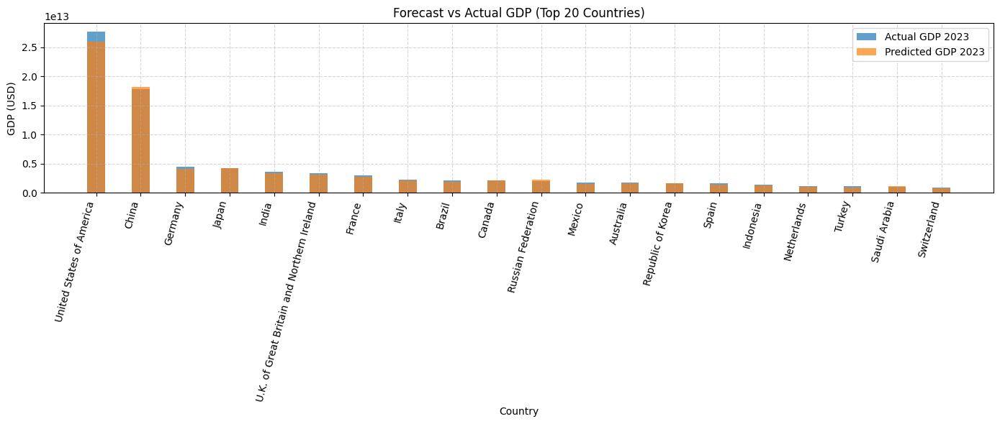

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

df = pd.read_csv('/content/drive/MyDrive/VIIRS/gdp_forecast_with_ground_truth_2023.csv')
df = df.sort_values(by='GroundTruth_2023', ascending=False)
top_n = 20
df_top = df.head(top_n)

plt.figure(figsize=(14, 6))
plt.bar(df_top['Country'], df_top['GroundTruth_2023'], width=0.4, label='Actual GDP 2023', alpha=0.7)
plt.bar(df_top['Country'], df_top['Forecast_2023'], width=0.4, label='Predicted GDP 2023', alpha=0.7)
plt.title(f'Forecast vs Actual GDP (Top {top_n} Countries)')
plt.xlabel('Country')
plt.ylabel('GDP (USD)')
plt.xticks(rotation=75, ha='right')
plt.legend()
plt.tight_layout()
plt.grid(True, linestyle='--', alpha=0.5)

# Show plot
plt.show()



**LSTM + TCN**

In [ ]:
!pip install --upgrade --force-reinstall tensorflow


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.0/62.0 kB 2.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 48.9/48.9 kB 4.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 644.9/644.9 MB 2.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 135.6/135.6 kB 9.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 57.5/57.5 kB 4.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.9/5.9 MB 101.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.5/4.5 MB 83.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 61.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.5/24.5 MB 73.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.7/4.7 MB 88.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 16.3/16.3 MB 93.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 71.9/71.9 kB 3.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 319.7/319.7 k

In [ ]:
import numpy as np
import pandas as pd
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_absolute_error, r2_score
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense

# File paths
gdp_path = '/content/drive/MyDrive/VIIRS/updated_gdp.csv'
avg_path = '/content/drive/MyDrive/VIIRS/TimeSeries_average_masked.csv'
max_path = '/content/drive/MyDrive/VIIRS/TimeSeries_maximum.csv'
min_path = '/content/drive/MyDrive/VIIRS/TimeSeries_minimum.csv'
med_path = '/content/drive/MyDrive/VIIRS/TimeSeries_median_masked.csv'

# Load data
gdp_df = pd.read_csv(gdp_path)
avg_df = pd.read_csv(avg_path)
max_df = pd.read_csv(max_path)
min_df = pd.read_csv(min_path)
med_df = pd.read_csv(med_path)

# Drop 2024
for df in [avg_df, max_df, min_df, med_df]:
    if '2024' in df.columns:
        df.drop(columns='2024', inplace=True)
gdp_df.rename(columns={'Country Name': 'Country'}, inplace=True)

# Melt to long format (year-wise)
avg_df = avg_df.melt(id_vars='Country', var_name='Year', value_name='Avg_Masked')
max_df = max_df.melt(id_vars='Country', var_name='Year', value_name='Maximum')
min_df = min_df.melt(id_vars='Country', var_name='Year', value_name='Minimum')
med_df = med_df.melt(id_vars='Country', var_name='Year', value_name='Median_Masked')
gdp_df = gdp_df.melt(id_vars='Country', var_name='Year', value_name='GDP')

# Merge all bands
df = avg_df.merge(max_df, on=['Country', 'Year'])
df = df.merge(min_df, on=['Country', 'Year'])
df = df.merge(med_df, on=['Country', 'Year'])
df = df.merge(gdp_df, on=['Country', 'Year'])

# Convert year to int
df['Year'] = df['Year'].astype(int)

# Sort for time series
df.sort_values(by=['Country', 'Year'], inplace=True)

# Create sequences per country
sequence_length = 10
X, y = [], []
country_ids = []
scalers = {}

for country in df['Country'].unique():
    country_df = df[df['Country'] == country].copy()

    if len(country_df) <= sequence_length:
        continue

    features = country_df[['Avg_Masked', 'Maximum', 'Minimum', 'Median_Masked']].values
    target = country_df['GDP'].values.reshape(-1, 1)

    scaler = MinMaxScaler()
    scaled = scaler.fit_transform(np.hstack((target, features)))
    scalers[country] = scaler

    for i in range(sequence_length, len(scaled)):
        year = country_df.iloc[i]['Year']
        if year == 2023:
            X.append(scaled[i-sequence_length:i, 1:])  # Features only
            y.append(scaled[i, 0])  # GDP only
            country_ids.append(country)


X = np.array(X)
y = np.array(y)

# Train/test split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, shuffle=False)
country_ids_test = country_ids[len(X_train):]

# Build LSTM model
model = Sequential([
    LSTM(64, input_shape=(X_train.shape[1], X_train.shape[2]), return_sequences=False),
    Dense(1)
])
model.compile(optimizer='adam', loss='mse')
model.fit(X_train, y_train, epochs=50, batch_size=8, validation_data=(X_test, y_test))

# Predict
y_pred_scaled = model.predict(X_test).flatten()

# Inverse transform predictions and targets
y_true_inv, y_pred_inv = [], []

for i in range(len(y_test)):
    country = country_ids_test[i]
    scaler = scalers[country]

    dummy_input = np.zeros((1, 5))  # 1 GDP + 4 features
    dummy_input[0, 0] = y_test[i]
    y_true_inv.append(scaler.inverse_transform(dummy_input)[0, 0])

    dummy_input[0, 0] = y_pred_scaled[i]
    y_pred_inv.append(scaler.inverse_transform(dummy_input)[0, 0])

# Evaluate on original scale
mse = mean_absolute_error(y_true_inv, y_pred_inv)
r2 = r2_score(y_true_inv, y_pred_inv)

print(f"Inverse Transformed Mean Absolute Error: {mse}")
print(f"Inverse Transformed R-squared: {r2}")


Epoch 1/50


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


18/18 ━━━━━━━━━━━━━━━━━━━━ 3s 44ms/step - loss: 0.3520 - val_loss: 0.0959
Epoch 2/50
18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0897 - val_loss: 0.0638
Epoch 3/50
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0704 - val_loss: 0.0667
Epoch 4/50
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0548 - val_loss: 0.0616
Epoch 5/50
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0580 - val_loss: 0.0622
Epoch 6/50
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0504 - val_loss: 0.0609
Epoch 7/50
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0432 - val_loss: 0.0625
Epoch 8/50
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.0504 - val_loss: 0.0619
Epoch 9/50
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.0507 - val_loss: 0.0625
Epoch 10/50
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.0433 - val_loss: 0.0643
Epoch 11/50
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0487 - val_loss: 0.0754
Epoch 12/50
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.0396 - val_loss: 0

In [ ]:
!pip install keras-tcn --quiet


In [ ]:
import numpy as np
import pandas as pd
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_absolute_error, r2_score
from tcn import TCN
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense

# File paths
gdp_path = '/content/drive/MyDrive/VIIRS/updated_gdp.csv'
avg_path = '/content/drive/MyDrive/VIIRS/TimeSeries_average_masked.csv'
max_path = '/content/drive/MyDrive/VIIRS/TimeSeries_maximum.csv'
min_path = '/content/drive/MyDrive/VIIRS/TimeSeries_minimum.csv'
med_path = '/content/drive/MyDrive/VIIRS/TimeSeries_median_masked.csv'

# Load data
gdp_df = pd.read_csv(gdp_path)
avg_df = pd.read_csv(avg_path)
max_df = pd.read_csv(max_path)
min_df = pd.read_csv(min_path)
med_df = pd.read_csv(med_path)

# Drop 2024
for df in [avg_df, max_df, min_df, med_df]:
    if '2024' in df.columns:
        df.drop(columns='2024', inplace=True)
gdp_df.rename(columns={'Country Name': 'Country'}, inplace=True)

# Melt to long format (year-wise)
avg_df = avg_df.melt(id_vars='Country', var_name='Year', value_name='Avg_Masked')
max_df = max_df.melt(id_vars='Country', var_name='Year', value_name='Maximum')
min_df = min_df.melt(id_vars='Country', var_name='Year', value_name='Minimum')
med_df = med_df.melt(id_vars='Country', var_name='Year', value_name='Median_Masked')
gdp_df = gdp_df.melt(id_vars='Country', var_name='Year', value_name='GDP')

# Merge all bands
df = avg_df.merge(max_df, on=['Country', 'Year'])
df = df.merge(min_df, on=['Country', 'Year'])
df = df.merge(med_df, on=['Country', 'Year'])
df = df.merge(gdp_df, on=['Country', 'Year'])

# Convert year to int
df['Year'] = df['Year'].astype(int)

# Sort for time series
df.sort_values(by=['Country', 'Year'], inplace=True)

# Create sequences per country
sequence_length = 10
X, y = [], []
country_ids = []
scalers = {}

for country in df['Country'].unique():
    country_df = df[df['Country'] == country].copy()

    if len(country_df) <= sequence_length:
        continue

    features = country_df[['Avg_Masked', 'Maximum', 'Minimum', 'Median_Masked']].values
    target = country_df['GDP'].values.reshape(-1, 1)

    scaler = MinMaxScaler()
    scaled = scaler.fit_transform(np.hstack((target, features)))
    scalers[country] = scaler

    for i in range(sequence_length, len(scaled)):
        year = country_df.iloc[i]['Year']
        if year == 2023:
            X.append(scaled[i-sequence_length:i, 1:])  # Features only
            y.append(scaled[i, 0])  # GDP only
            country_ids.append(country)


X = np.array(X)
y = np.array(y)

# Train/test split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, shuffle=False)
country_ids_test = country_ids[len(X_train):]

# Build LSTM model
model = Sequential([
    TCN(input_shape=(X_train.shape[1], X_train.shape[2]), nb_filters=64, kernel_size=3, dilations=[1, 2, 4, 8], dropout_rate=0.2),
    Dense(1)
])
model.compile(optimizer='adam', loss='mse')
model.fit(X_train, y_train, epochs=50, batch_size=8, validation_data=(X_test, y_test))

# Predict
y_pred_scaled = model.predict(X_test).flatten()

# Inverse transform predictions and targets
y_true_inv, y_pred_inv = [], []

for i in range(len(y_test)):
    country = country_ids_test[i]
    scaler = scalers[country]

    dummy_input = np.zeros((1, 5))  # 1 GDP + 4 features
    dummy_input[0, 0] = y_test[i]
    y_true_inv.append(scaler.inverse_transform(dummy_input)[0, 0])

    dummy_input[0, 0] = y_pred_scaled[i]
    y_pred_inv.append(scaler.inverse_transform(dummy_input)[0, 0])

# Evaluate on original scale
mse = mean_absolute_error(y_true_inv, y_pred_inv)
r2 = r2_score(y_true_inv, y_pred_inv)

print(f"Inverse Transformed Mean Absolute Error: {mse}")
print(f"Inverse Transformed R-squared: {r2}")


/usr/local/lib/python3.11/dist-packages/tcn/tcn.py:268: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super(TCN, self).__init__(**kwargs)


Epoch 1/50
18/18 ━━━━━━━━━━━━━━━━━━━━ 9s 82ms/step - loss: 3.4643 - val_loss: 0.4711
Epoch 2/50
18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.9583 - val_loss: 0.1873
Epoch 3/50
18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 32ms/step - loss: 0.7032 - val_loss: 0.1071
Epoch 4/50
18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 32ms/step - loss: 0.5080 - val_loss: 0.1141
Epoch 5/50
18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 45ms/step - loss: 0.3603 - val_loss: 0.1426
Epoch 6/50
18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.2855 - val_loss: 0.1241
Epoch 7/50
18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.2144 - val_loss: 0.0799
Epoch 8/50
18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.2687 - val_loss: 0.0564
Epoch 9/50
18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 52ms/step - loss: 0.2247 - val_loss: 0.0756
Epoch 10/50
18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.2152 - val_loss: 0.0554
Epoch 11/50
18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step - loss: 0.1565 - val_loss: 0.0592
Epoch 12/50
18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 33ms/step - loss: 0.1

**CORELATION OF GDP AND NTL DATA:**

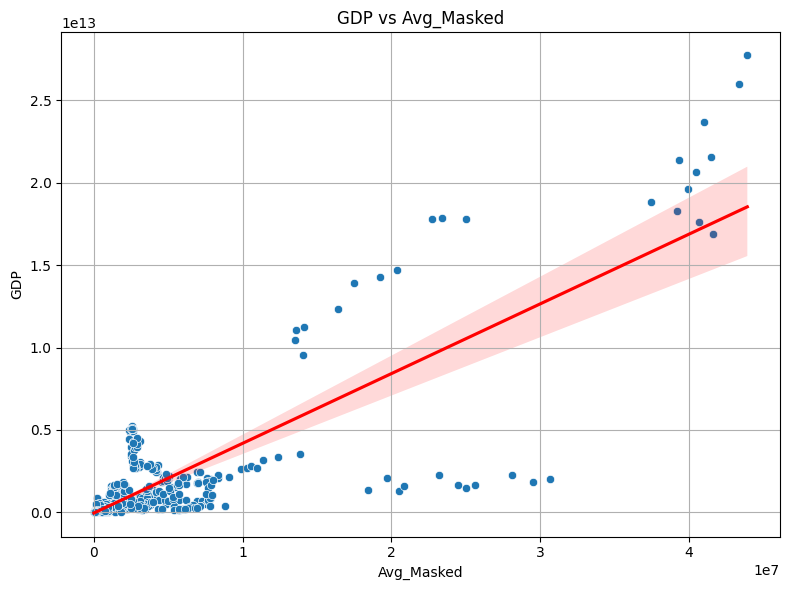

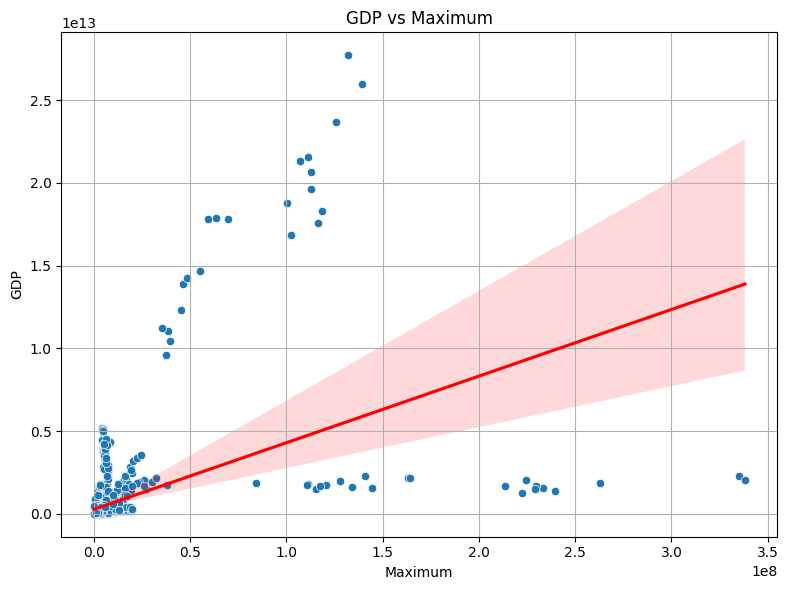

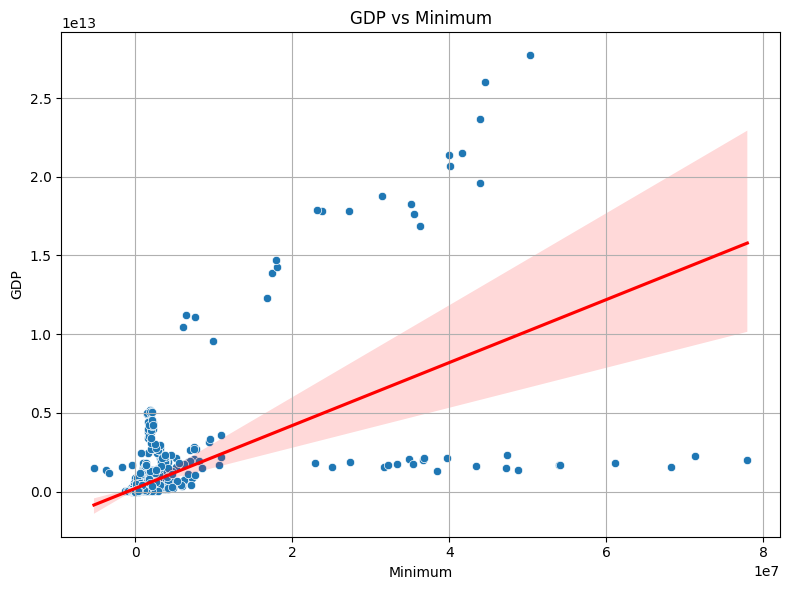

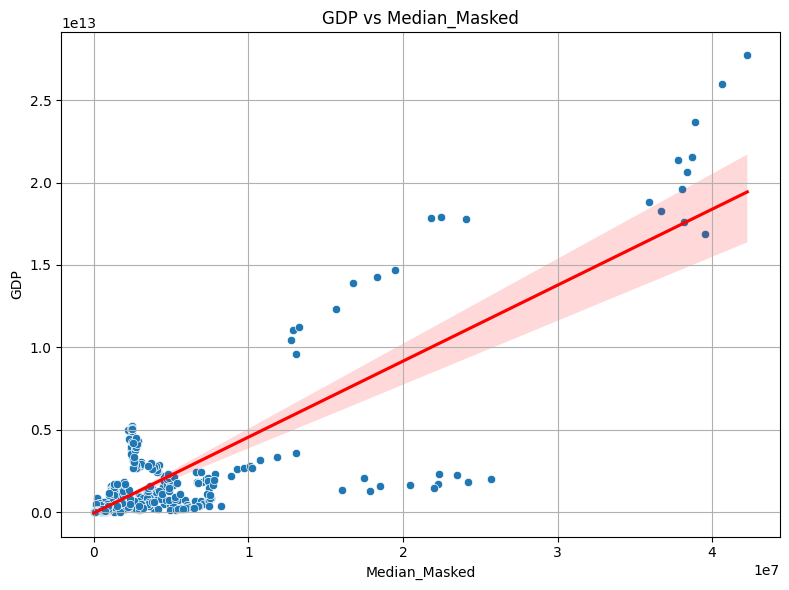

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
gdp_path = '/content/drive/MyDrive/VIIRS/updated_gdp.csv'
avg_path = '/content/drive/MyDrive/VIIRS/TimeSeries_average_masked.csv'
max_path = '/content/drive/MyDrive/VIIRS/TimeSeries_maximum.csv'
min_path = '/content/drive/MyDrive/VIIRS/TimeSeries_minimum.csv'
med_path = '/content/drive/MyDrive/VIIRS/TimeSeries_median_masked.csv'
gdp_df = pd.read_csv(gdp_path)
avg_df = pd.read_csv(avg_path)
max_df = pd.read_csv(max_path)
min_df = pd.read_csv(min_path)
med_df = pd.read_csv(med_path)
gdp_df.rename(columns={'Country Name': 'Country'}, inplace=True)
def reshape(df, value_name):
    df = df.melt(id_vars=['Country'], var_name='Year', value_name=value_name)
    df['Year'] = df['Year'].astype(int)
    return df

gdp_df = reshape(gdp_df, 'GDP')
avg_df = reshape(avg_df, 'Avg_Masked')
max_df = reshape(max_df, 'Maximum')
min_df = reshape(min_df, 'Minimum')
med_df = reshape(med_df, 'Median_Masked')
merged = gdp_df.merge(avg_df, on=['Country', 'Year'])
merged = merged.merge(max_df, on=['Country', 'Year'])
merged = merged.merge(min_df, on=['Country', 'Year'])
merged = merged.merge(med_df, on=['Country', 'Year'])

# Plot correlations
features = ['Avg_Masked', 'Maximum', 'Minimum', 'Median_Masked']
for feature in features:
    plt.figure(figsize=(8, 6))
    sns.scatterplot(data=merged, x=feature, y='GDP')
    sns.regplot(data=merged, x=feature, y='GDP', scatter=False, color='red')
    plt.title(f'GDP vs {feature}')
    plt.xlabel(feature)
    plt.ylabel('GDP')
    plt.grid(True)
    plt.tight_layout()
    plt.show()


<ipython-input-26-95061b48048c>:1: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  yearly_corr_max = merged.groupby("Year").apply(lambda df: df["Maximum"].corr(df["GDP"]))


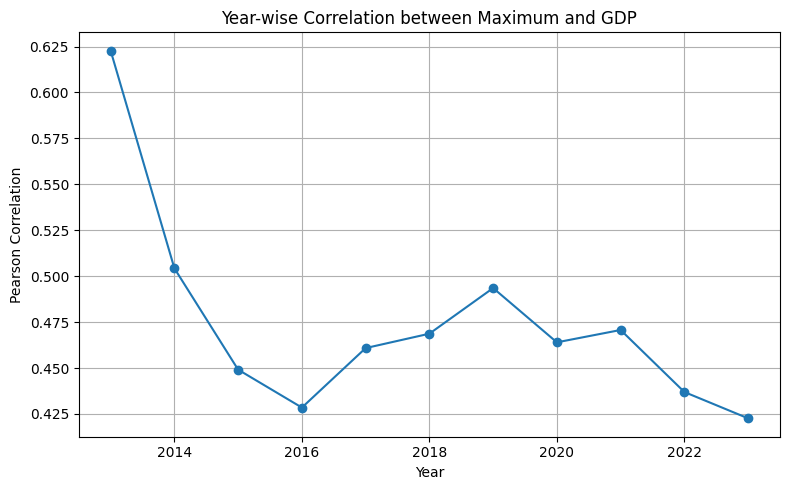

In [ ]:
yearly_corr_max = merged.groupby("Year").apply(lambda df: df["Maximum"].corr(df["GDP"]))
plt.figure(figsize=(8, 5))
yearly_corr_max.plot(marker='o')
plt.title("Year-wise Correlation between Maximum and GDP")
plt.ylabel("Pearson Correlation")
plt.xlabel("Year")
plt.grid(True)
plt.tight_layout()
plt.show()


<ipython-input-27-9552b69dd9ee>:1: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  yearly_corr_min = merged.groupby("Year").apply(lambda df: df["Minimum"].corr(df["GDP"]))


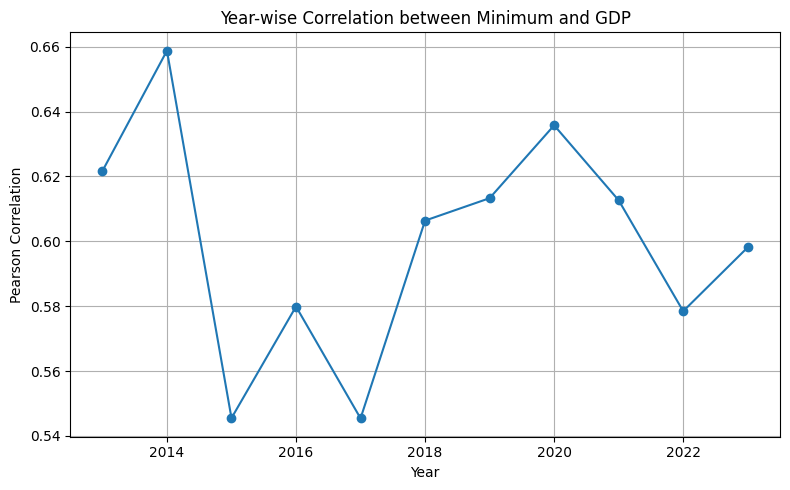

In [ ]:
yearly_corr_min = merged.groupby("Year").apply(lambda df: df["Minimum"].corr(df["GDP"]))
plt.figure(figsize=(8, 5))
yearly_corr_min.plot(marker='o')
plt.title("Year-wise Correlation between Minimum and GDP")
plt.ylabel("Pearson Correlation")
plt.xlabel("Year")
plt.grid(True)
plt.tight_layout()
plt.show()


<ipython-input-28-5b89bb0364fa>:1: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  yearly_corr_avg = merged.groupby("Year").apply(lambda df: df["Avg_Masked"].corr(df["GDP"]))


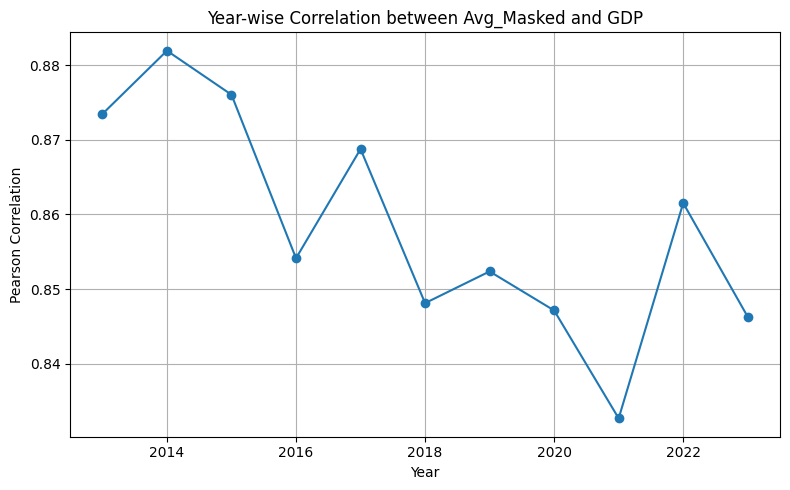

In [ ]:
yearly_corr_avg = merged.groupby("Year").apply(lambda df: df["Avg_Masked"].corr(df["GDP"]))
plt.figure(figsize=(8, 5))
yearly_corr_avg.plot(marker='o')
plt.title("Year-wise Correlation between Avg_Masked and GDP")
plt.ylabel("Pearson Correlation")
plt.xlabel("Year")
plt.grid(True)
plt.tight_layout()
plt.show()


<ipython-input-29-06228de5a13a>:1: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  yearly_corr_median = merged.groupby("Year").apply(lambda df: df["Median_Masked"].corr(df["GDP"]))


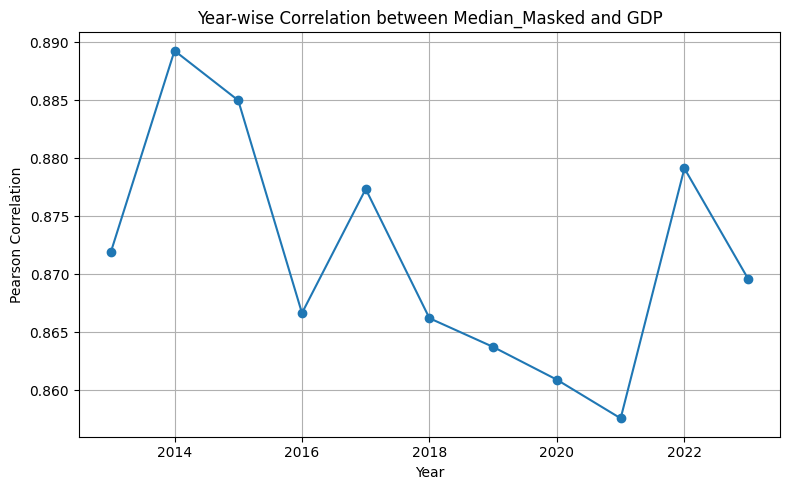

In [ ]:
yearly_corr_median = merged.groupby("Year").apply(lambda df: df["Median_Masked"].corr(df["GDP"]))
plt.figure(figsize=(8, 5))
yearly_corr_median.plot(marker='o')
plt.title("Year-wise Correlation between Median_Masked and GDP")
plt.ylabel("Pearson Correlation")
plt.xlabel("Year")
plt.grid(True)
plt.tight_layout()
plt.show()


**DATA VISUALIZATION:**

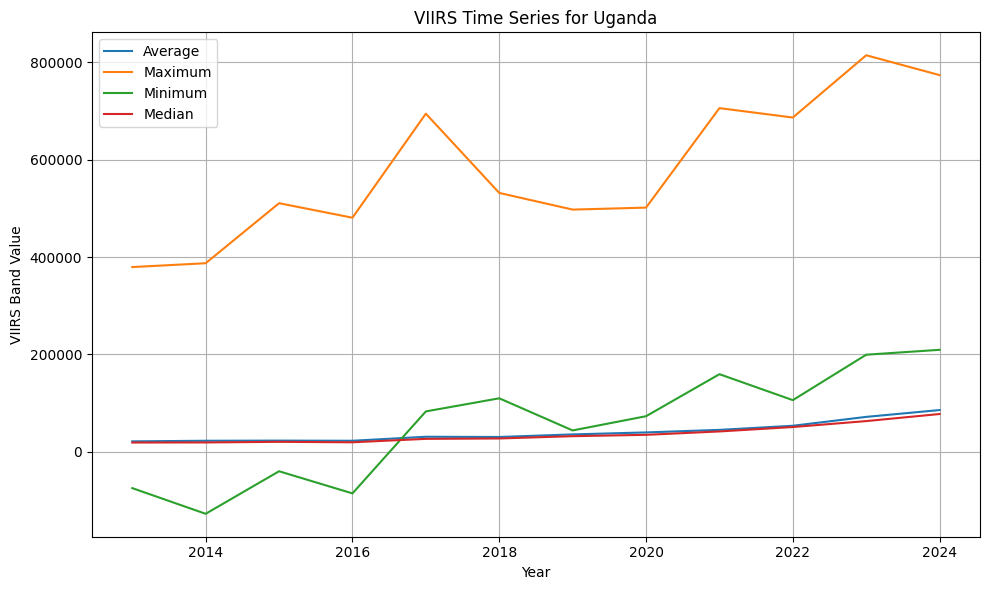

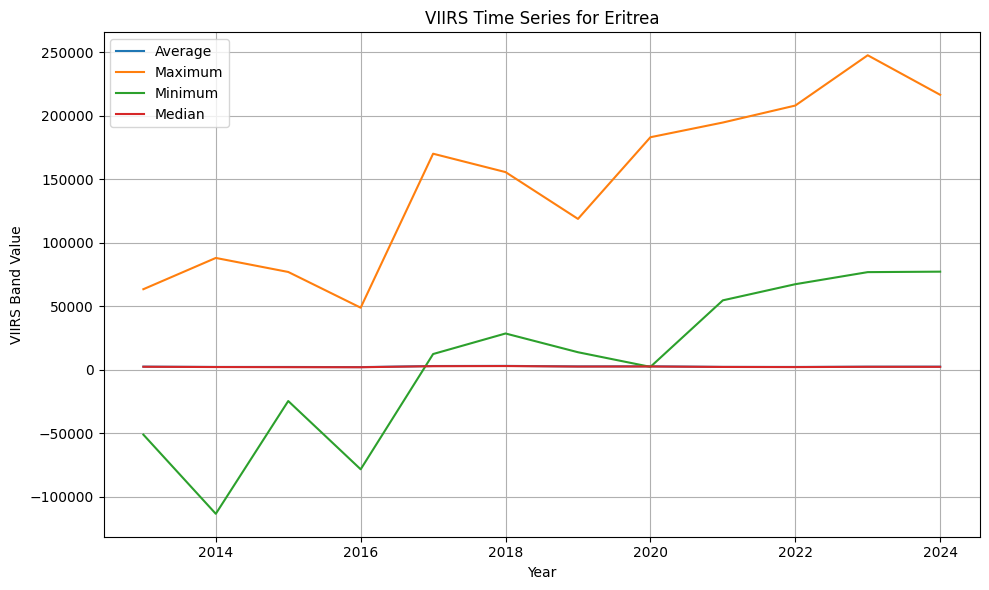

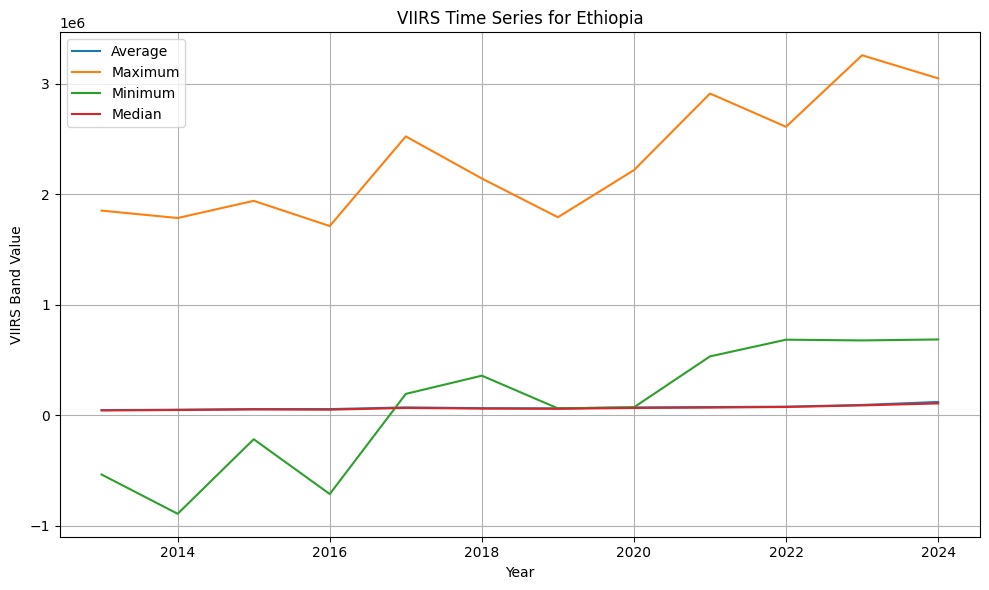

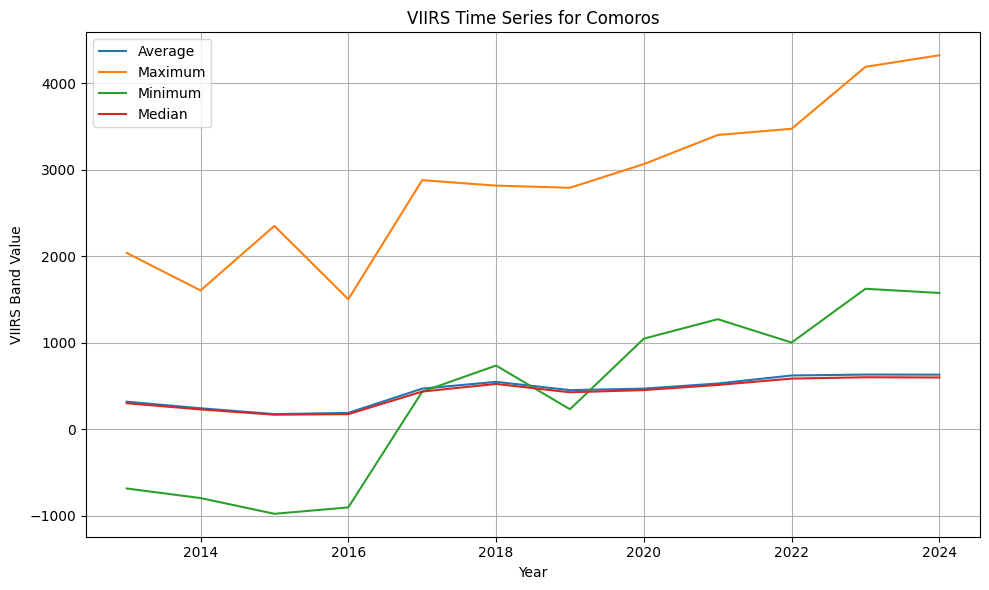

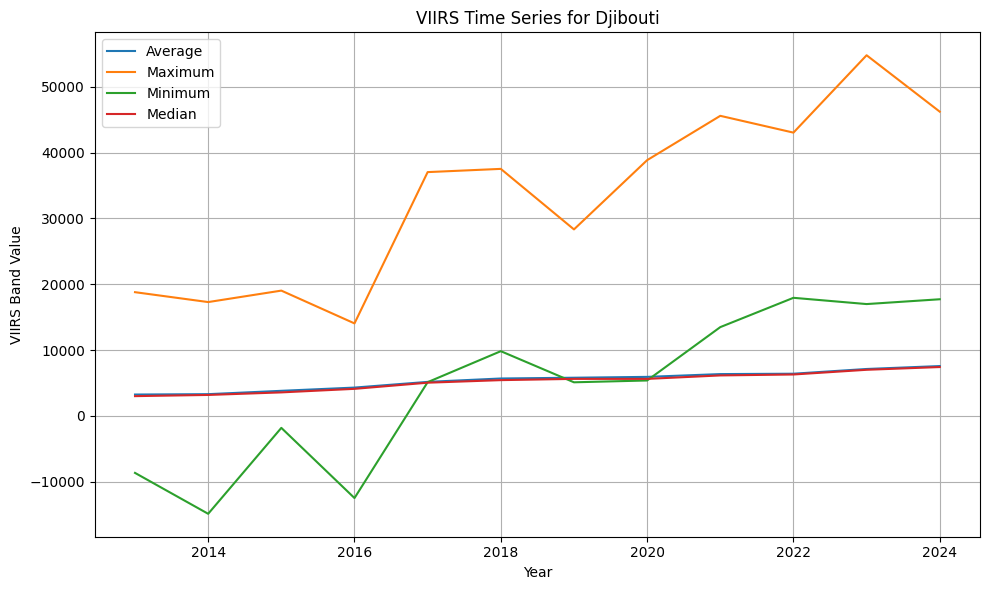

...

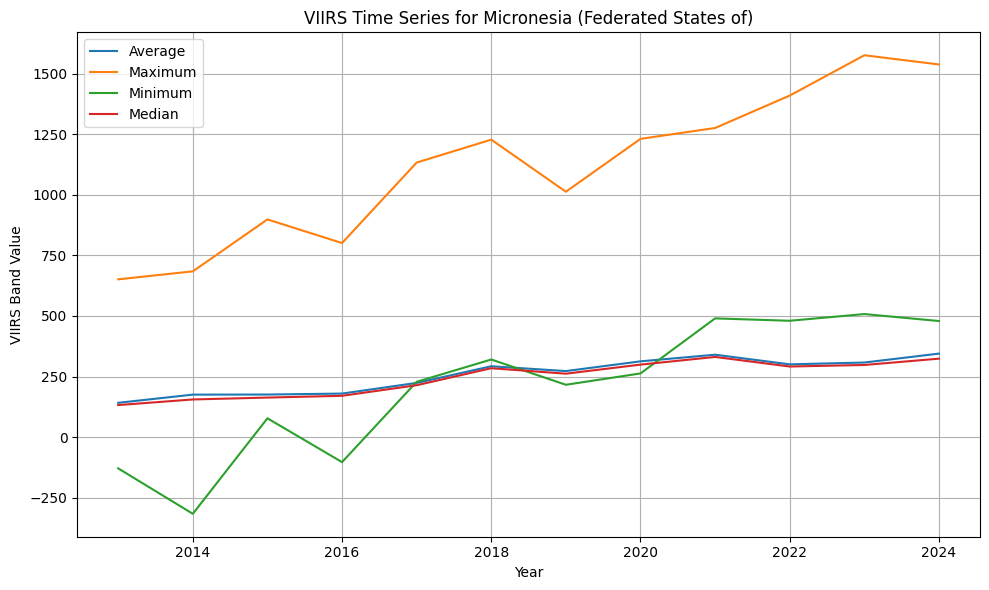

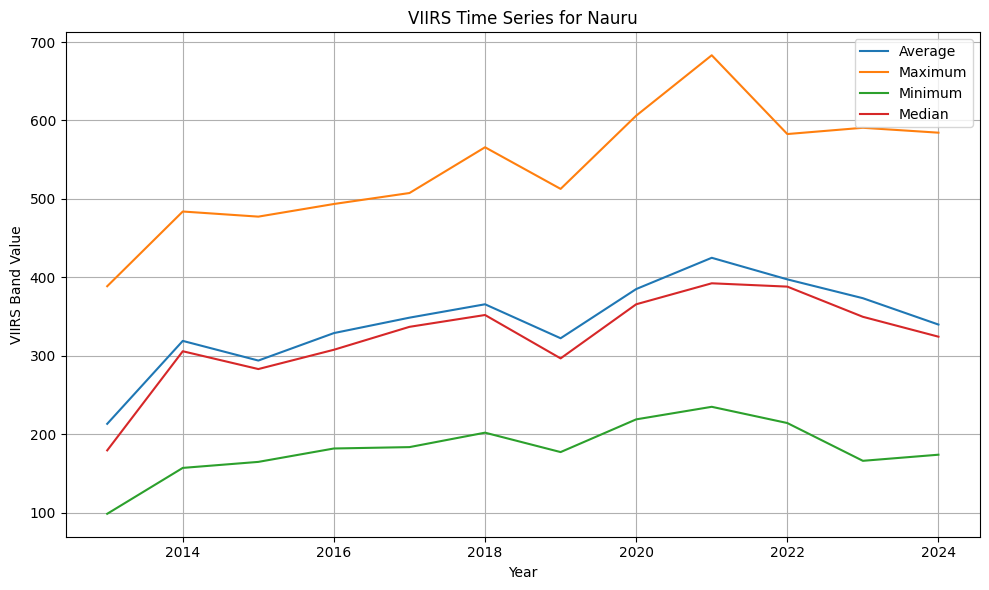

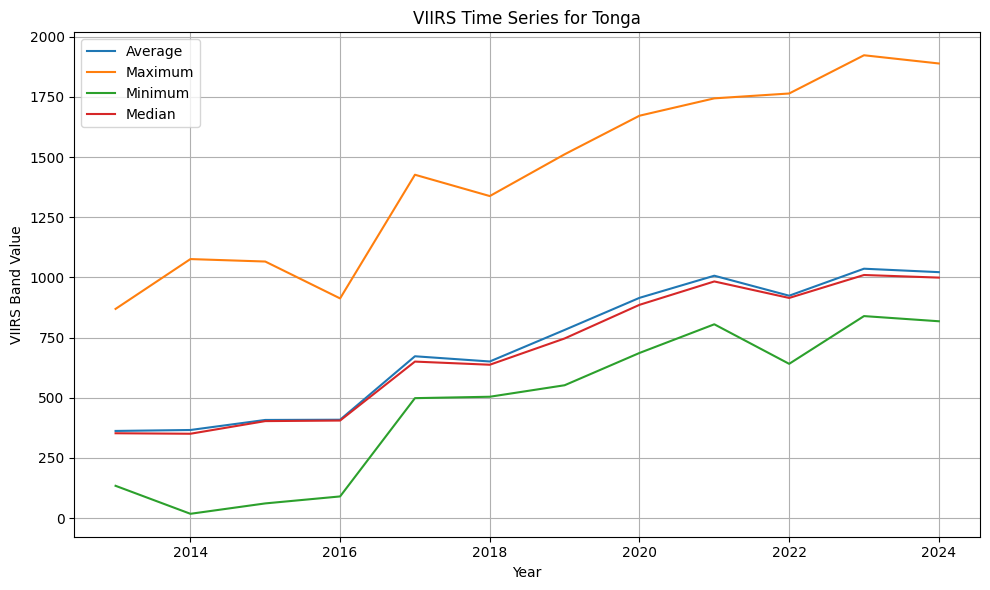

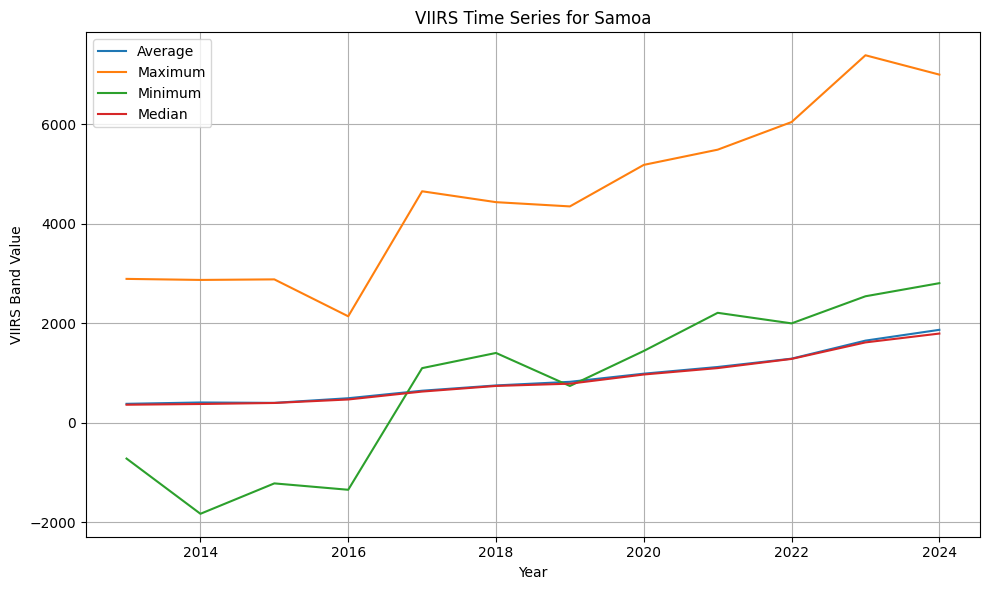

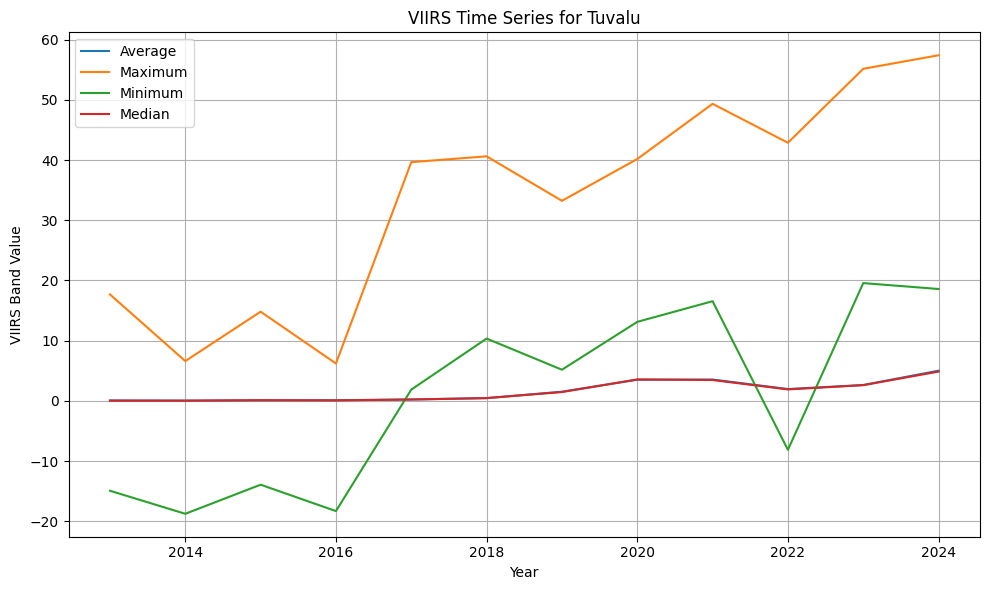

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Paths
gdp_path = '/content/drive/MyDrive/VIIRS/updated_gdp.csv'
avg_path = '/content/drive/MyDrive/VIIRS/TimeSeries_average_masked.csv'
max_path = '/content/drive/MyDrive/VIIRS/TimeSeries_maximum.csv'
min_path = '/content/drive/MyDrive/VIIRS/TimeSeries_minimum.csv'
med_path = '/content/drive/MyDrive/VIIRS/TimeSeries_median_masked.csv'

# Load
avg_df = pd.read_csv(avg_path)
max_df = pd.read_csv(max_path)
min_df = pd.read_csv(min_path)
med_df = pd.read_csv(med_path)
def melt_time_series(df, value_name):
    return df.melt(id_vars='Country', var_name='Year', value_name=value_name)

avg_long = melt_time_series(avg_df, 'Average')
max_long = melt_time_series(max_df, 'Maximum')
min_long = melt_time_series(min_df, 'Minimum')
med_long = melt_time_series(med_df, 'Median')

# Merge all into one DataFrame
merged = avg_long.merge(max_long, on=['Country', 'Year']) \
                 .merge(min_long, on=['Country', 'Year']) \
                 .merge(med_long, on=['Country', 'Year'])

# Convert year to int for proper plotting
merged['Year'] = merged['Year'].astype(int)
# Unique countries
countries = merged['Country'].unique()

# Plot for each country
for country in countries:
    subset = merged[merged['Country'] == country]
    plt.figure(figsize=(10, 6))
    plt.plot(subset['Year'], subset['Average'], label='Average')
    plt.plot(subset['Year'], subset['Maximum'], label='Maximum')
    plt.plot(subset['Year'], subset['Minimum'], label='Minimum')
    plt.plot(subset['Year'], subset['Median'], label='Median')
    plt.title(f'VIIRS Time Series for {country}')
    plt.xlabel('Year')
    plt.ylabel('VIIRS Band Value')
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()


**GDP VISUALIZATION (PREDICTED AND ACTUAL):**

In [ ]:
import pandas as pd
import plotly.express as px
#  data forcasted using sarimax
df = pd.read_csv('/content/drive/MyDrive/VIIRS/gdp_forecast_with_ground_truth_2023.csv')

# Ground Truth Map
if 'GroundTruth_2023' in df.columns:
    truth_map_df = df[['Country', 'GroundTruth_2023']].copy()
    fig_truth = px.choropleth(truth_map_df, locations='Country',
                              locationmode='country names',
                              color='GroundTruth_2023',
                              color_continuous_scale='Blues',
                              title='Ground Truth GDP - 2023')
    fig_truth.show()
else:
    print("Column 'GroundTruth_2023' not found.")

# Forecast Map
if 'Forecast_2023' in df.columns:
    forecast_map_df = df[['Country', 'Forecast_2023']].copy()
    fig_forecast = px.choropleth(forecast_map_df, locations='Country',
                                 locationmode='country names',
                                 color='Forecast_2023',
                                 color_continuous_scale='Greens',
                                 title='Forecasted GDP - 2023')
    fig_forecast.show()
else:
    print("Column 'Forecast_2023' not found.")
